In [4]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import *
import warnings
warnings.filterwarnings("ignore")
from yellowbrick.regressor import PredictionError
from sklearn.neural_network import MLPRegressor
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Dropout
from tensorflow.keras.optimizers import Adam,RMSprop,SGD
from scikeras.wrappers import KerasRegressor
import numpy as np
import keras_tuner
import keras
from keras import layers
import numpy as np
from tensorflow.keras.layers import LSTM, Dense
import os
from keras.callbacks import EarlyStopping
from sklearn.model_selection import RandomizedSearchCV
from keras.losses import mean_squared_error as mse_loss

2024-06-18 12:26:30.696657: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-06-18 12:26:30.696859: I external/local_tsl/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2024-06-18 12:26:30.698857: I external/local_tsl/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2024-06-18 12:26:30.721378: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-06-18 12:26:31.167501: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warnin

In [19]:


class DistrictAnalysis:
    def __init__(self, csv_file,year,n_steps):
        self.df_main = pd.read_csv(csv_file)
        self.year = year
        self.n_steps = n_steps
        self.plot_folder = "/home/ravi/myfolder/project/artpark/dengue data/plots"
        os.makedirs(self.plot_folder, exist_ok=True)

    def pop_mean(self):
        self.df_main = self.df_main[self.df_main['Year'].isin([2017,2018,2019,2022])]
        #self.df_main['Case_Count'] = self.df_main['Case_Count'] / (self.df_main['Population'] / 1000000)
        return self.df_main

    def process_district_data(self, district_name):
        df_c = self.df_main.loc[self.df_main['District'] == district_name]
        df_c = df_c.dropna().reset_index(drop=True)
        return df_c

    def split_train_test_LSTM(self,df):
        train_data = df[~(df['Year'].isin([self.year]))]
        #train_data = train_data[train_data['Record_Week'] < 46]

        test_data = df[df['Year'] == self.year]
        #test_data = test_data[test_data['Record_Week'] < 46]

        if self.n_steps > 0:
            last_rows = train_data.tail(self.n_steps)
            train_data = train_data.iloc[:-self.n_steps]
            test_data = pd.concat([last_rows, test_data], ignore_index=True)
   

        # Extracting features (X) and target variable (Y) for train and test sets
        x_train = train_data[["2m_Temperature", "2m_Dewpoint_Temperature", "Total_Precipitation"]]
        y_train = train_data["Case_Count"]

        x_test = test_data[["2m_Temperature", "2m_Dewpoint_Temperature", "Total_Precipitation"]]
        y_test = test_data["Case_Count"]


        scaler = StandardScaler()
        x_train_scaled = scaler.fit_transform(x_train)
        x_test_scaled = scaler.transform(x_test)

        return x_train_scaled, x_test_scaled, y_train, y_test
    
    def create_lstm_sequences(self,x_train, y_train):#, n_steps):
        if isinstance(y_train, pd.Series):
            y_train = y_train.to_numpy()

        if len(y_train.shape) == 1:  
            y_train = y_train.reshape(-1, 1)  

        num_samples = x_train.shape[0]  
        x_train_lstm = []
        y_train_lstm = []

        for i in range(num_samples - self.n_steps ):  
            x_train_sequence = x_train[i:i + self.n_steps]  
            y_train_label = y_train[i]  
            x_train_lstm.append(x_train_sequence)


        y_train_lstm = y_train[self.n_steps:]
        x_train_lstm = np.array(x_train_lstm)
        y_train_lstm = np.array(y_train_lstm)
        
        return x_train_lstm, y_train_lstm

    def lstm_regression(self,x_train, x_test, y_train, y_test):
    
        x_train = np.array(x_train)
        x_test = np.array(x_test)
        y_train = np.array(y_train)
        y_test = np.array(y_test)


        model = Sequential([
            LSTM(60, activation='relu', input_shape=(1, x_train.shape[2]), return_sequences=True),
            Dropout(0.2), 
            LSTM(40, activation='relu', return_sequences=False),
            Dropout(0.2), 
            
            Dense(1)  # Output layer with 1 neuron for regression
        ])

        # Compile the model
        optimizer = Adam()
        model.compile(optimizer=optimizer, loss='mean_squared_error')
        early_stopping = EarlyStopping(monitor='val_loss', patience=10, verbose=0, mode='min', restore_best_weights=True)

        
        history = model.fit(x_train, y_train, epochs=60, batch_size=32, verbose=0, validation_split=0.2,callbacks=[early_stopping])

        # Predict on the test data
        y_pred = model.predict(x_test)

        # Flatten predictions
        y_pred = y_pred.flatten()
        mse = mean_squared_error(y_test, y_pred)
        rmse = mse**0.5

        return y_pred,rmse, model, history
    
    
    def calculate_error_metrics(self, y_test, y_pred):
        mse = mean_squared_error(y_test, y_pred)
        mae = mean_absolute_error(y_test, y_pred)
        r2 = r2_score(y_test, y_pred)
        explained_variance = explained_variance_score(y_test, y_pred)
        median_ae = median_absolute_error(y_test, y_pred)
        max_err = max_error(y_test, y_pred)
        error_metrics = pd.DataFrame({
            'Error Metric': ['Mean Squared Error (MSE)', 'Mean Absolute Error (MAE)',
                             'R-squared (R2)', 'Explained Variance Score',
                             'Median Absolute Error', 'Maximum Error'],
            'Value': [mse, mae, r2, explained_variance, median_ae, max_err]
        })
        return error_metrics
    
    def plot_prediction(self, district_name, y_pred, y_test,rmse):
        y_pred =y_pred.reshape(-1)
        y_test =y_test.reshape(-1)
        mse = mean_squared_error(y_test, y_pred)

        plt.figure(figsize=(10, 6))
        plt.bar(range(len(y_test)), y_test, color='blue', label='Actual')
        plt.plot(range(len(y_pred)), y_pred, color='red', marker='o', linestyle='-',
                 linewidth=2, markersize=6, label='Predicted')
        plt.xlabel('Index')
        plt.ylabel('Values')
        plt.title(f'{district_name} {self.year} LSTM-{self.n_steps}')
        plt.legend(loc='upper left')
        plt.grid(True)
        plt.text(0.02, 0.88, f'RMSE: {rmse:.2f}', transform=plt.gca().transAxes, color='red',
                 weight='bold', verticalalignment='top', fontsize=12)

        # Save the plot
        district_plot_folder = os.path.join(self.plot_folder, district_name, f'LSTM-{self.n_steps}')
        os.makedirs(district_plot_folder, exist_ok=True)  # Create the folder if it doesn't exist
        plt.savefig(os.path.join(district_plot_folder, f'{self.year}-{self.n_steps} prediction_plot.png'))

        plt.show()

    def plot_loss(self, history, district_name):
        plt.plot(history.history['loss'])
        plt.plot(history.history['val_loss'])
        plt.title(f'{district_name} {self.year} LSTM-{self.n_steps}')
        plt.ylabel('Loss')
        plt.xlabel('Epoch')
        plt.legend(['Train', 'Validation'], loc='upper left')
        district_plot_folder = os.path.join(self.plot_folder, district_name, f'LSTM-{self.n_steps}')
        os.makedirs(district_plot_folder, exist_ok=True)  # Create the folder if it doesn't exist
        plt.savefig(os.path.join(district_plot_folder, f'{self.year}-{self.n_steps} loss_plot.png'))
        
        
        plt.show()
        
        
    
        


    def analyze_districts(self):
        unique_districts = self.df_main['District'].unique()
        all_district_data = []
        for district_name in unique_districts:
            print(f"Analyzing District: {district_name}")
            district_data = self.process_district_data(district_name)
            
            x_train_l, x_test_l, y_train_l, y_test_l = self.split_train_test_LSTM(district_data)
            
            x_train_lstm, y_train_lstm = self.create_lstm_sequences(x_train_l, y_train_l)
            x_test_lstm, y_test_lstm = self.create_lstm_sequences(x_test_l, y_test_l)
            
            y_pred_lstm, rmse_lstm, model_lstm, history_lstm = self.lstm_regression(x_train_lstm, x_test_lstm, y_train_lstm, y_test_lstm)
            performance = "Good" if rmse_lstm < 2 else "Bad"
            district_data = {
                "district": district_name,
                f"{self.year}_{self.n_steps}_rmse": rmse_lstm,
                f"{self.year}_{self.n_steps}performance": performance
            }
            all_district_data.append(district_data)
            final_df = pd.DataFrame(all_district_data)
            self.plot_loss(history_lstm,district_name)
            #print(y_pred_lstm.shape,y_test_lstm.shape)
            self.plot_prediction(district_name, y_pred_lstm, y_test_lstm,rmse_lstm)
            print("=" * 100)
        return final_df

    


In [ ]:
performance = "Good" if rmse_svr < 2 else "Bad"
    
            # Create a dictionary for each district's data
            district_data = {
                "district": district_name,
                f"{self.year_self.}_rmse": rmse_svr,
                f"{self.year}_performance": performance
            }
    
            all_district_data.append(district_data)
            final_df = pd.DataFrame(all_district_data)
            self.plot_prediction(district_name,rmse_svr, y_pred_svr, y_test)
            print("=" * 100)
        return final_df

Analyzing District: BAGALKOTE
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


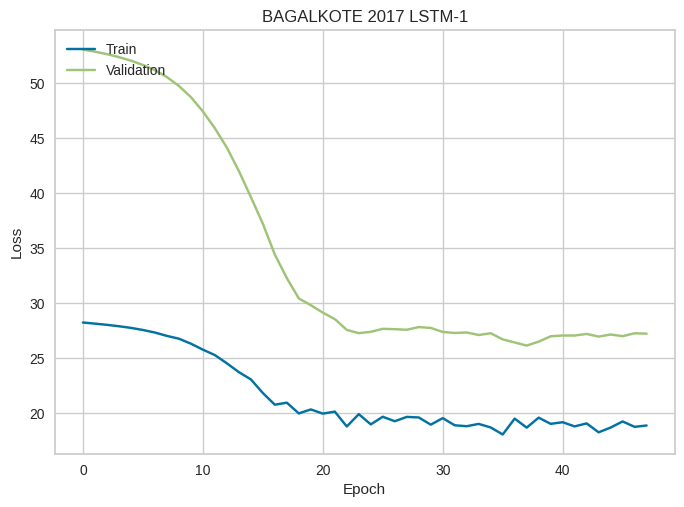

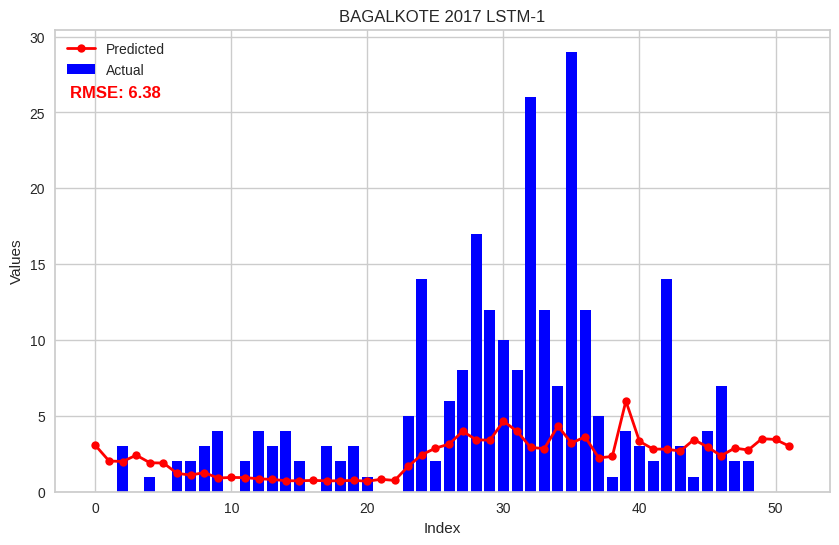

Analyzing District: BALLARI
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


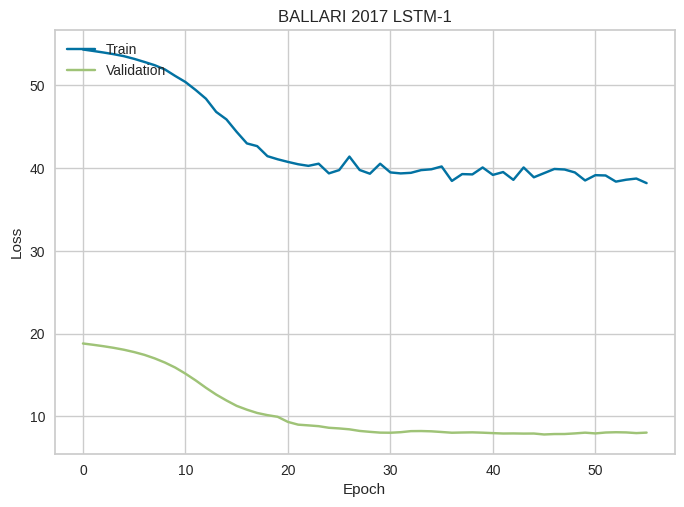

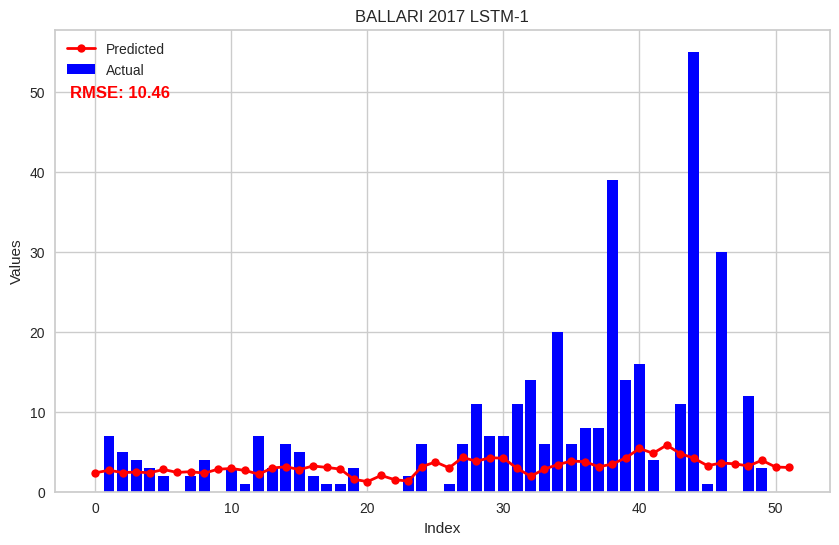

Analyzing District: BELAGAVI
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step


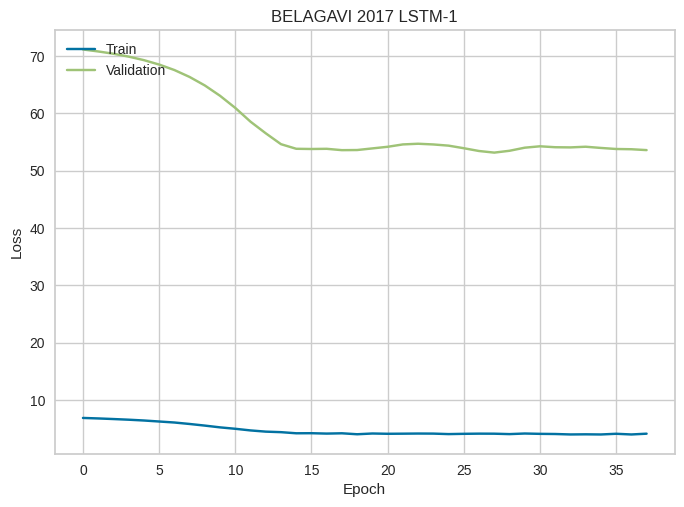

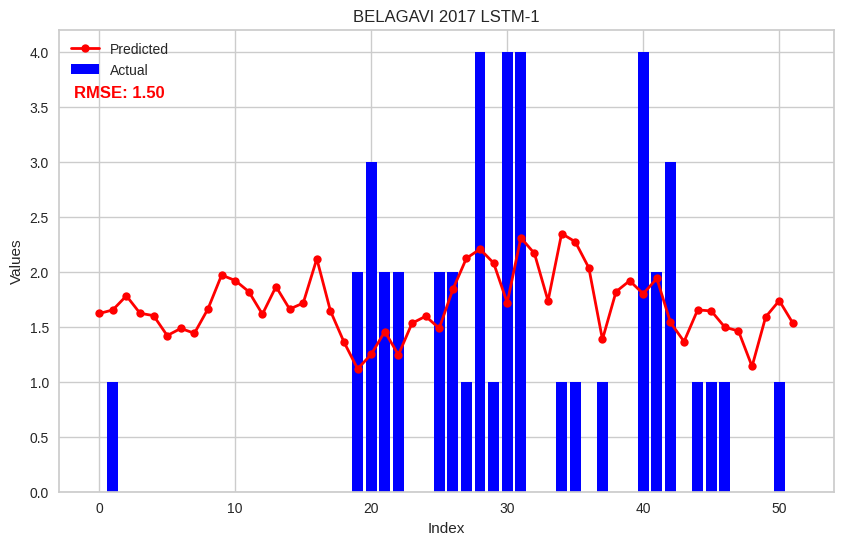

Analyzing District: BENGALURU RURAL
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


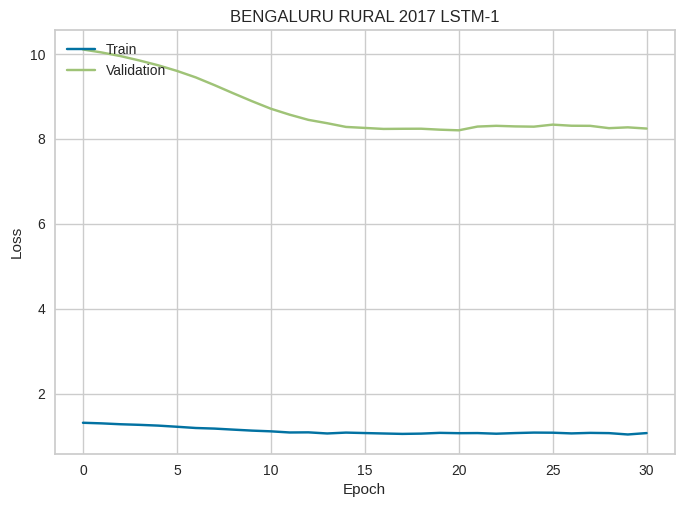

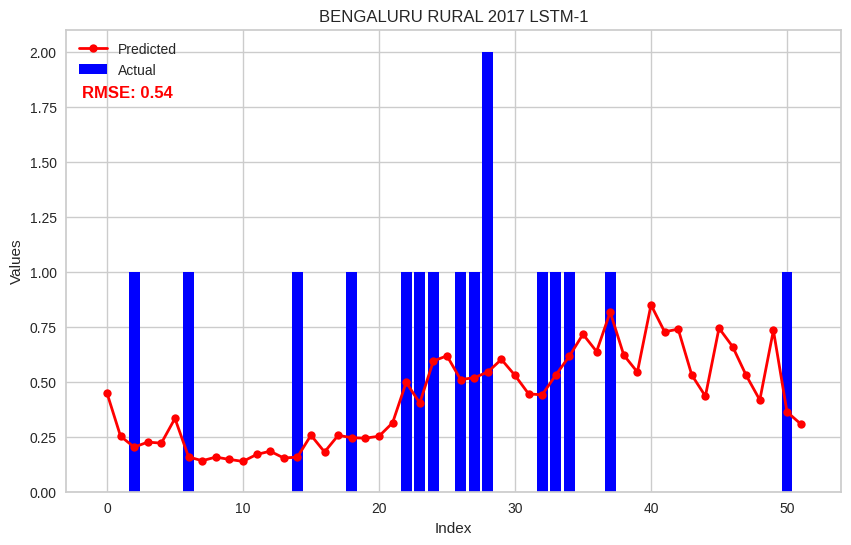

Analyzing District: BENGALURU URBAN
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


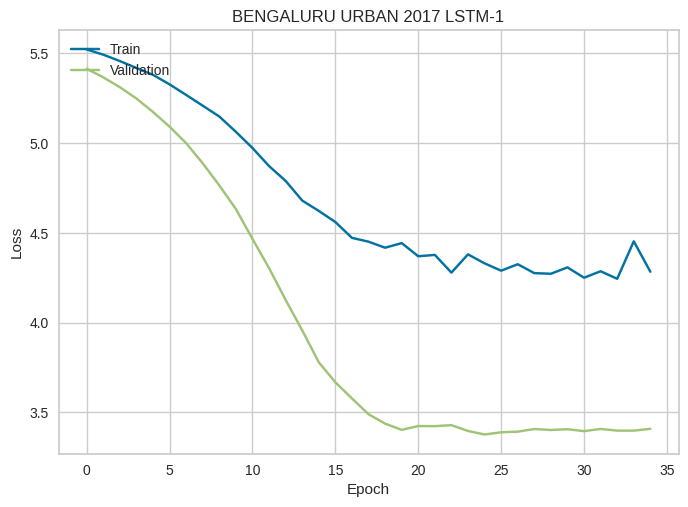

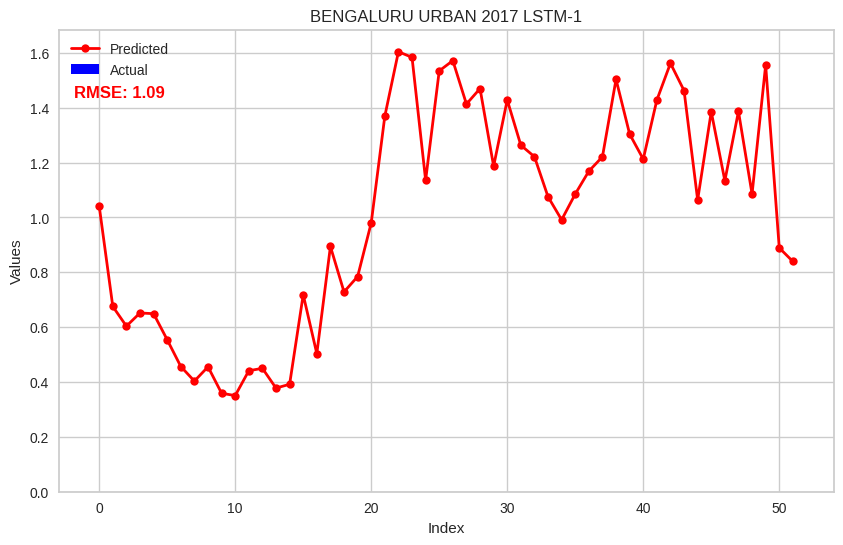

Analyzing District: BIDAR
2/2 ━━━━━━━━━━━━━━━━━━━━ 4s 109ms/step


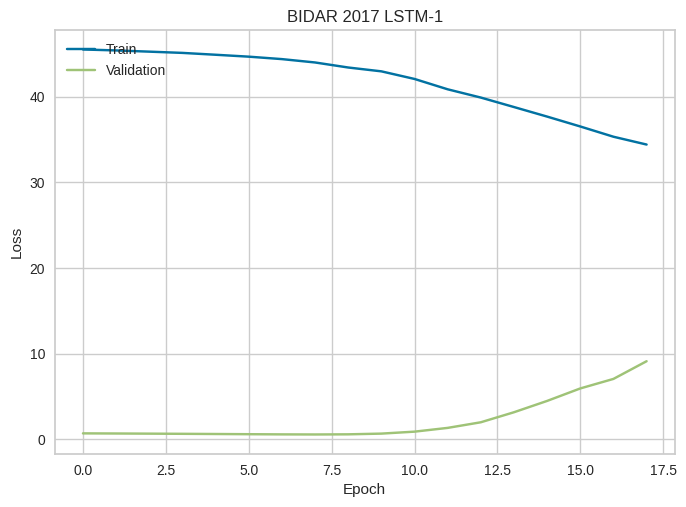

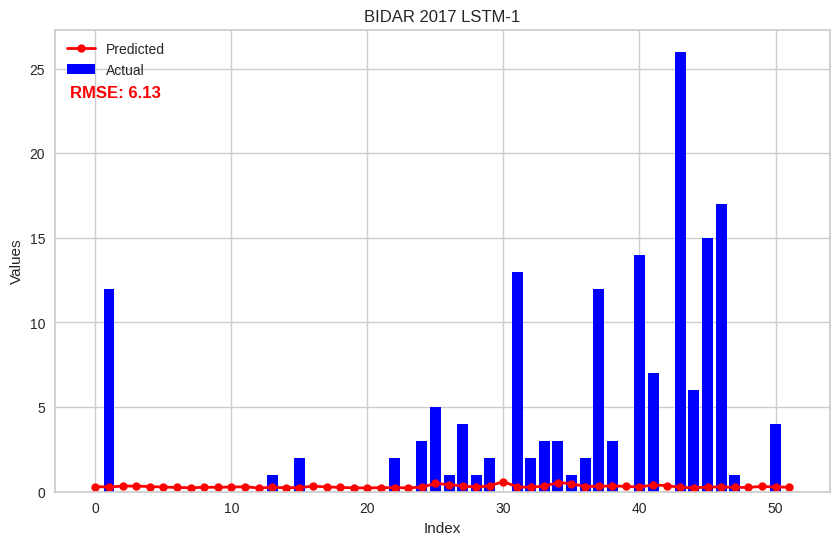

Analyzing District: CHAMARAJANAGARA
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


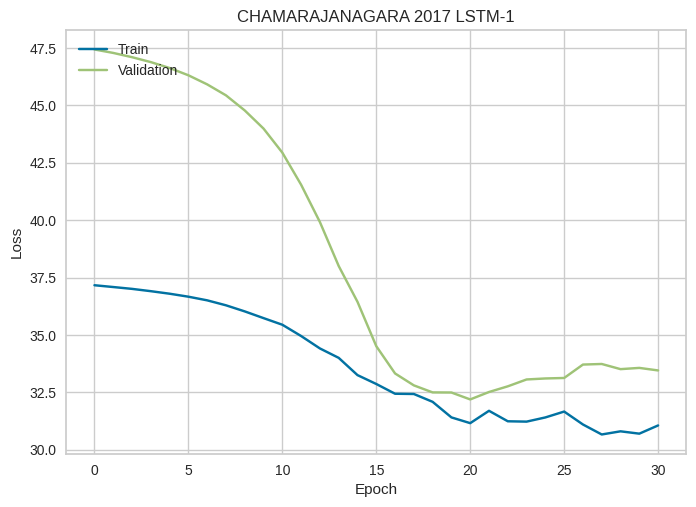

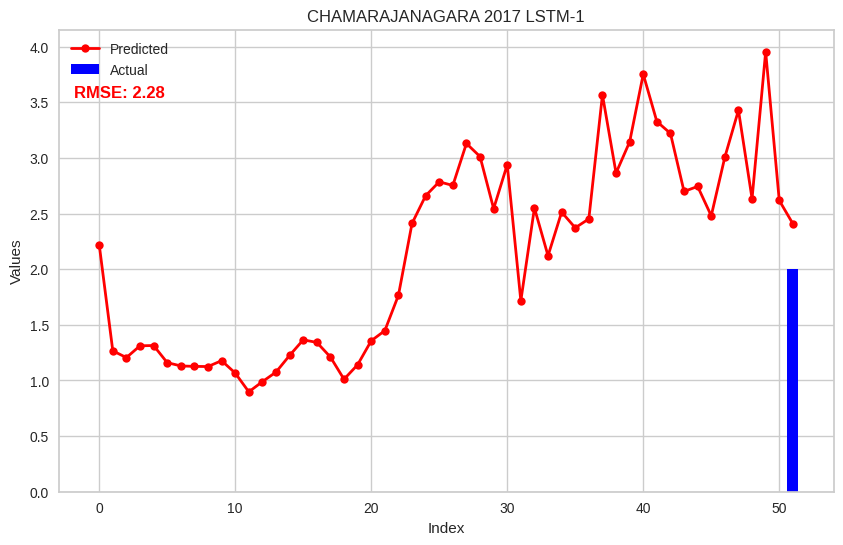

Analyzing District: CHIKKABALLAPURA
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


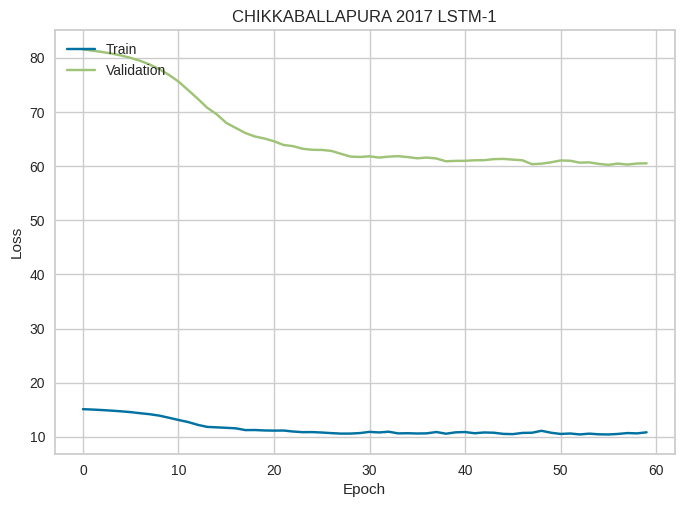

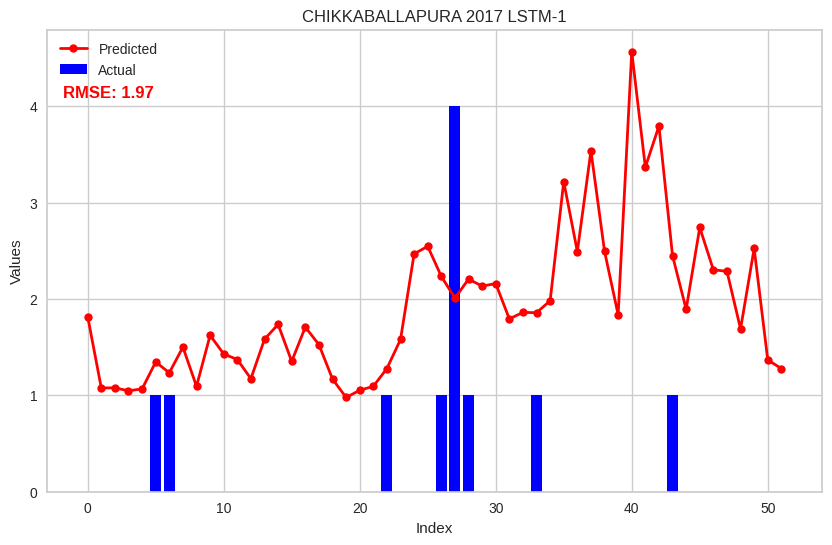

Analyzing District: CHIKKAMAGALURU
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step


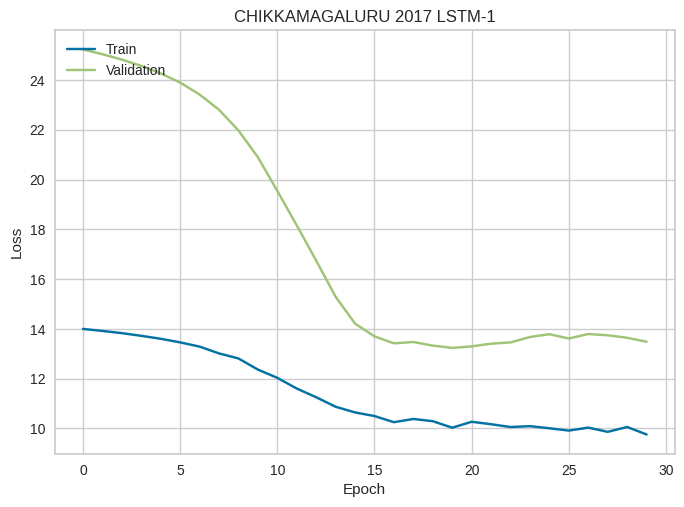

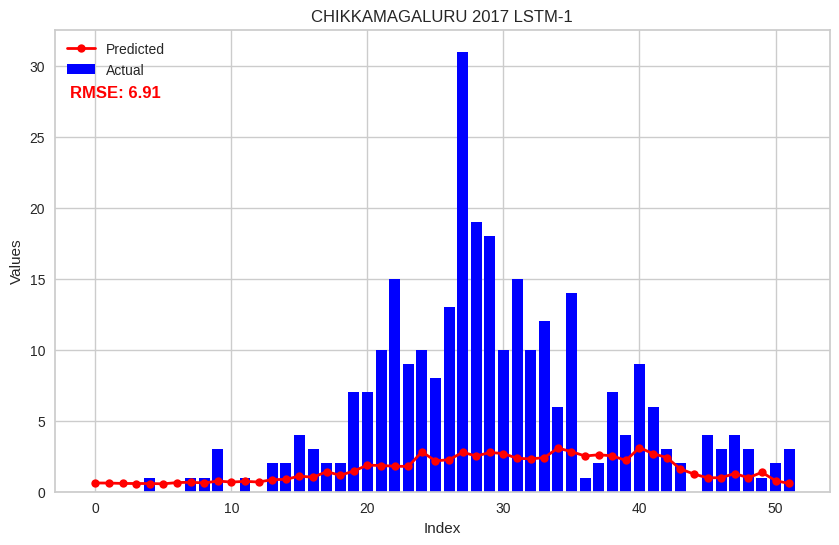

Analyzing District: CHITRADURGA
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


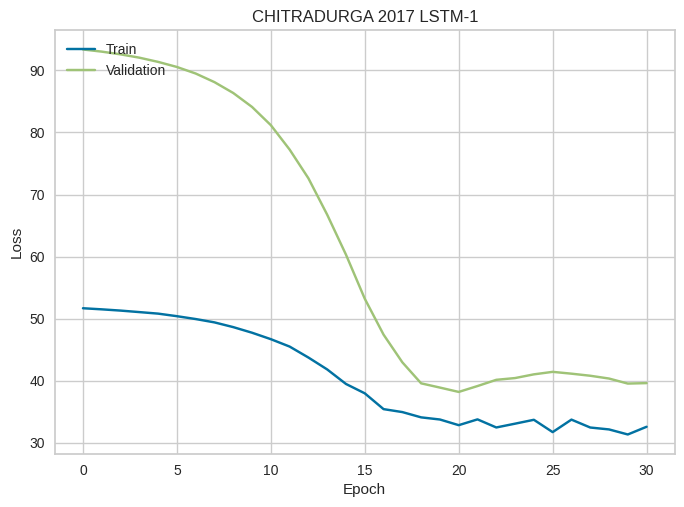

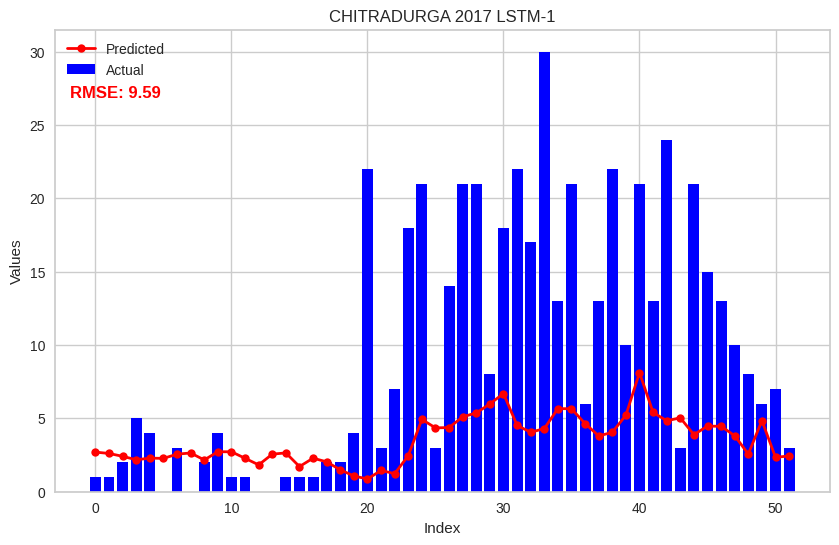

Analyzing District: DAKSHINA KANNADA
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


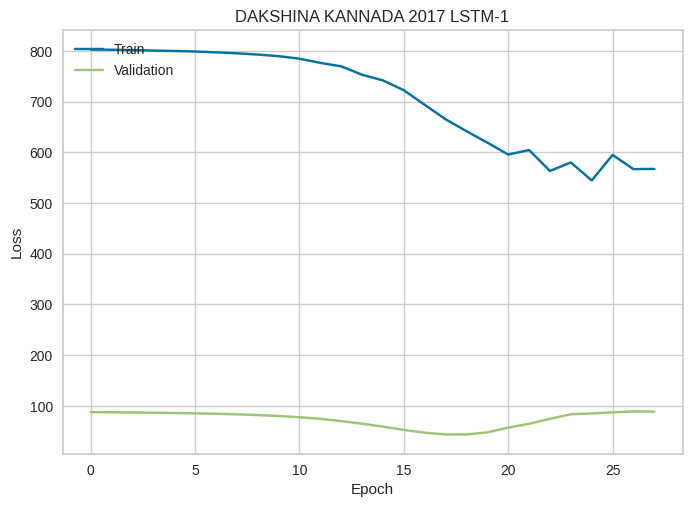

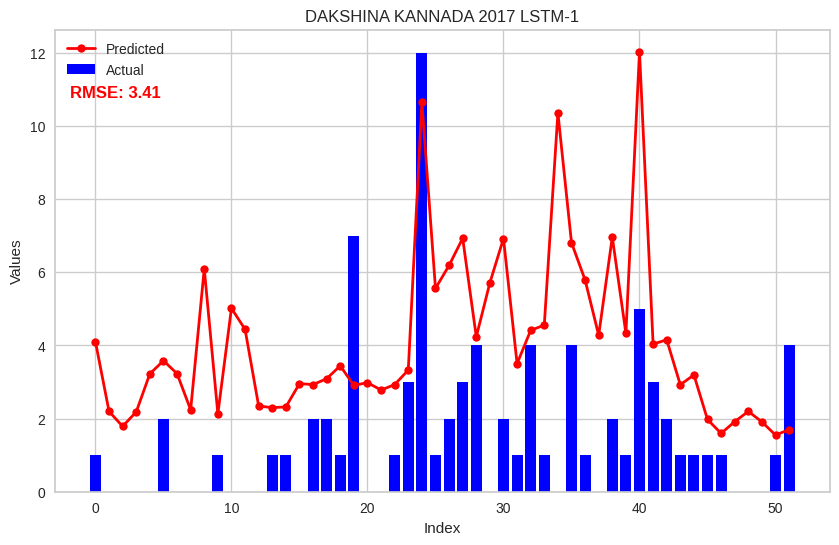

Analyzing District: DAVANGERE
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


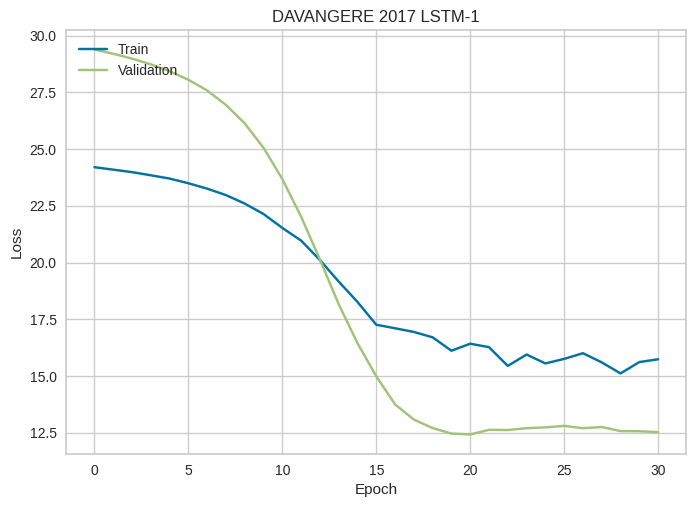

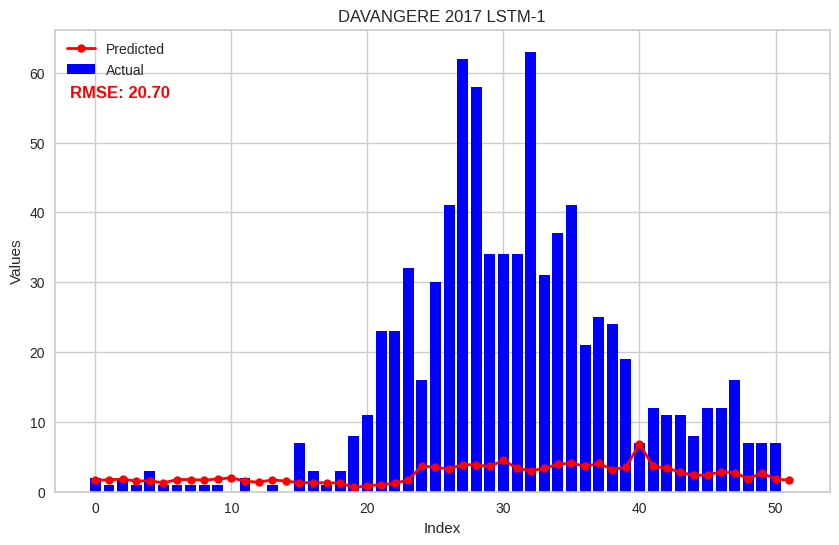

Analyzing District: DHARWAD
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


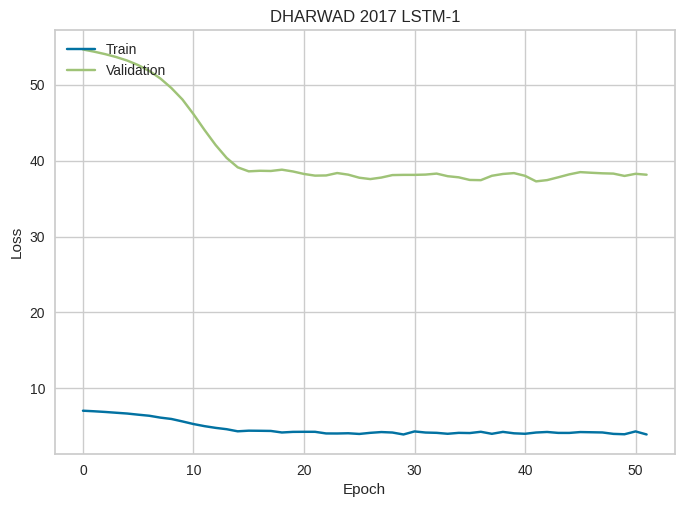

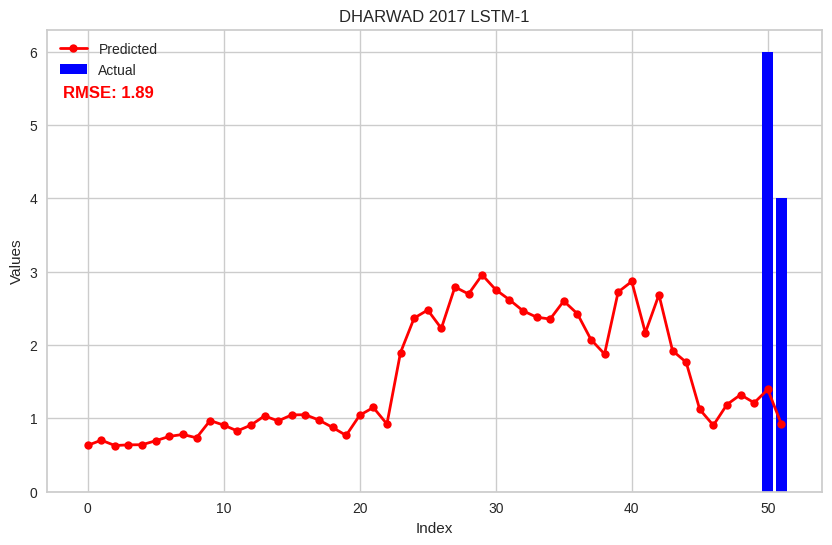

Analyzing District: GADAG
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


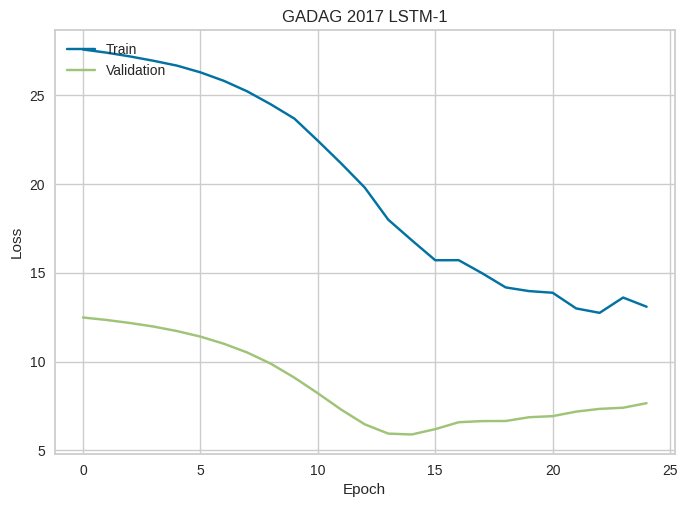

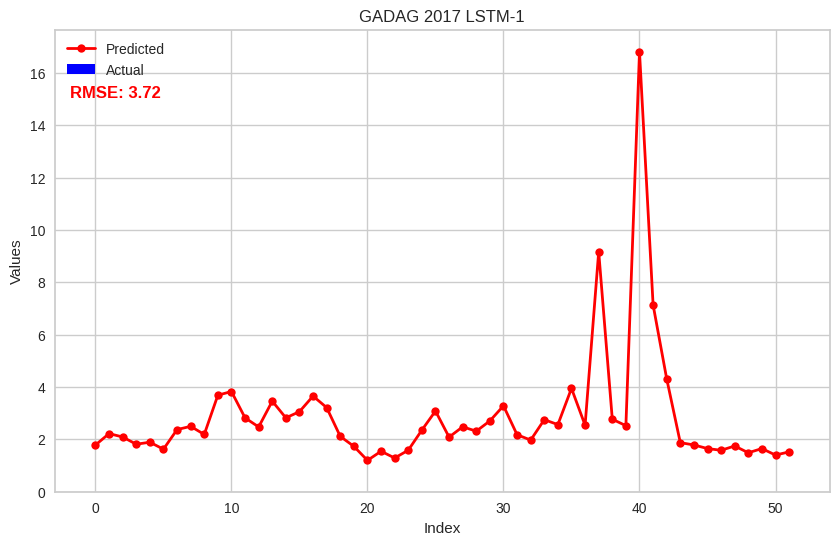

Analyzing District: HASSAN
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step


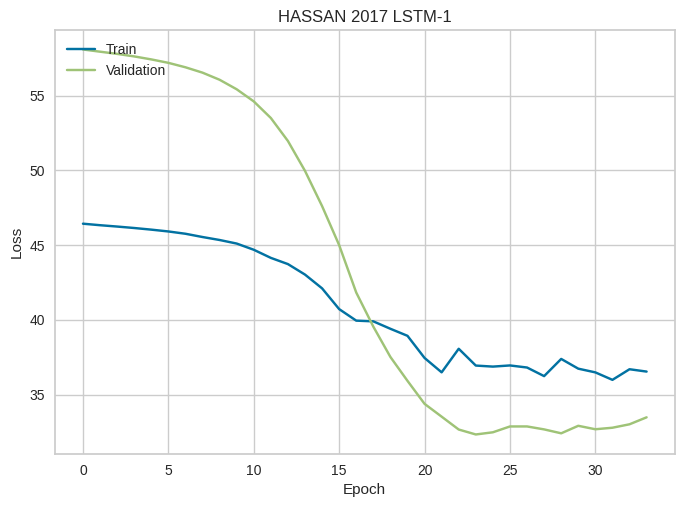

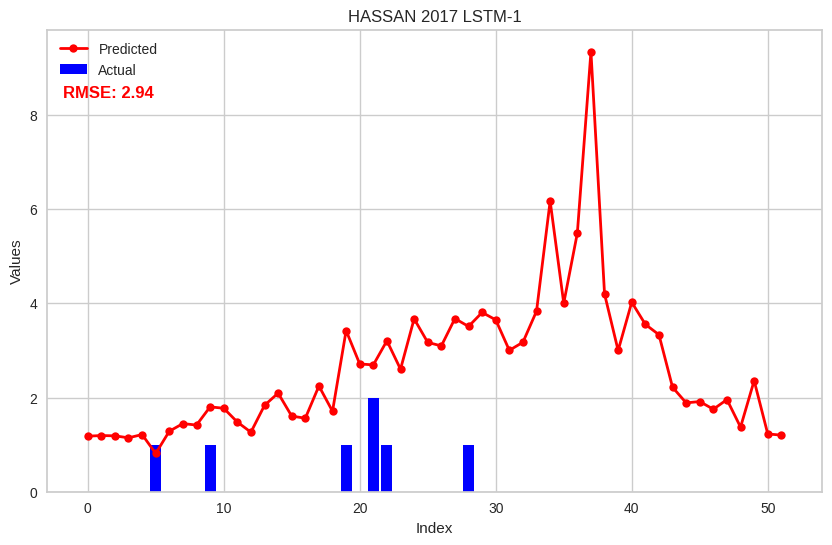

Analyzing District: HAVERI
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step


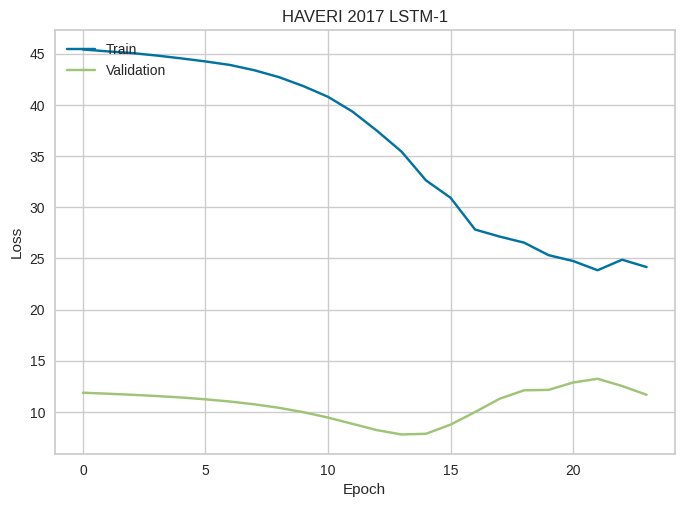

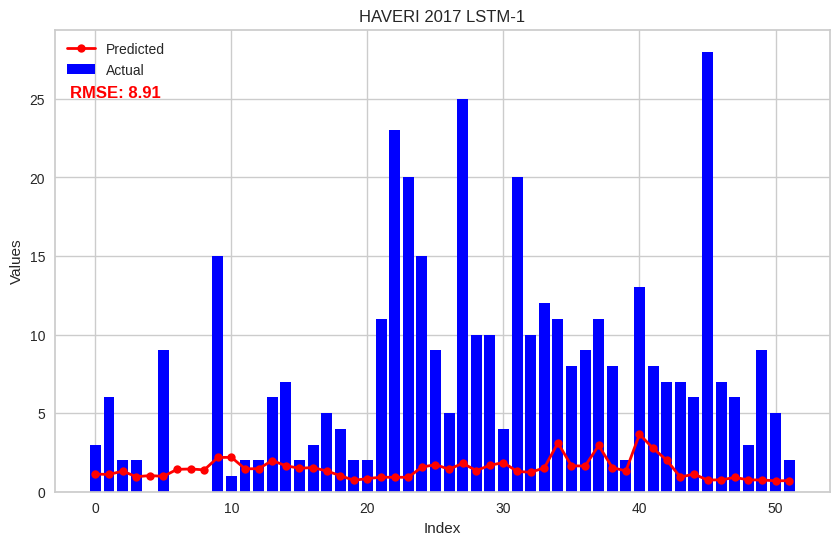

Analyzing District: KALABURAGI
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step


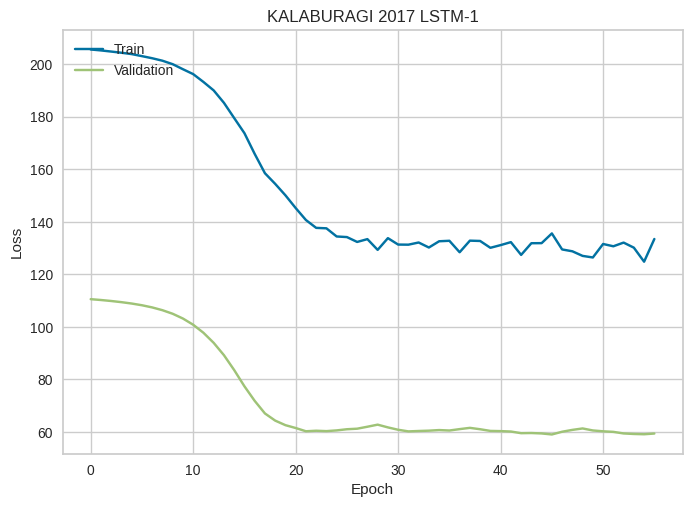

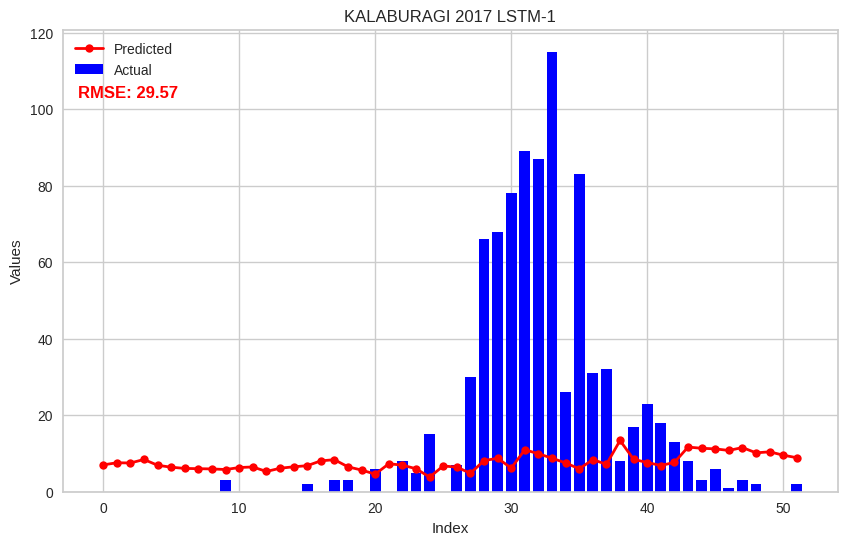

Analyzing District: KODAGU
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


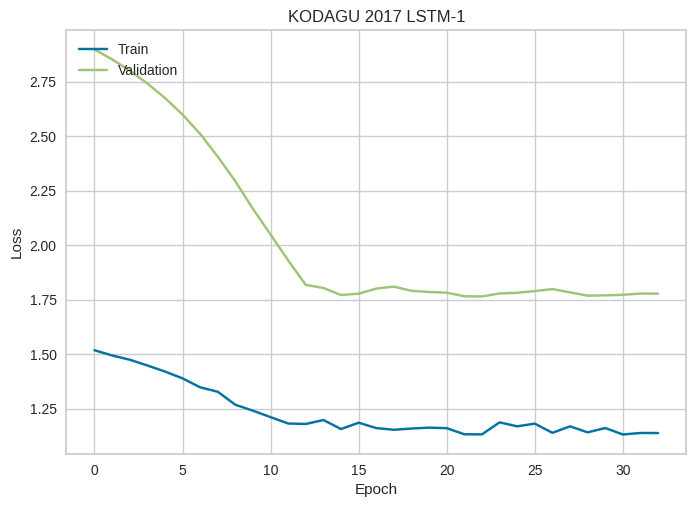

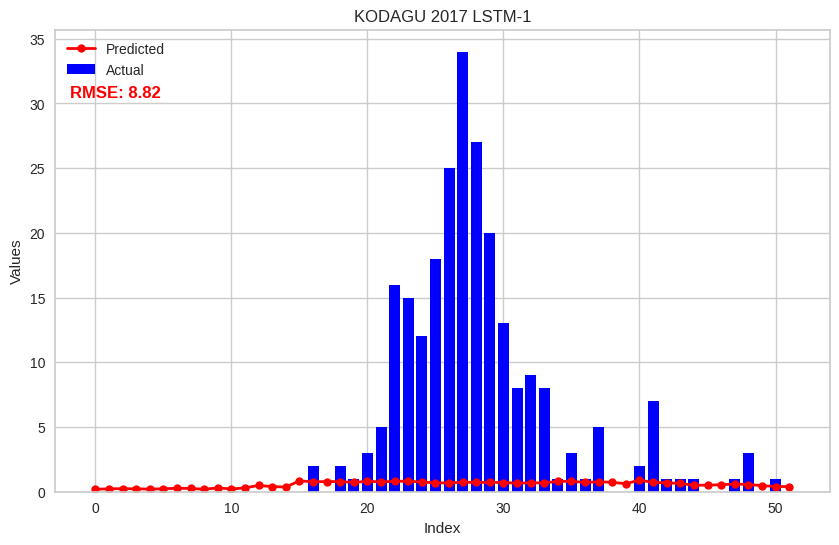

Analyzing District: KOLAR
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


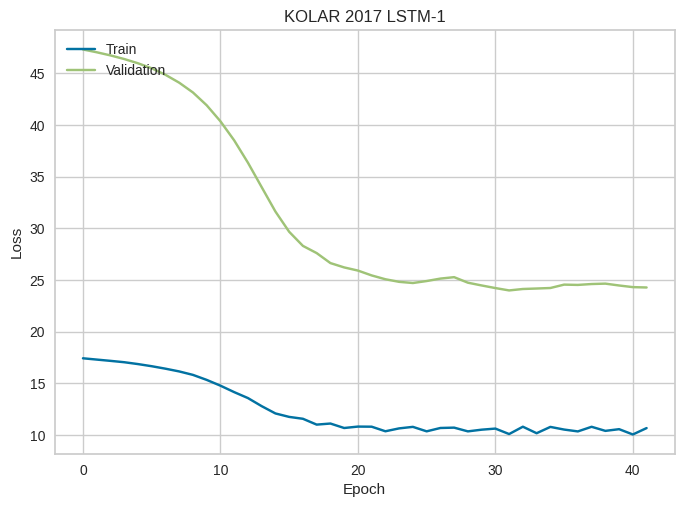

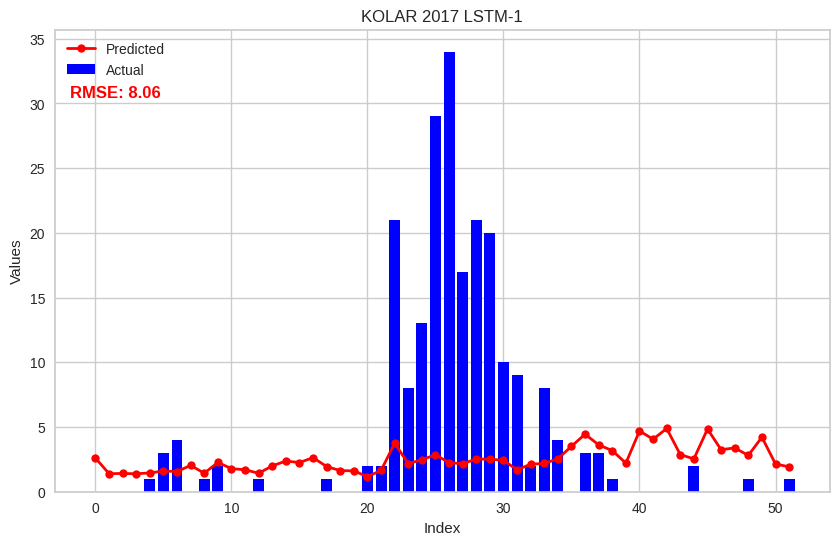

Analyzing District: KOPPAL
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step


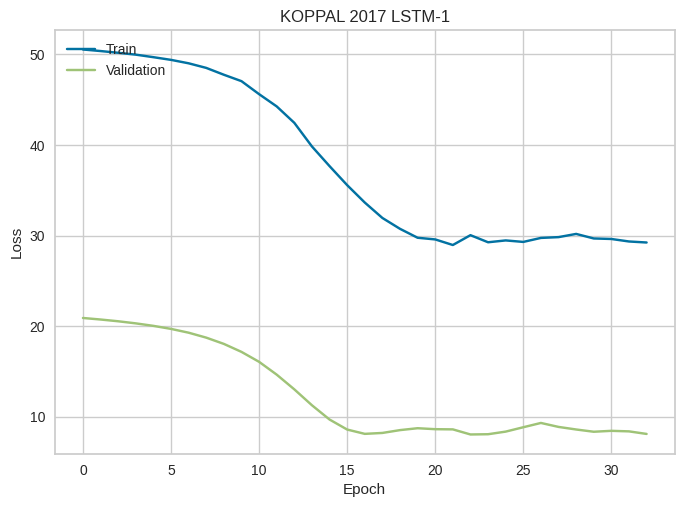

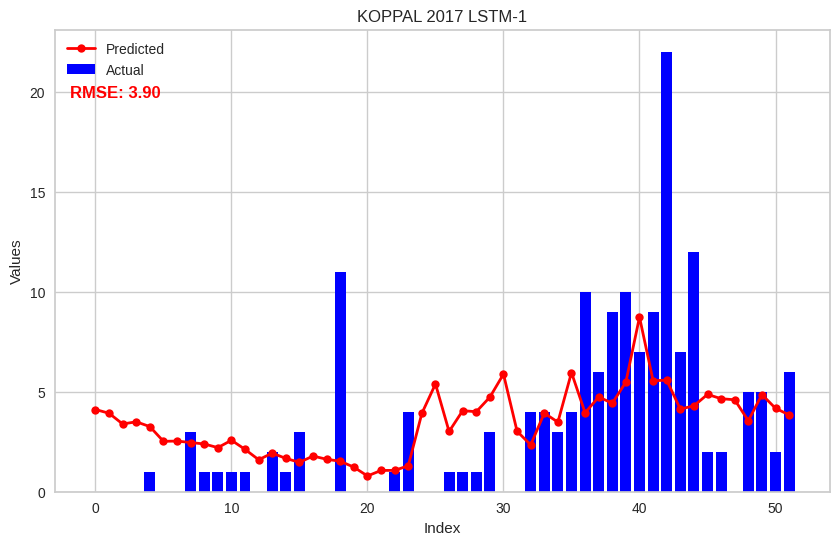

Analyzing District: MANDYA
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step


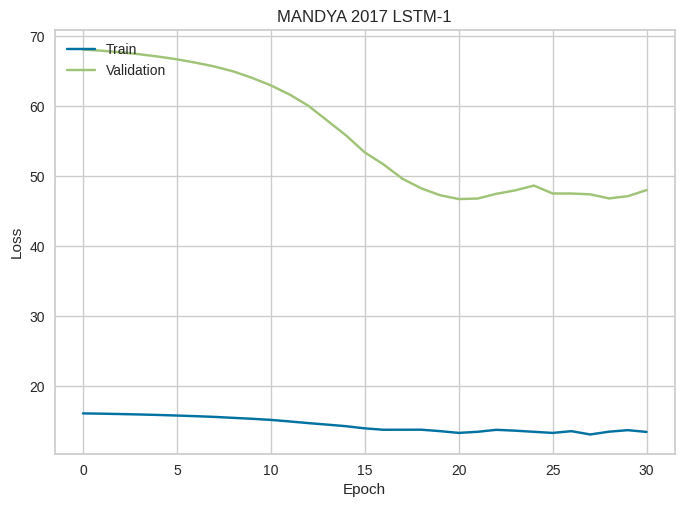

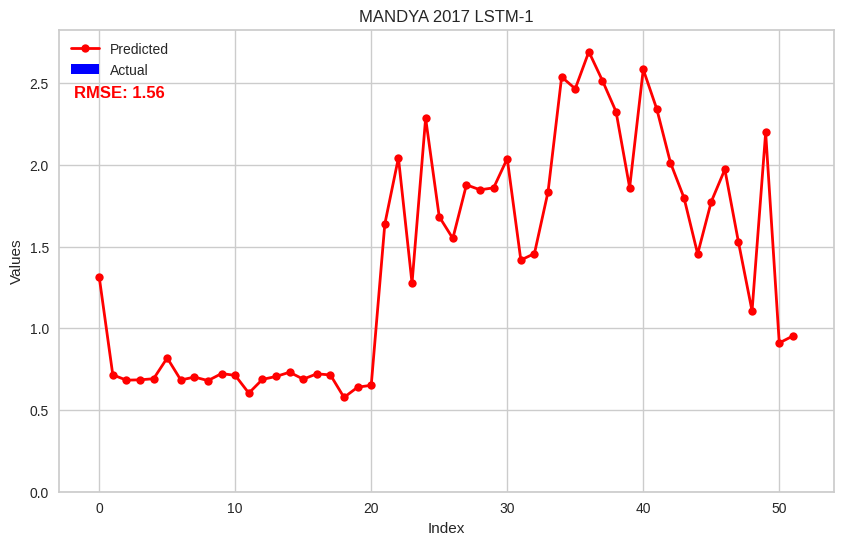

Analyzing District: MYSURU
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step


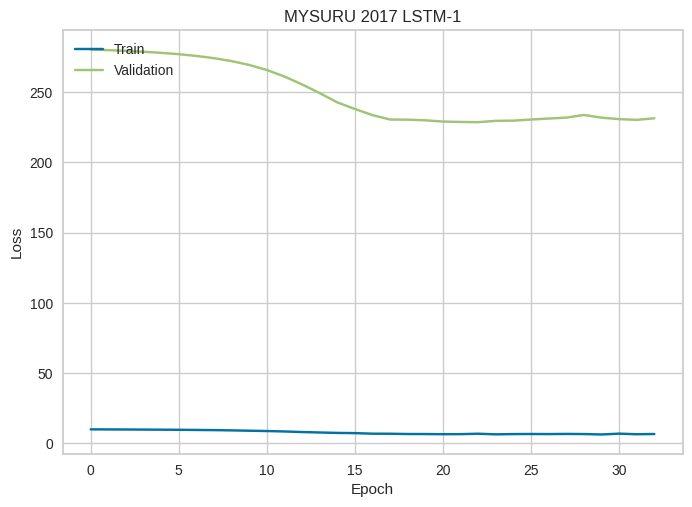

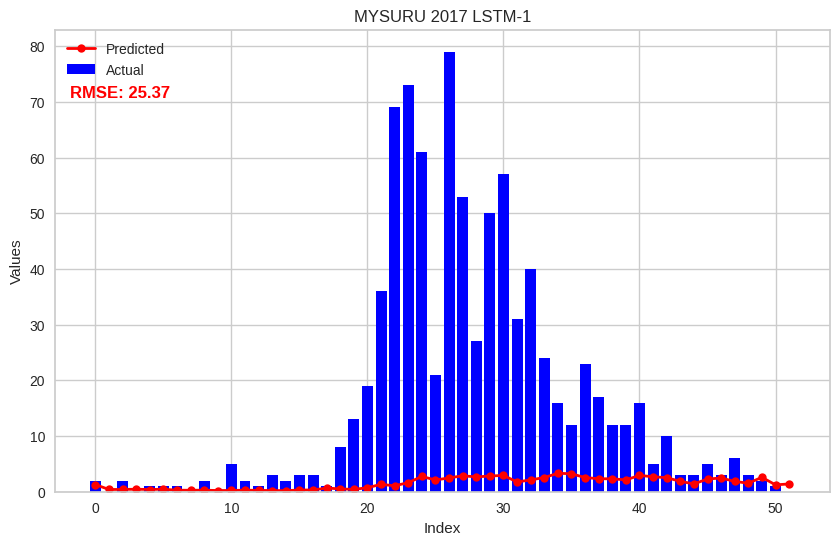

Analyzing District: RAICHUR
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step


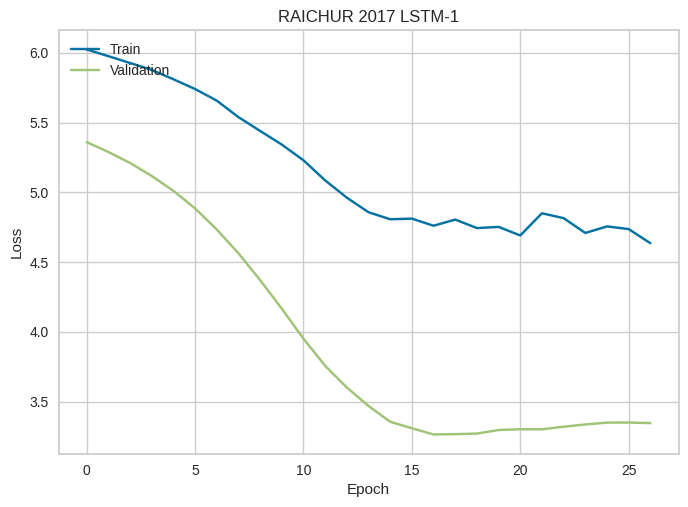

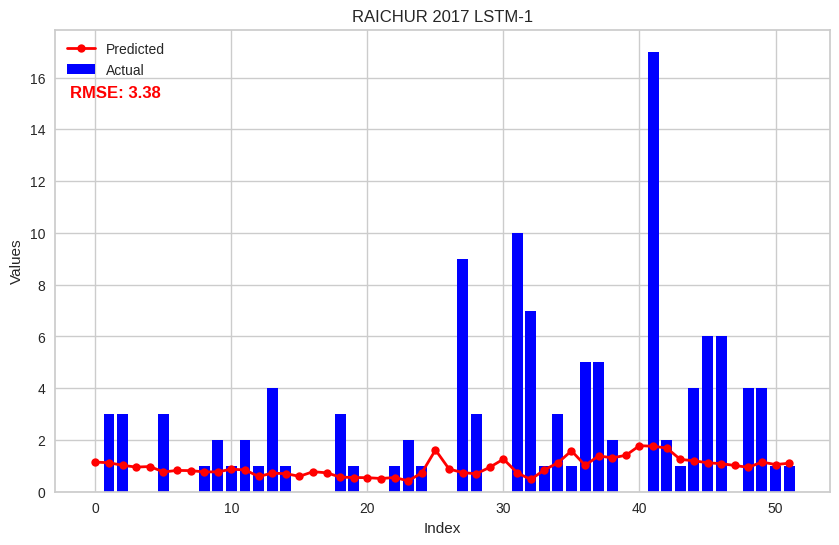

Analyzing District: RAMANAGARA
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step


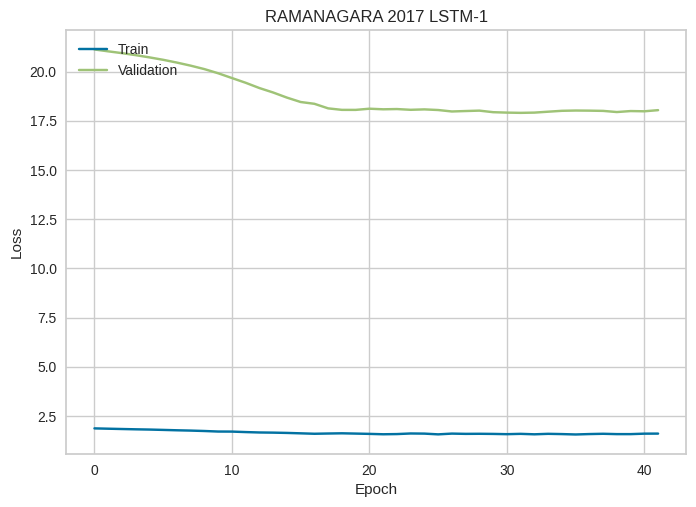

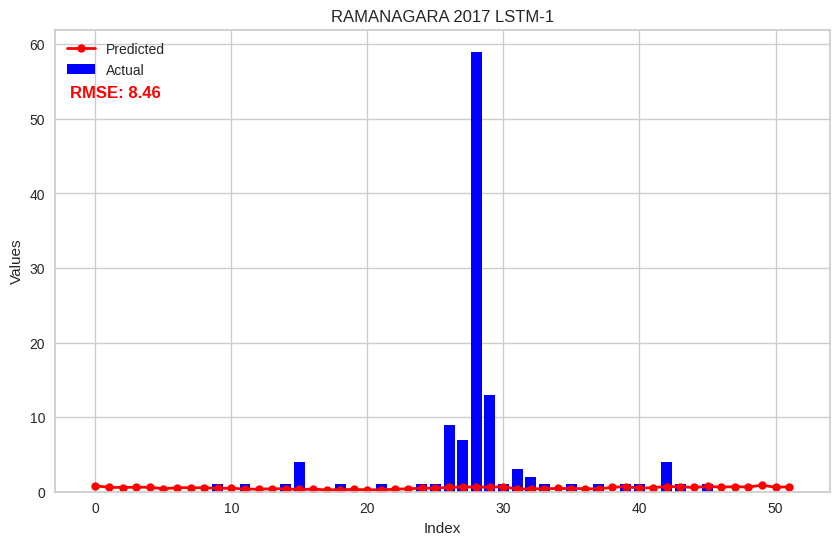

Analyzing District: SHIVAMOGGA
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


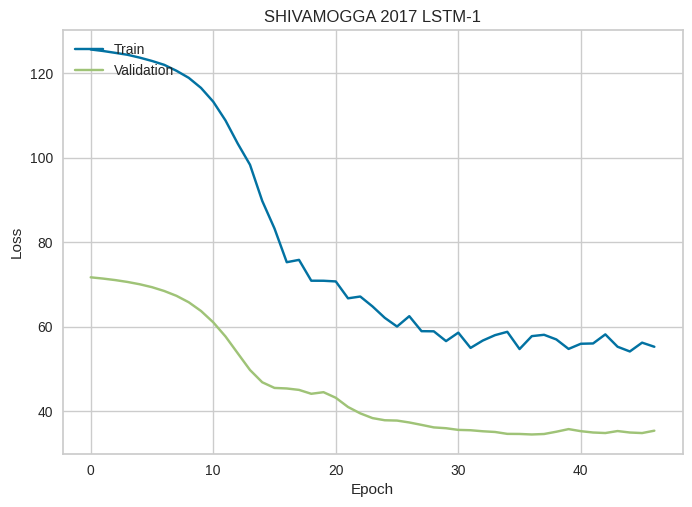

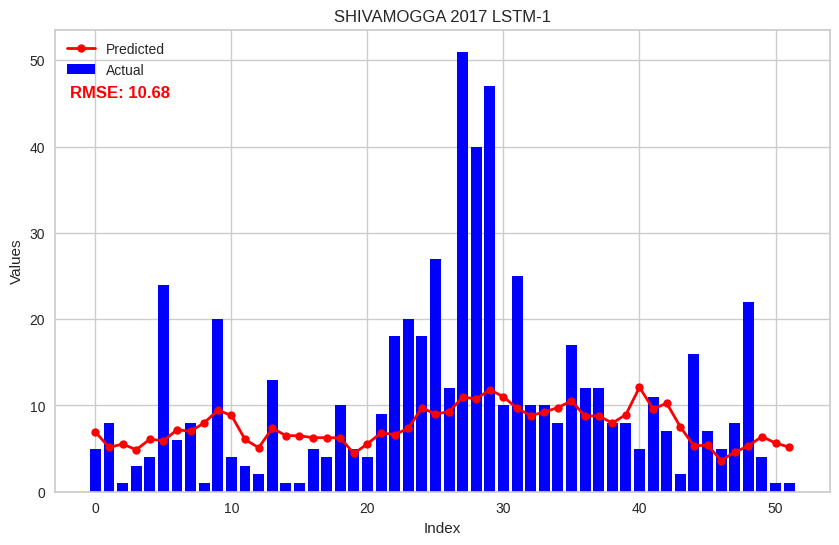

Analyzing District: TUMAKURU
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step


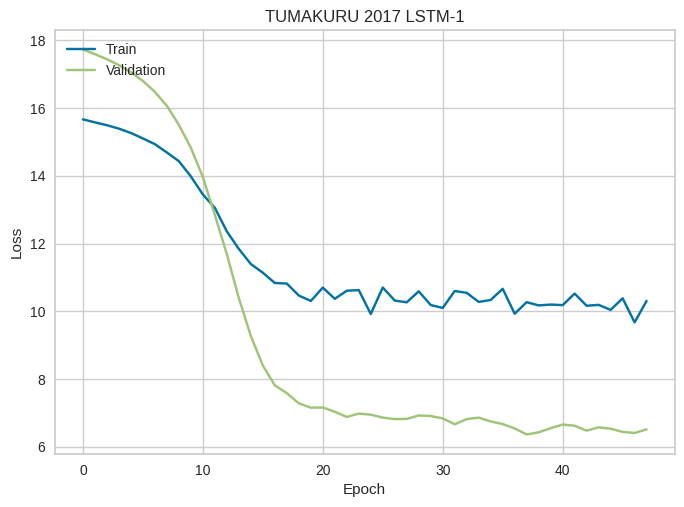

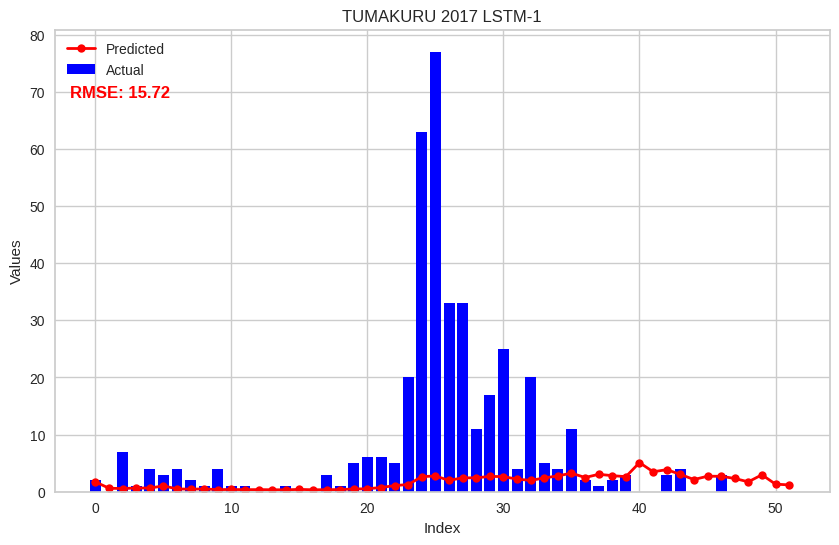

Analyzing District: UDUPI
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step


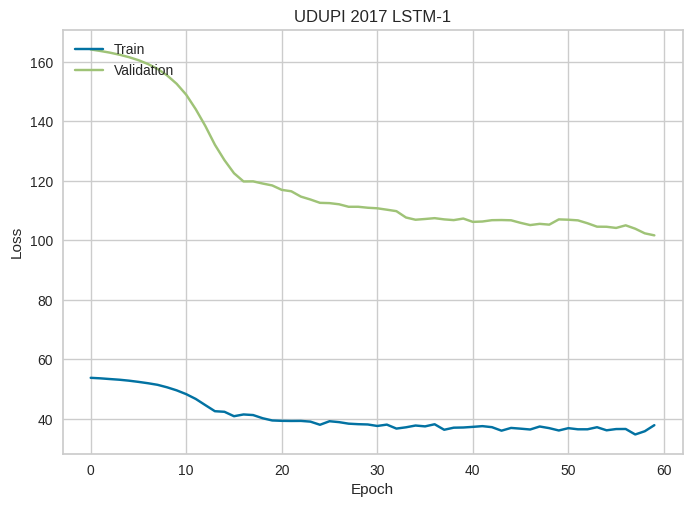

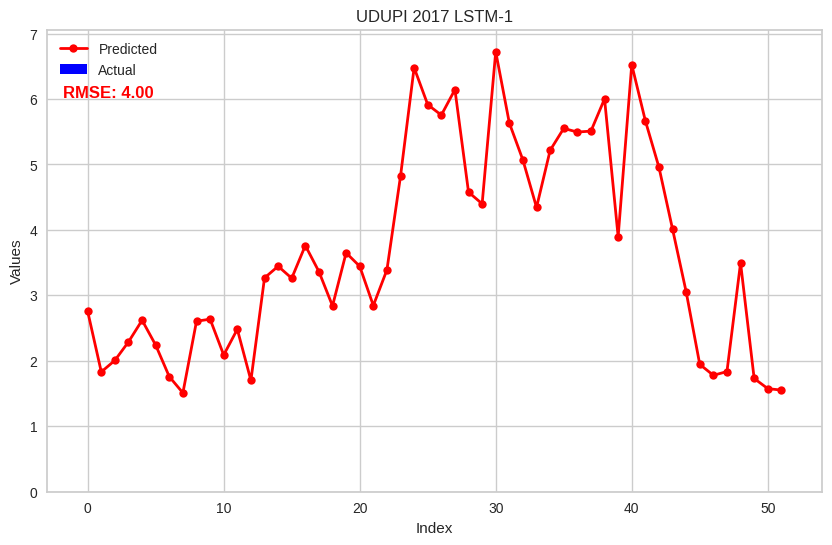

Analyzing District: UTTARA KANNADA
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step


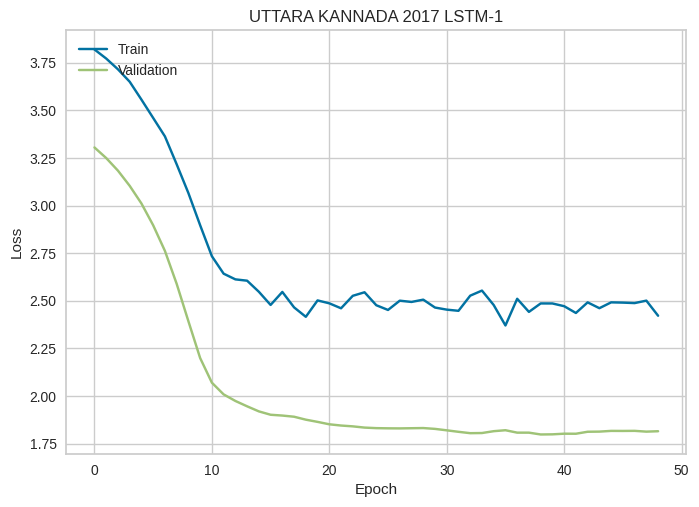

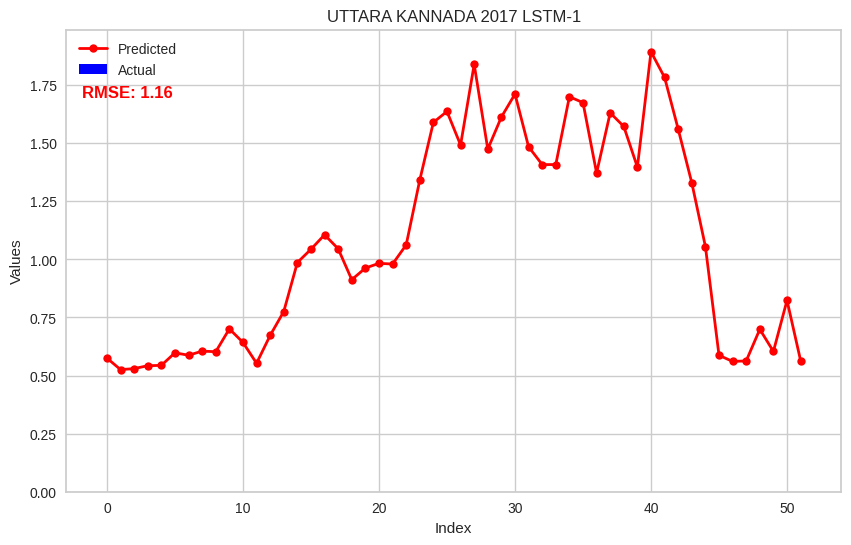

Analyzing District: VIJAYANAGAR
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step


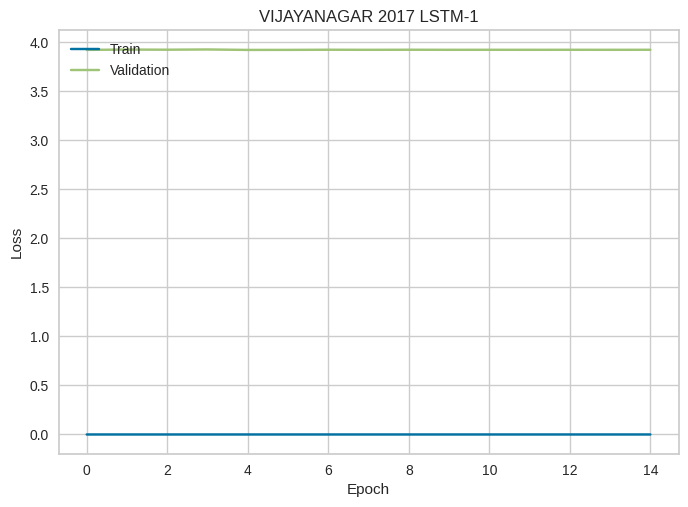

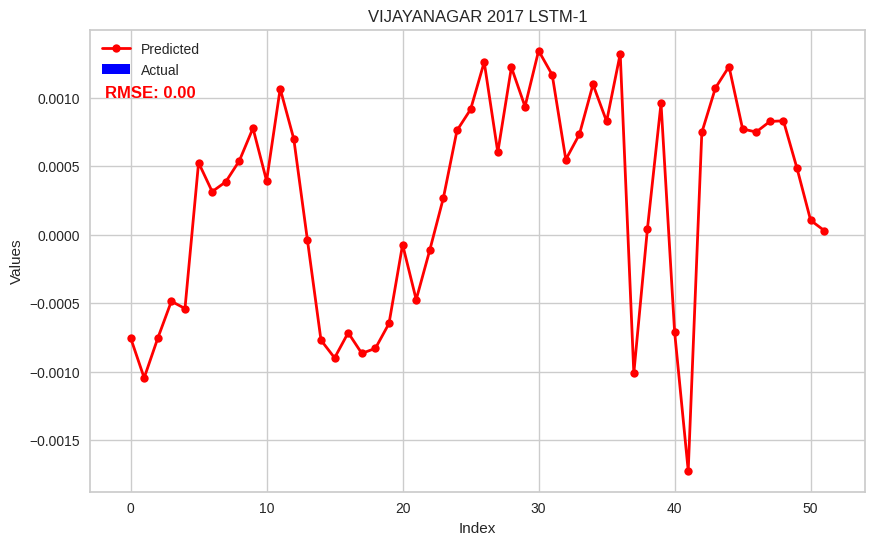

Analyzing District: VIJAYAPURA
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


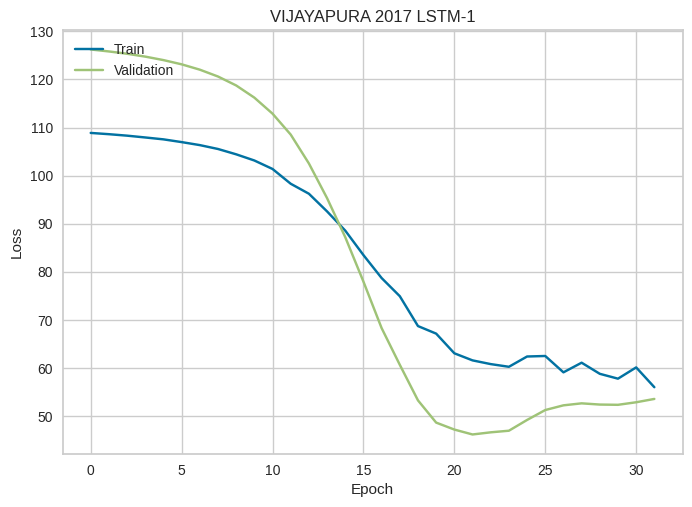

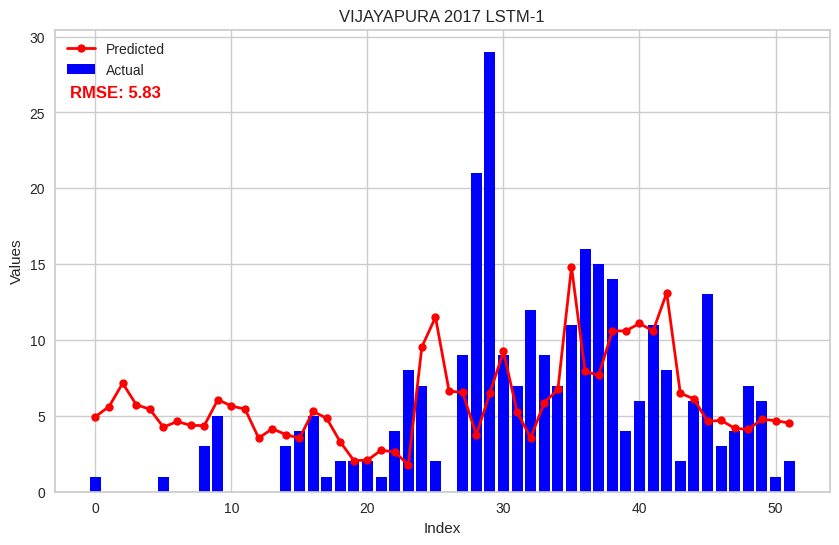

Analyzing District: YADGIR
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step


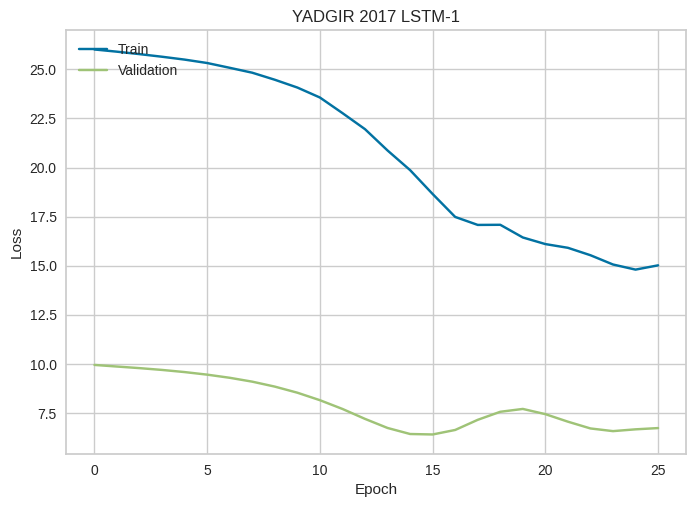

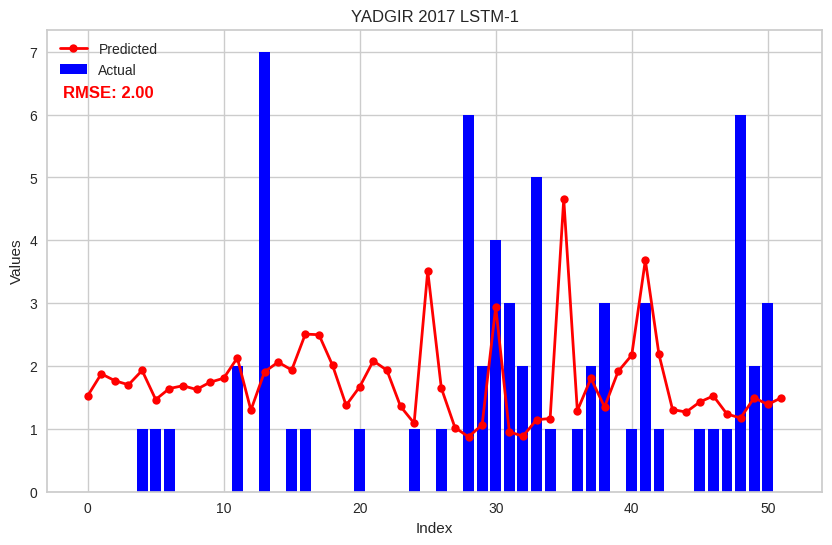

In [20]:
district_analysis = DistrictAnalysis("Karnataka_weather1980to2022.csv",2017,1)
df_2017 = district_analysis.analyze_districts()

Analyzing District: BAGALKOTE
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step


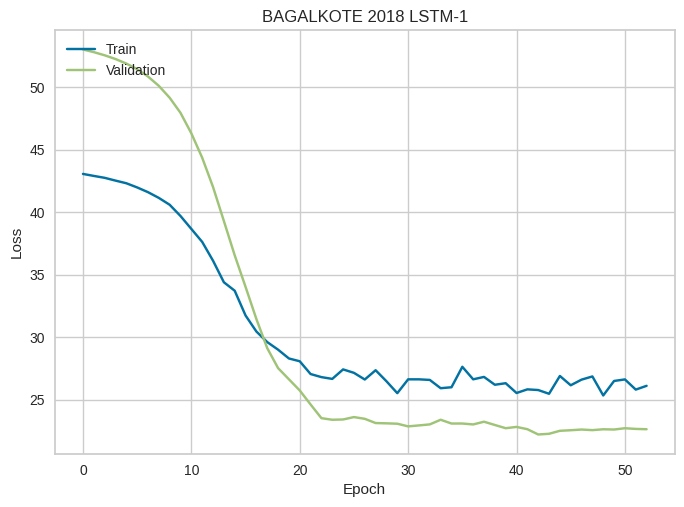

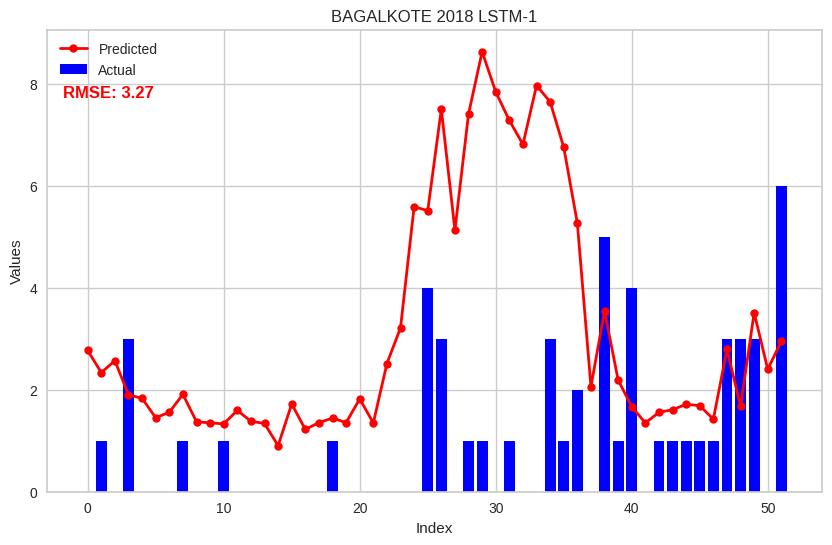

Analyzing District: BALLARI
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step


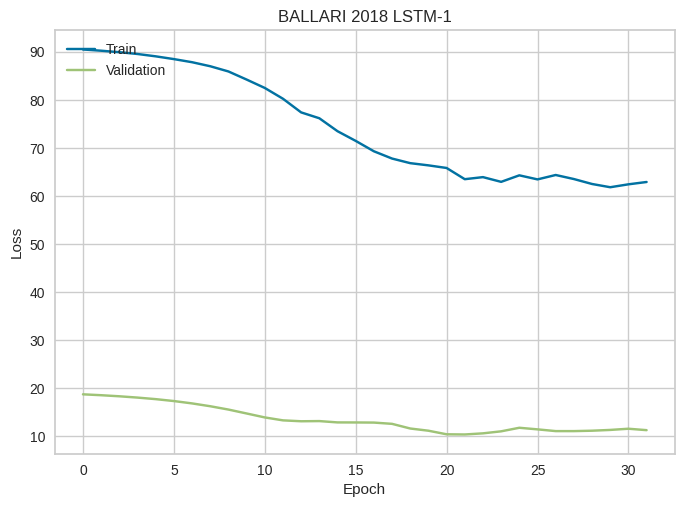

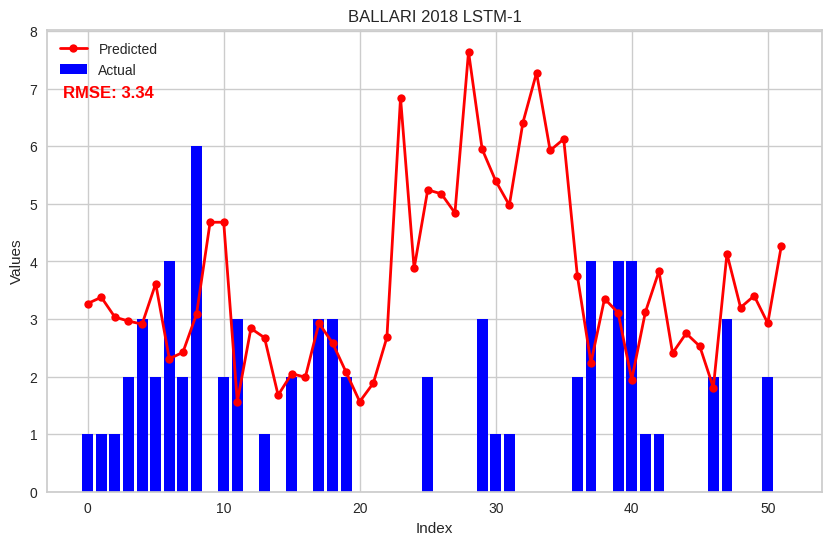

Analyzing District: BELAGAVI
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step


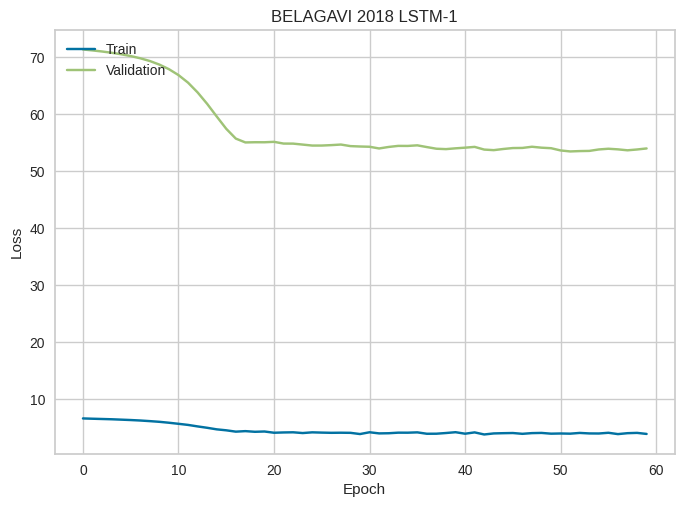

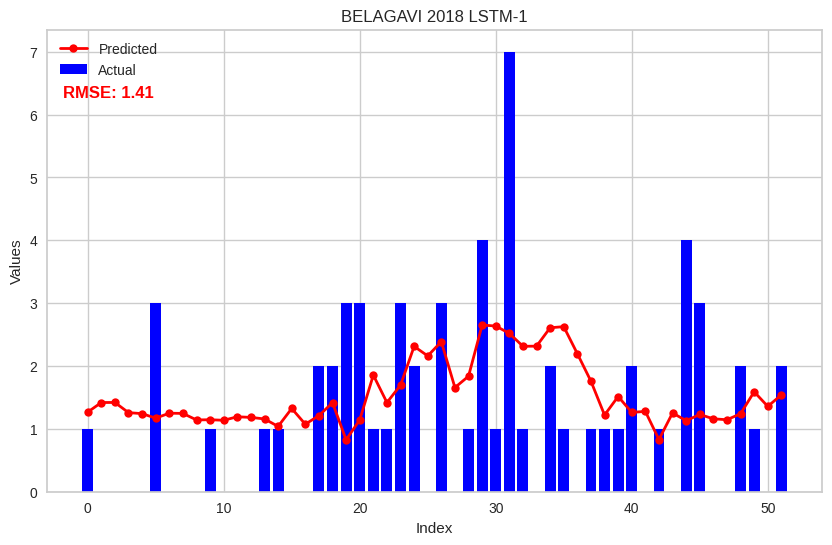

Analyzing District: BENGALURU RURAL
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


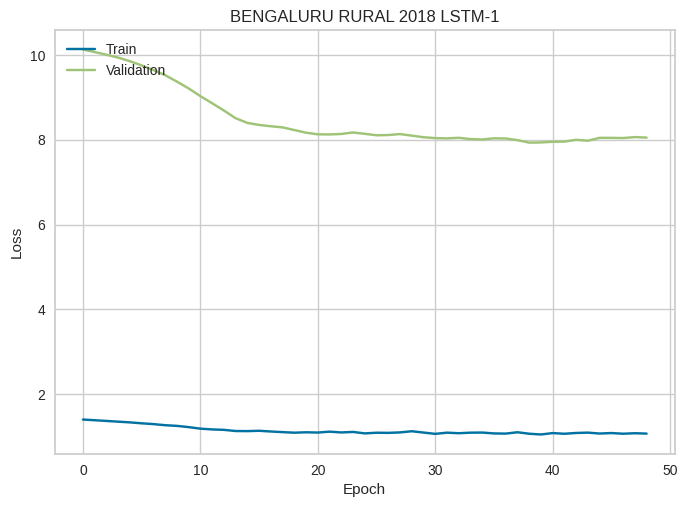

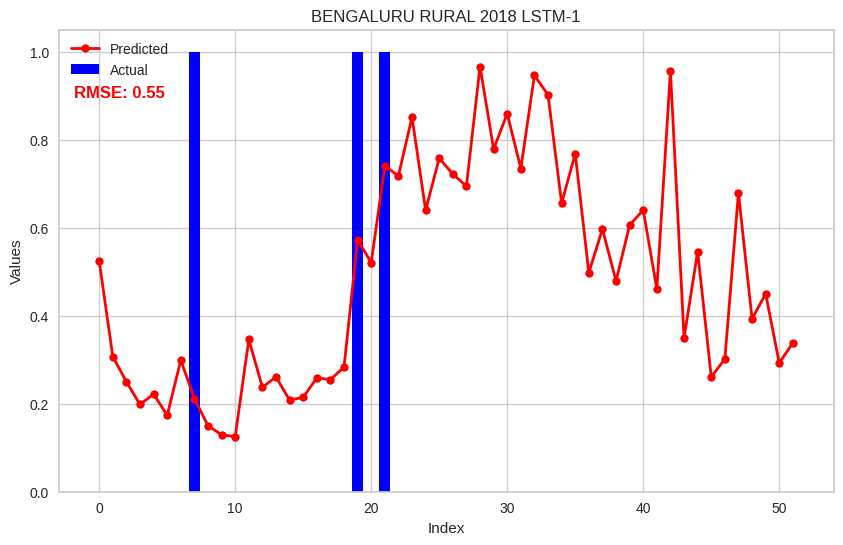

Analyzing District: BENGALURU URBAN
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step


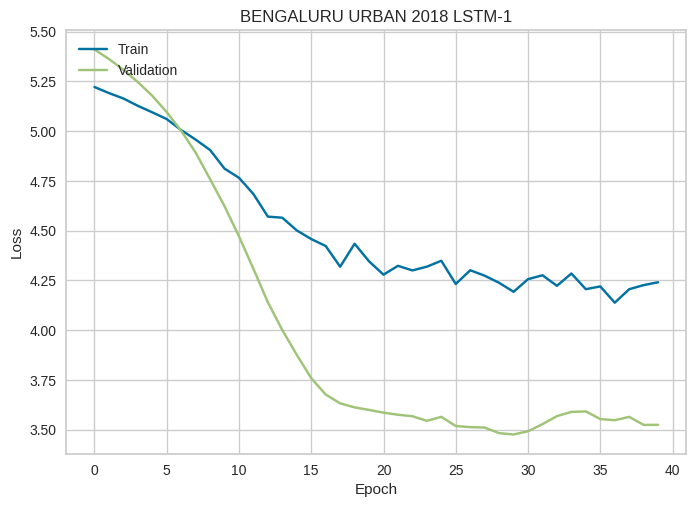

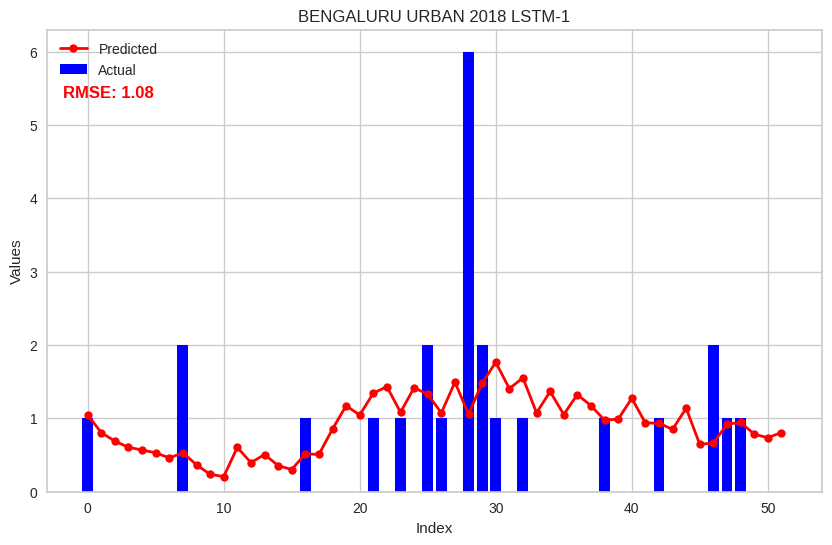

Analyzing District: BIDAR
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step


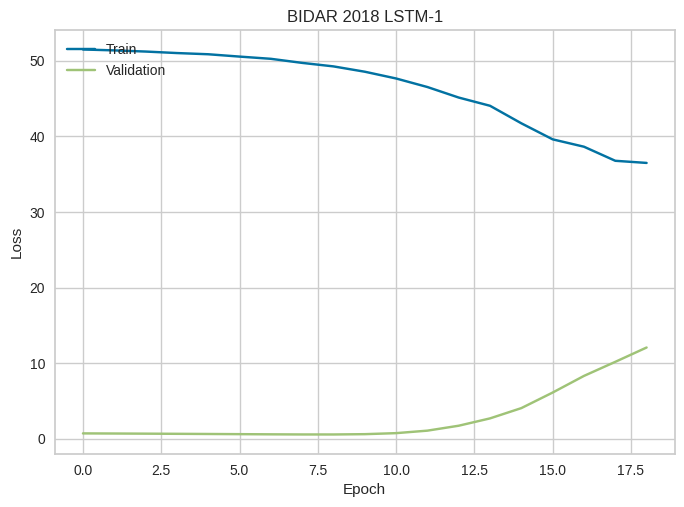

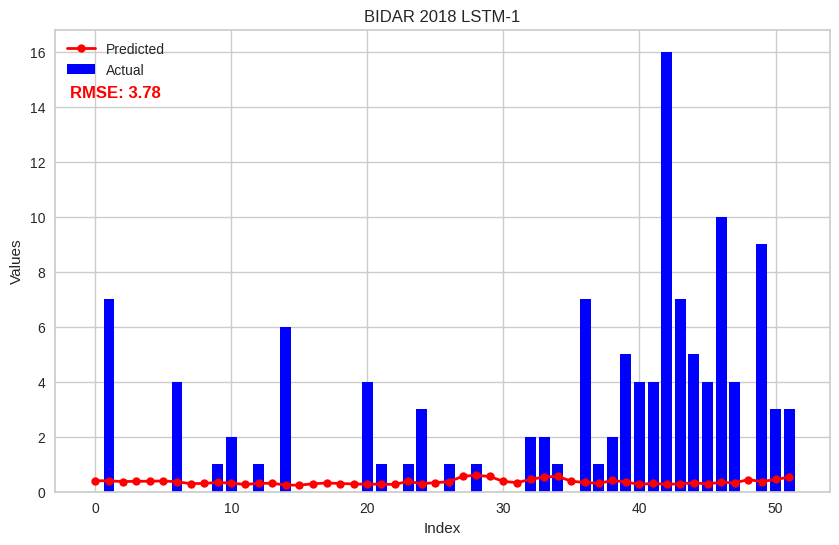

Analyzing District: CHAMARAJANAGARA
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step


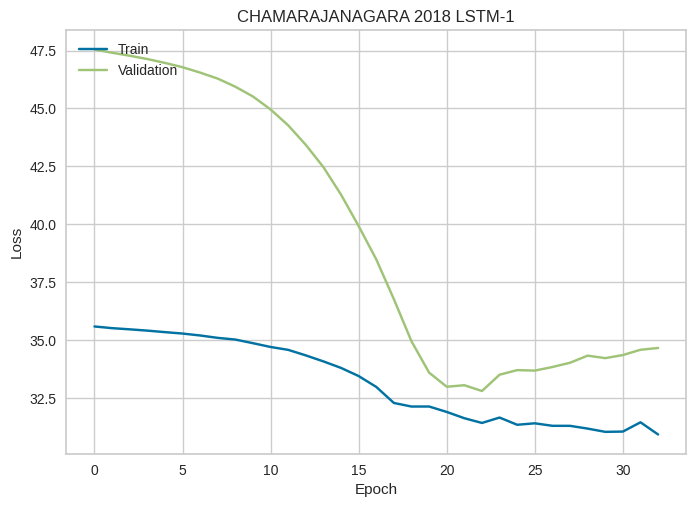

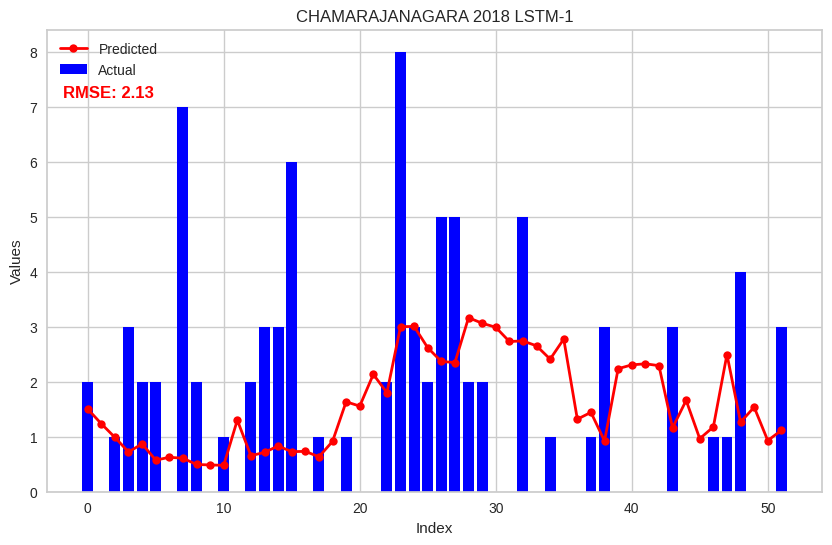

Analyzing District: CHIKKABALLAPURA
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


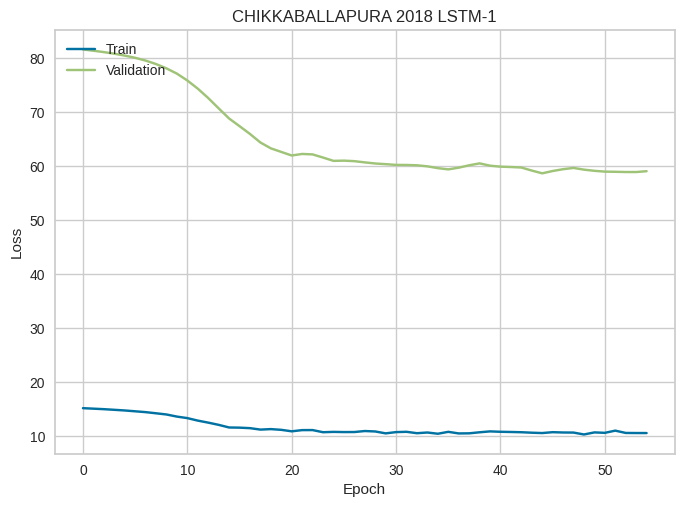

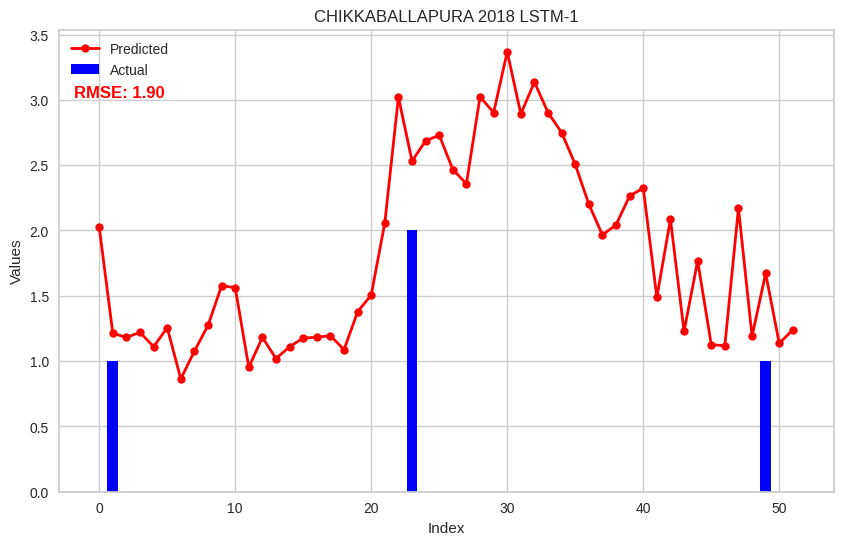

Analyzing District: CHIKKAMAGALURU
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step


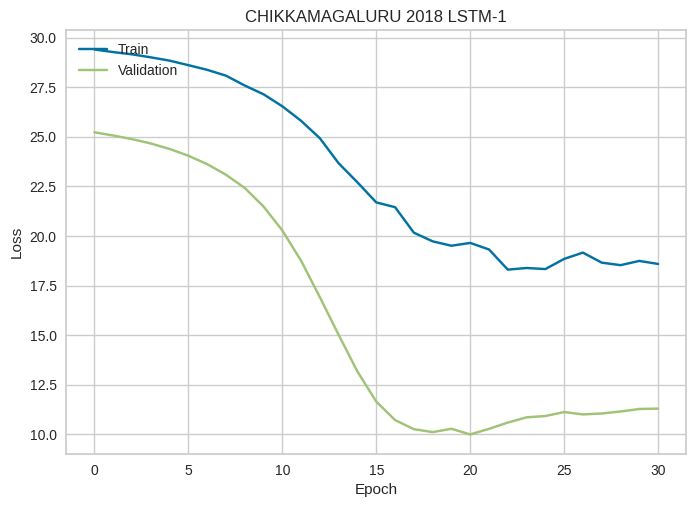

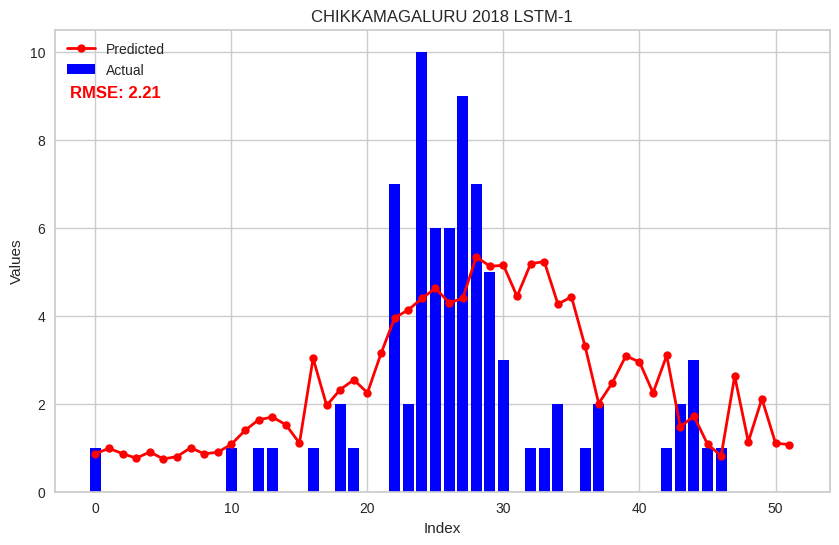

Analyzing District: CHITRADURGA
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


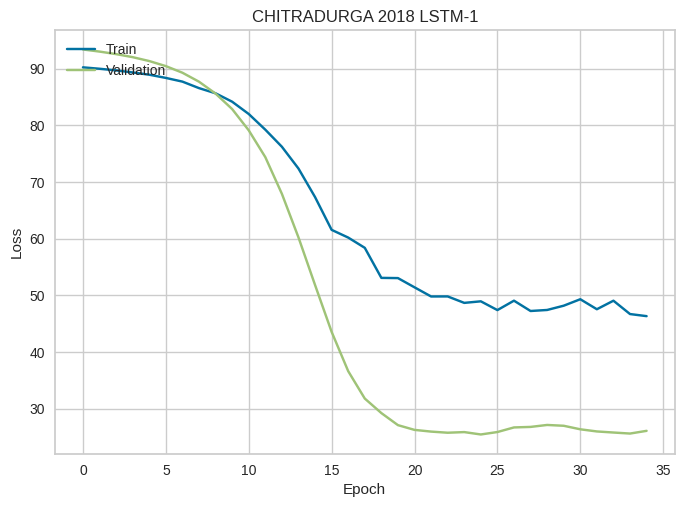

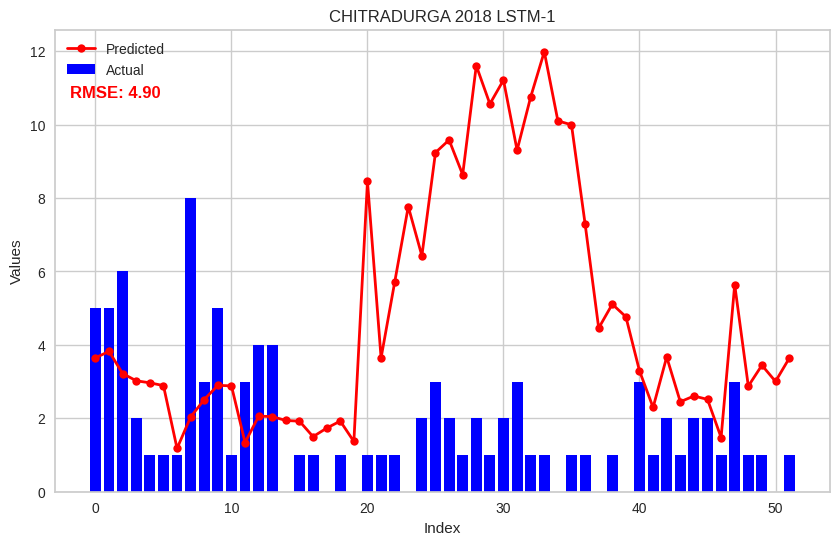

Analyzing District: DAKSHINA KANNADA
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step


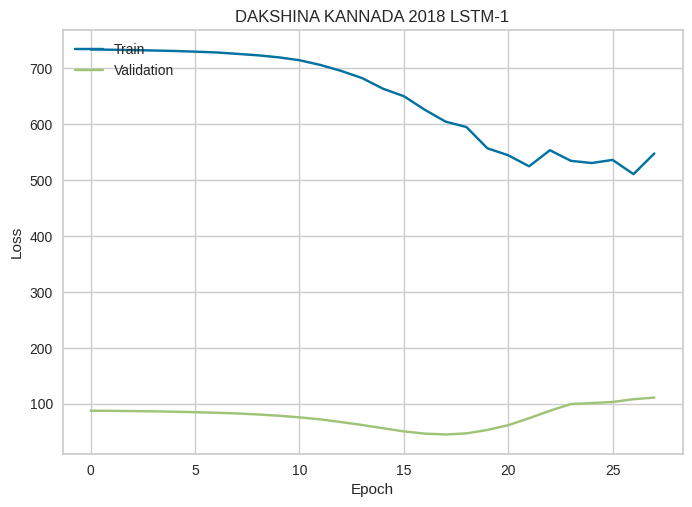

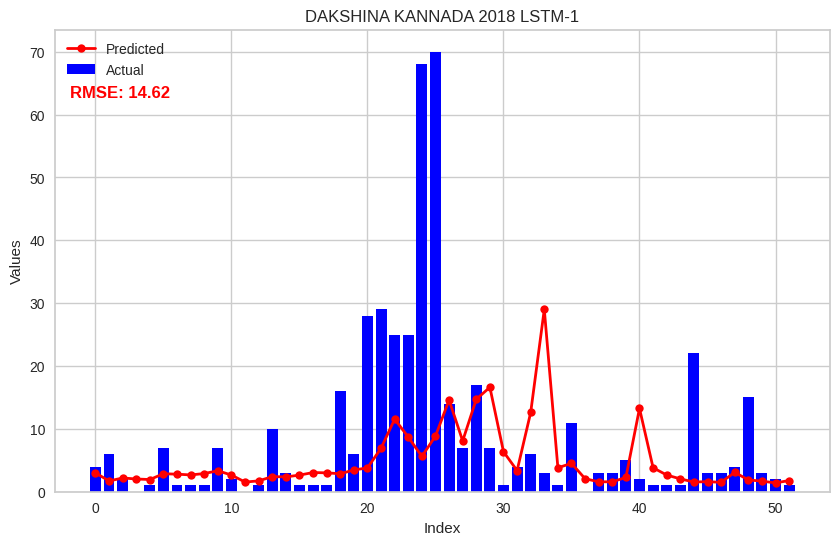

Analyzing District: DAVANGERE
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step


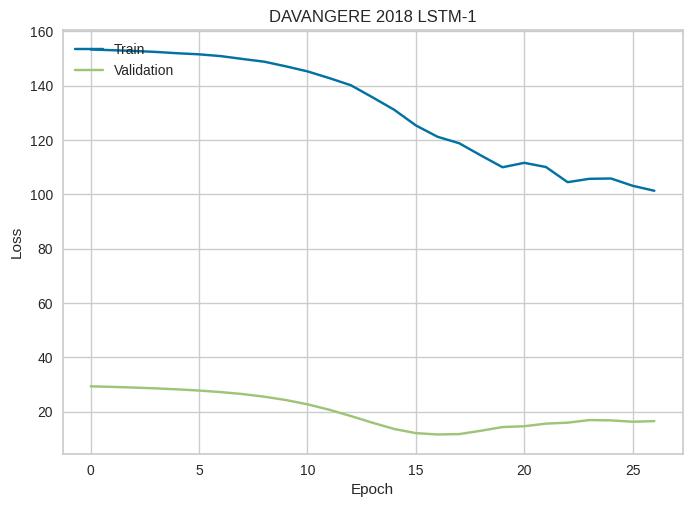

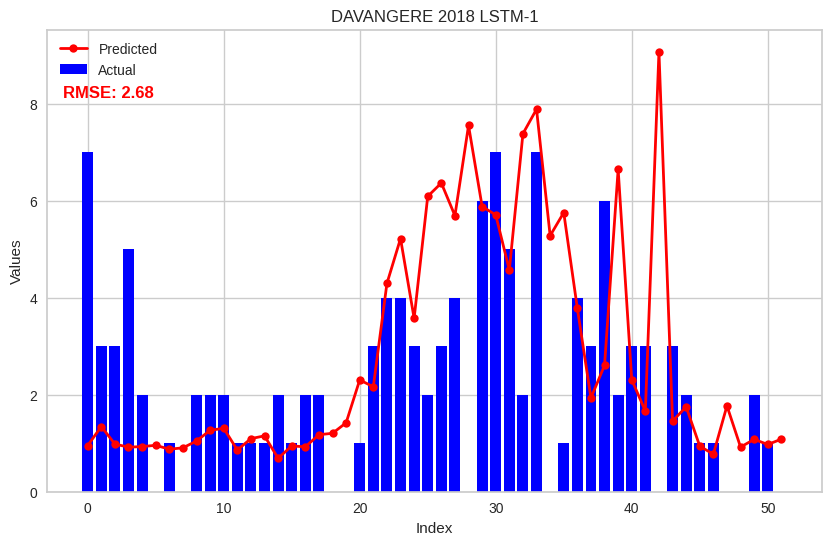

Analyzing District: DHARWAD
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step


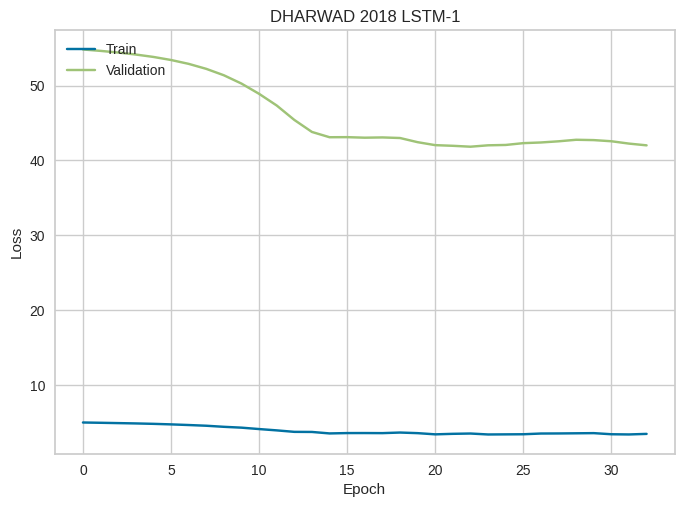

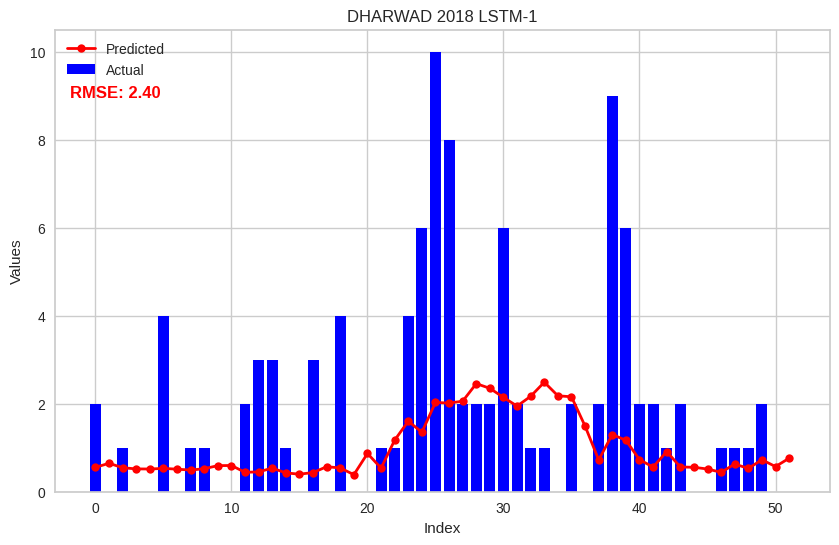

Analyzing District: GADAG
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step


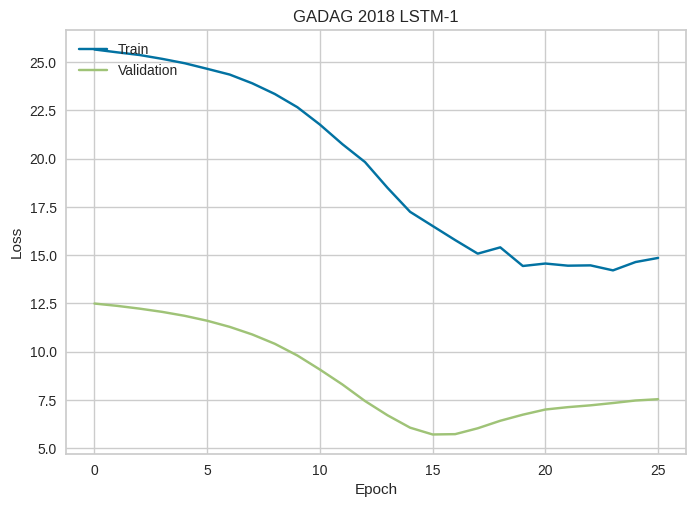

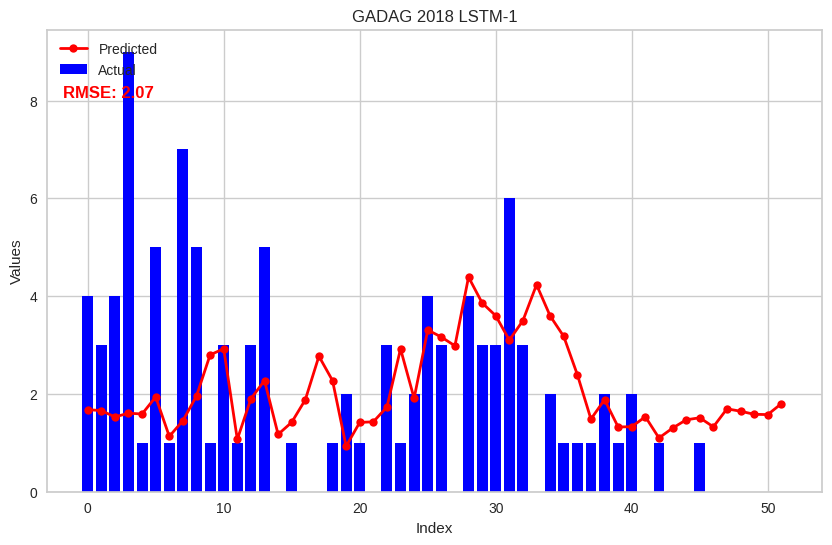

Analyzing District: HASSAN
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step


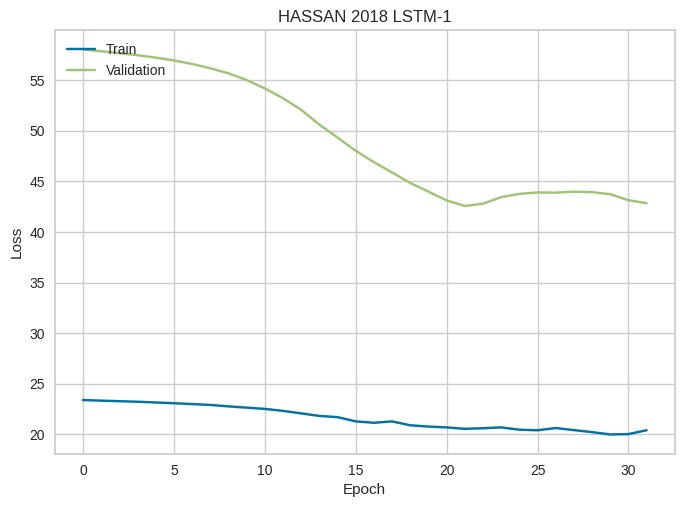

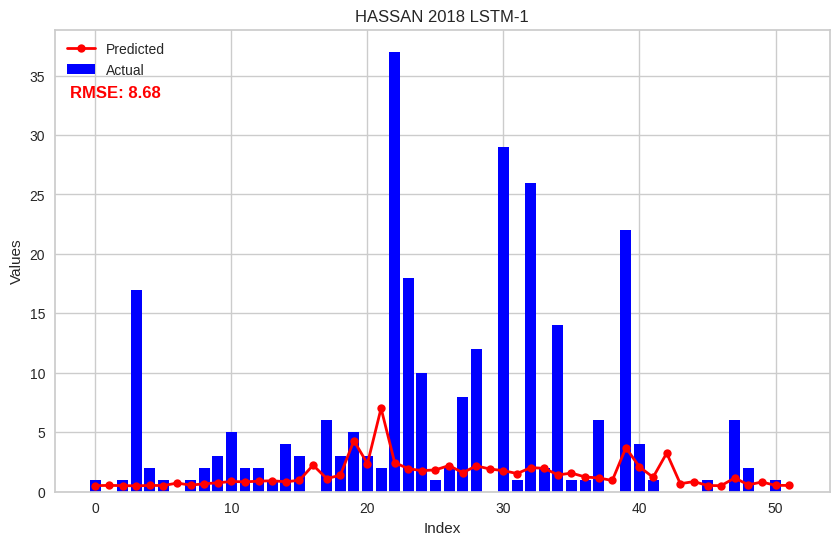

Analyzing District: HAVERI
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step


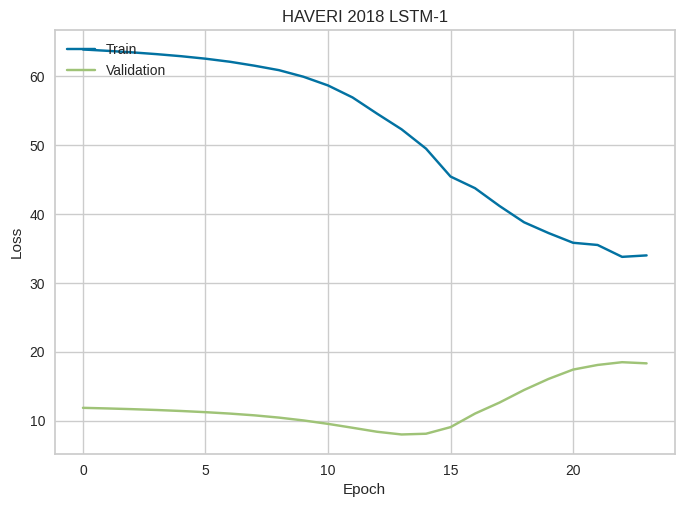

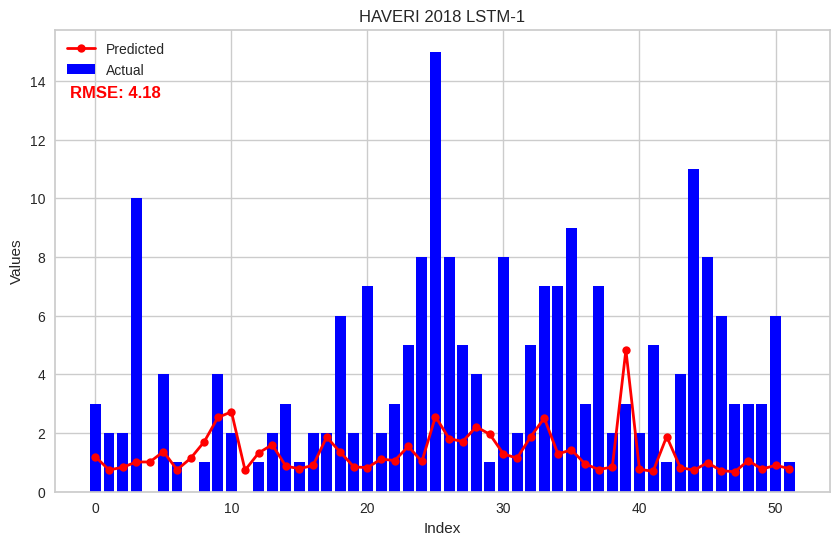

Analyzing District: KALABURAGI
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


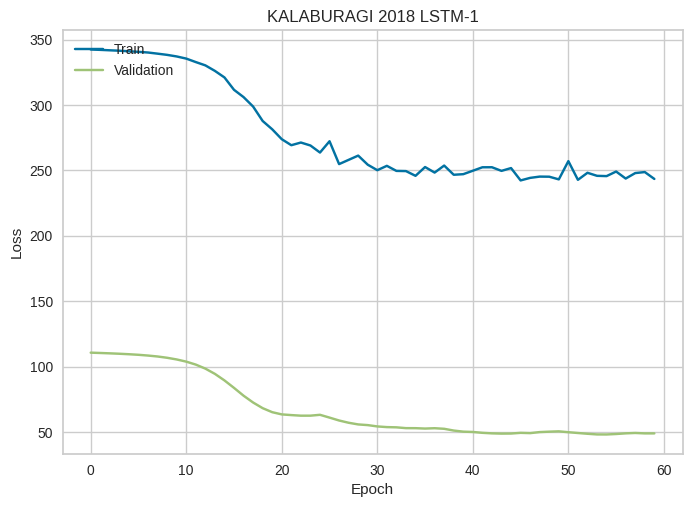

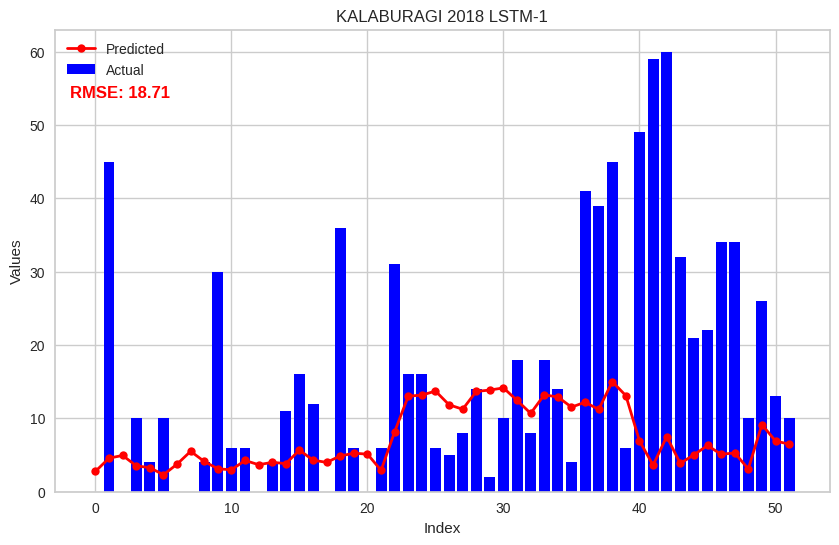

Analyzing District: KODAGU
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


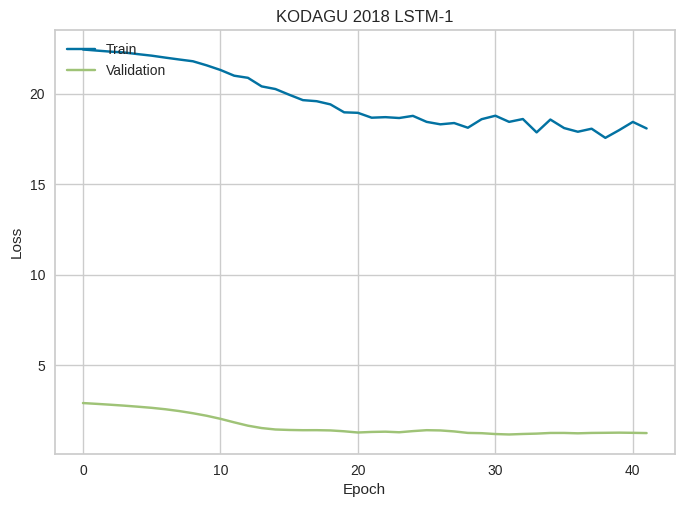

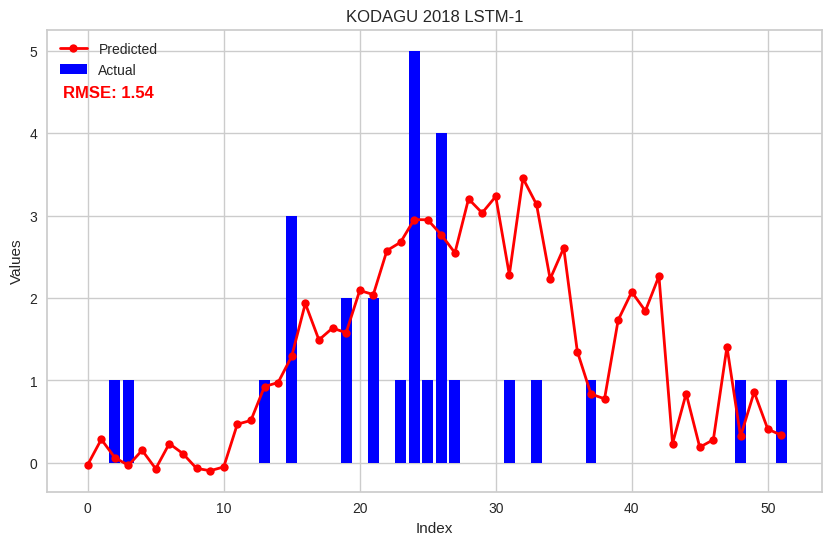

Analyzing District: KOLAR
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


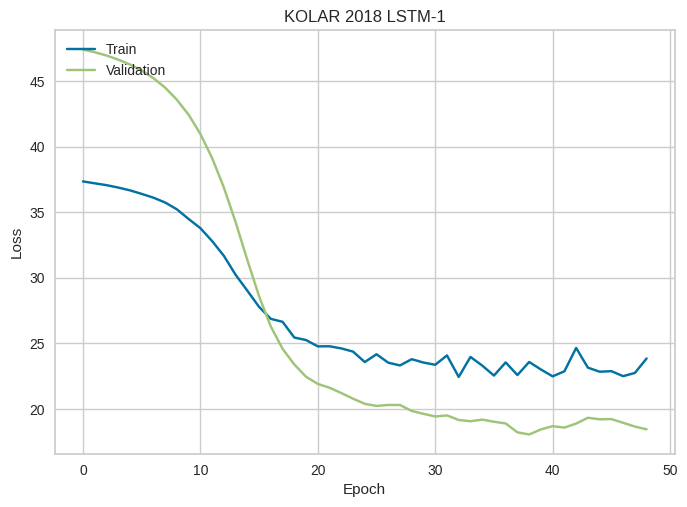

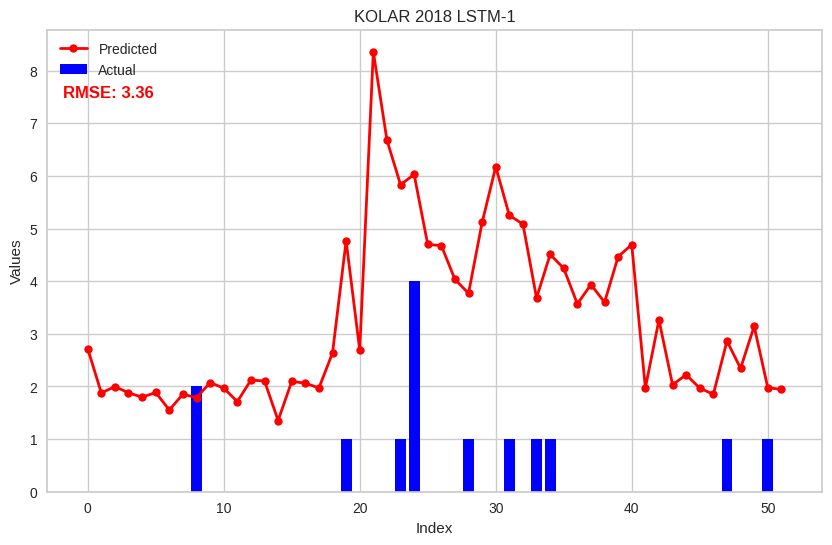

Analyzing District: KOPPAL
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


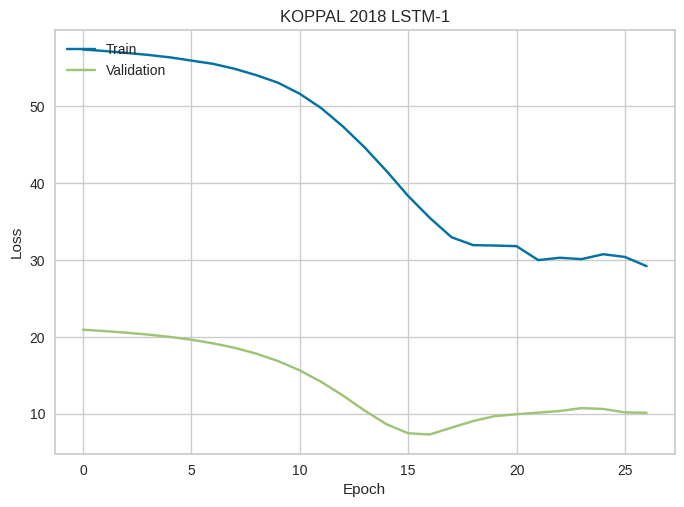

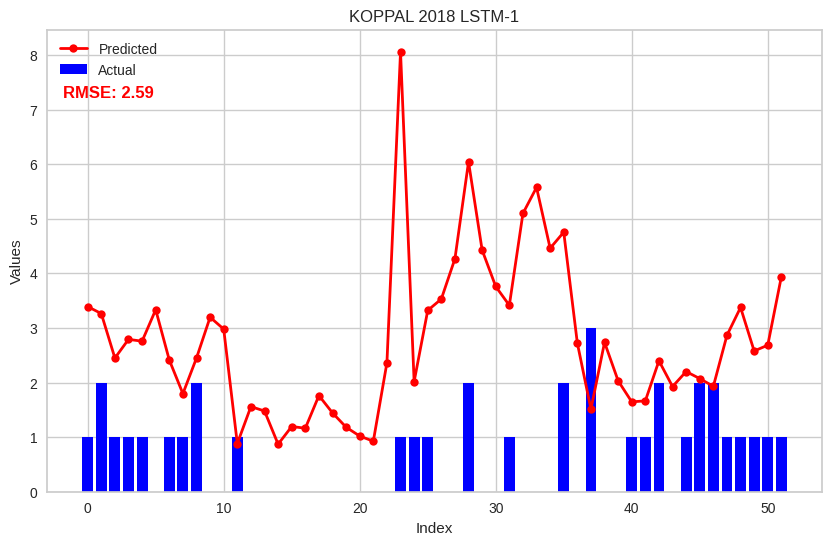

Analyzing District: MANDYA
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


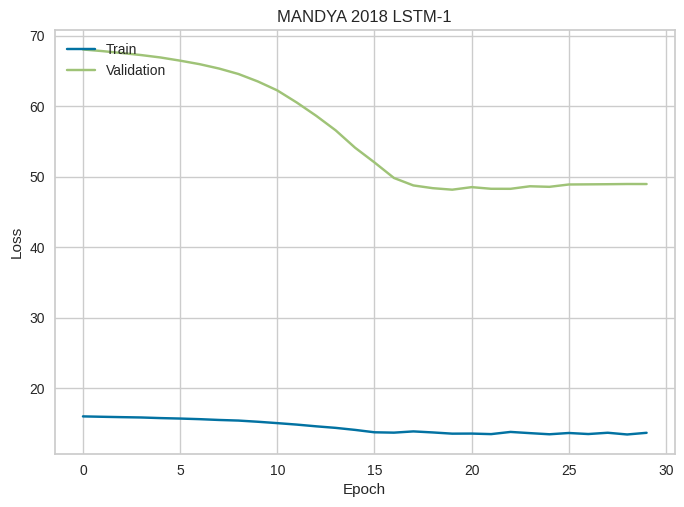

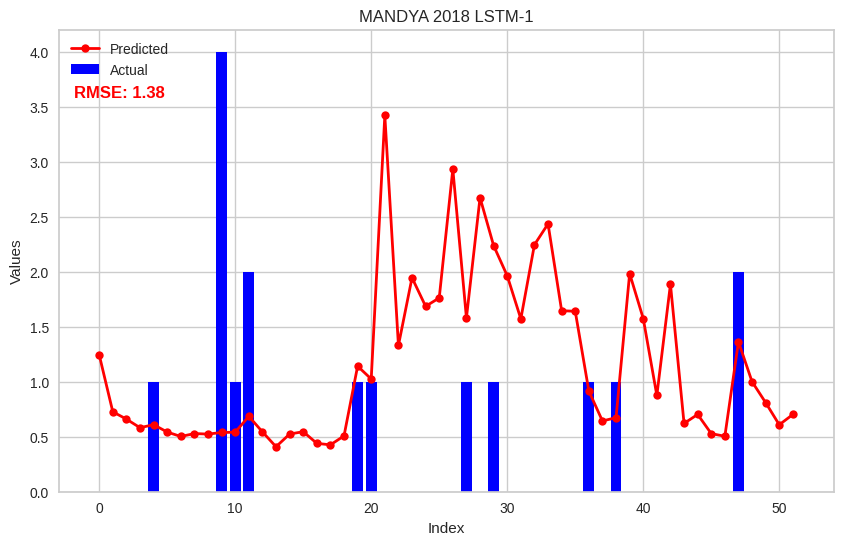

Analyzing District: MYSURU
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step


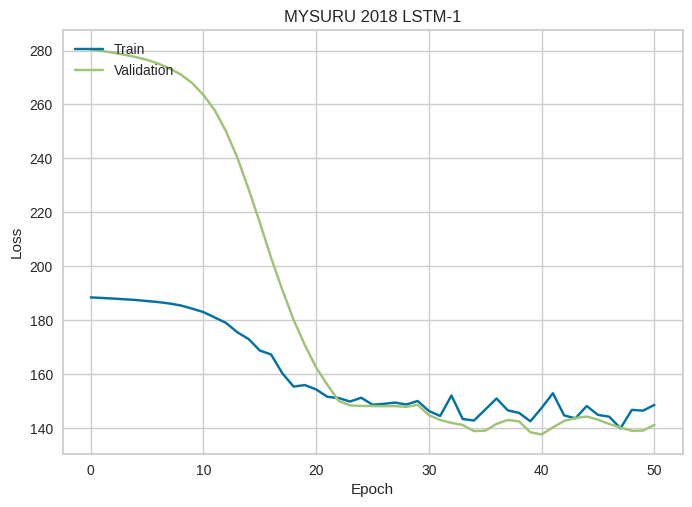

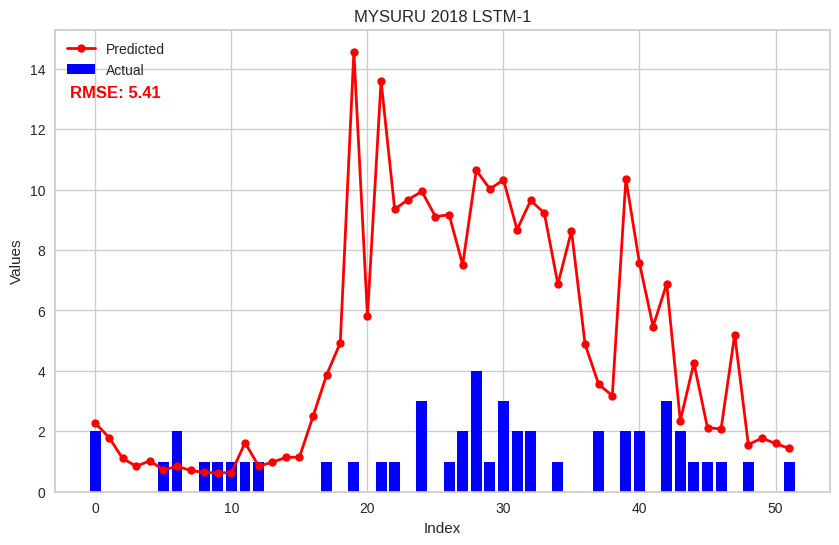

Analyzing District: RAICHUR
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


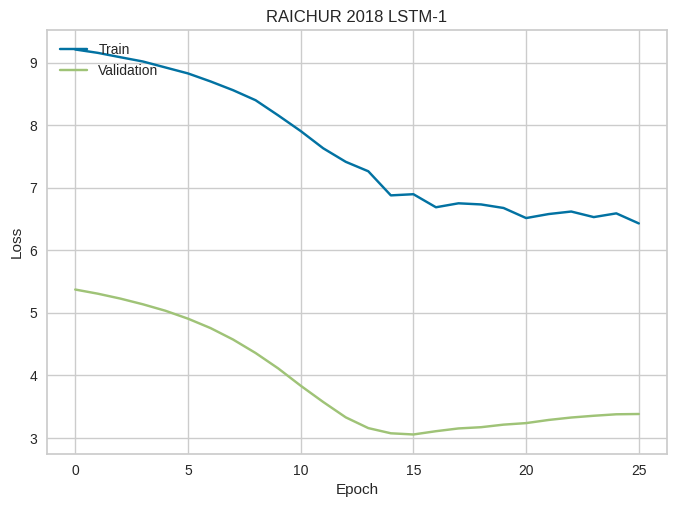

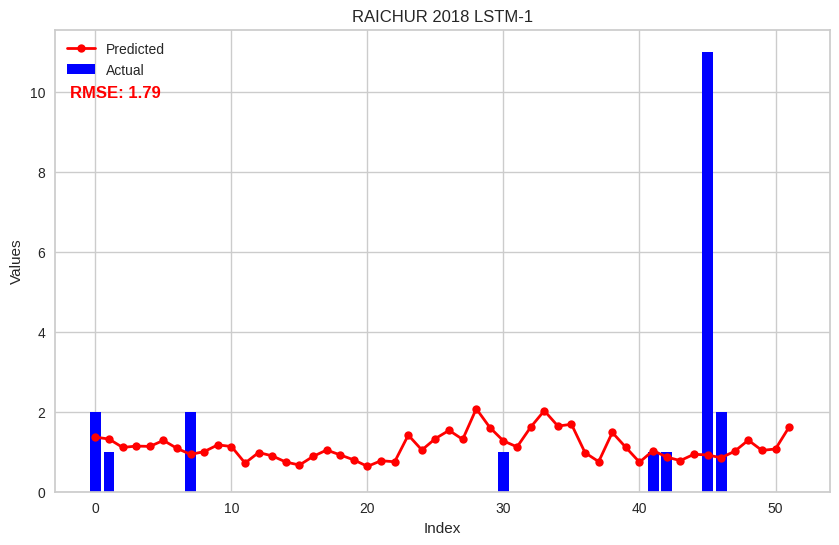

Analyzing District: RAMANAGARA
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


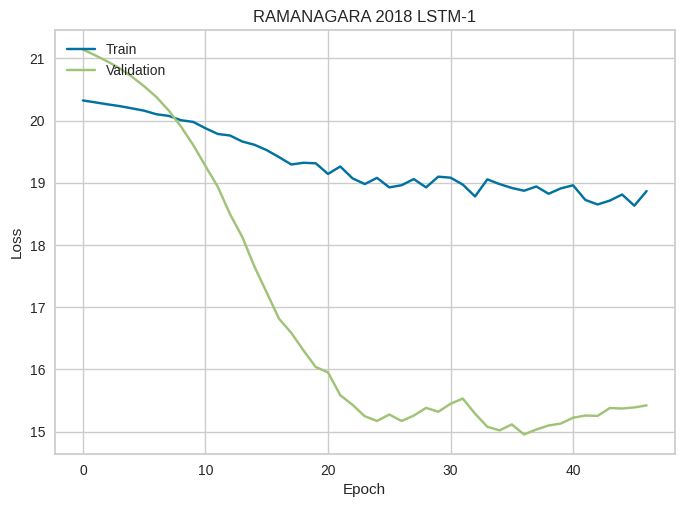

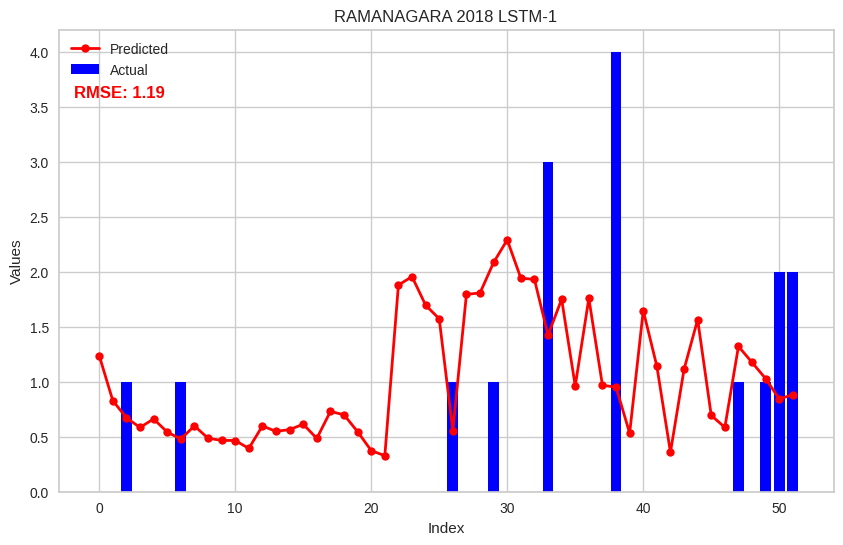

Analyzing District: SHIVAMOGGA
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


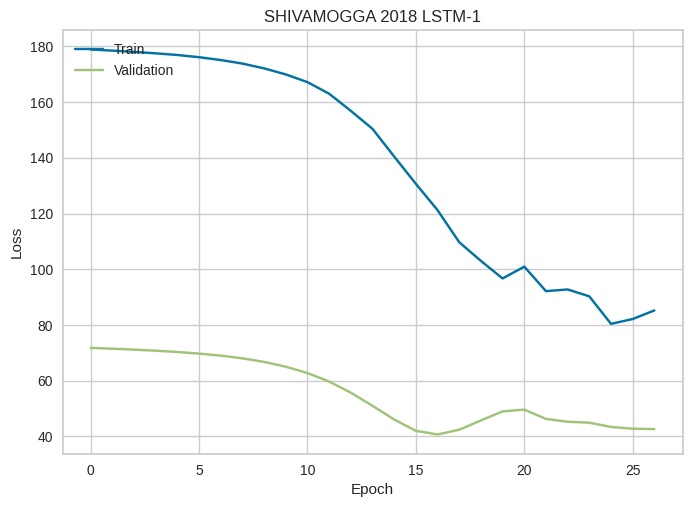

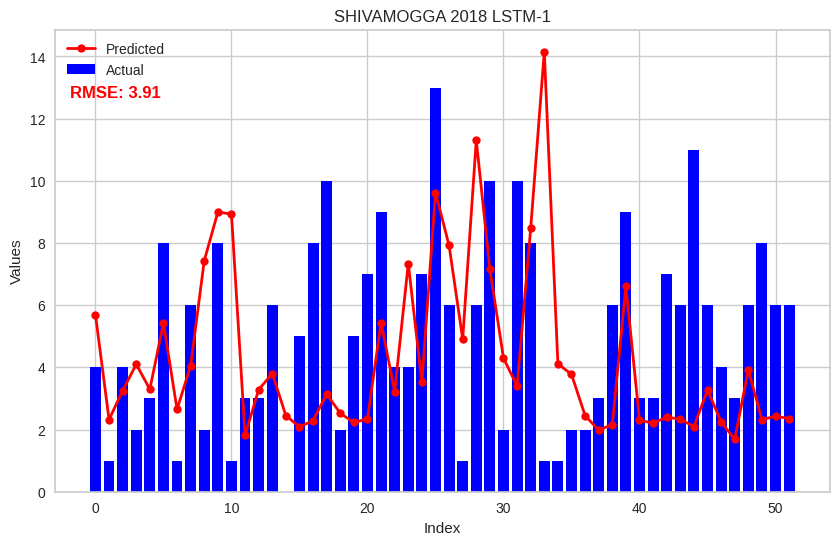

Analyzing District: TUMAKURU
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step


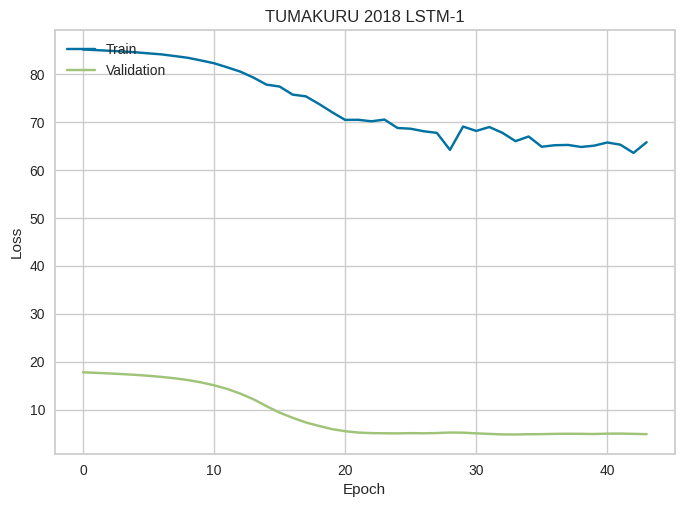

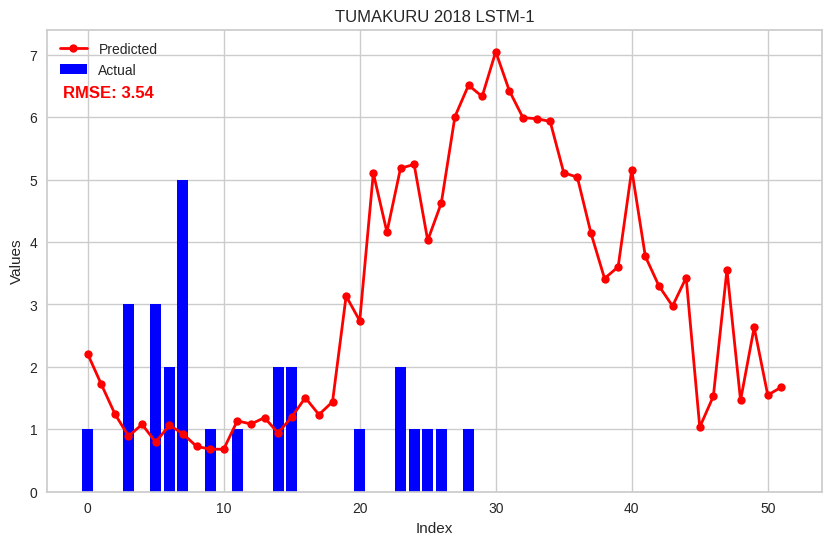

Analyzing District: UDUPI
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step


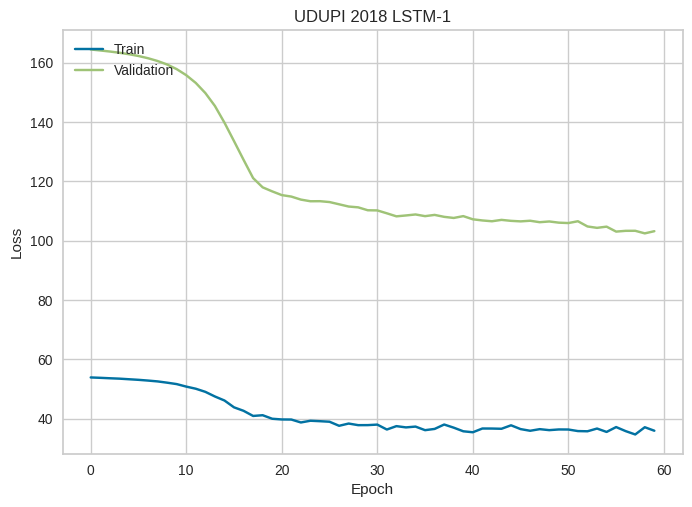

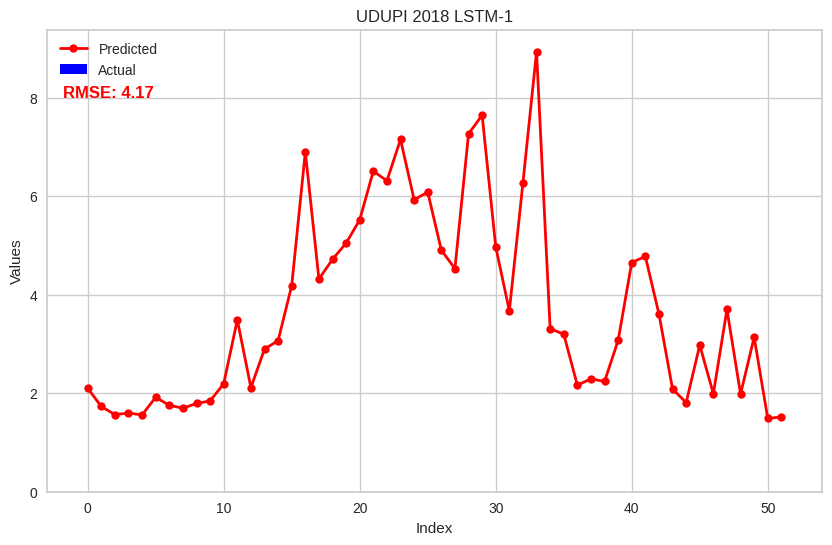

Analyzing District: UTTARA KANNADA
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step


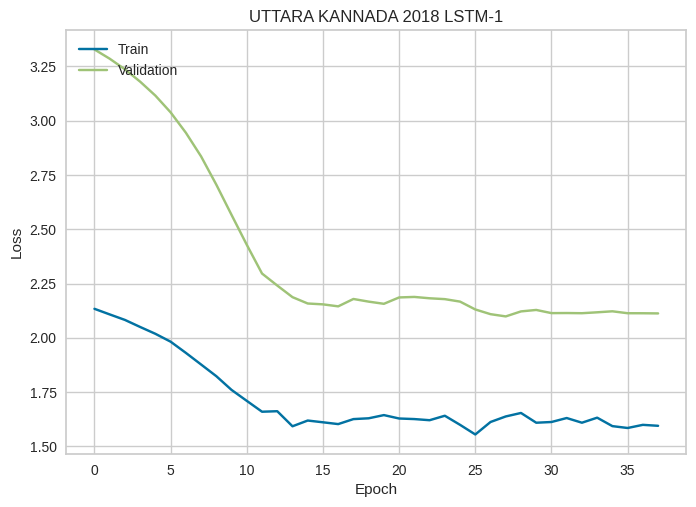

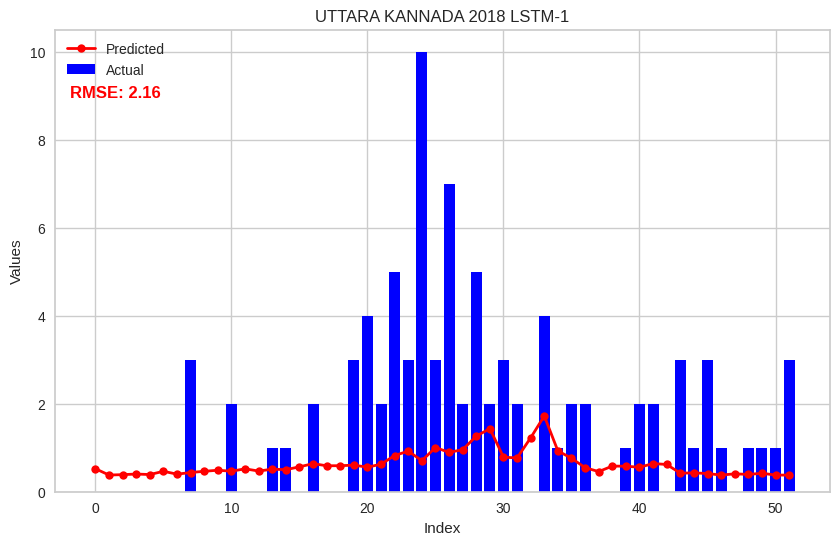

Analyzing District: VIJAYANAGAR
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


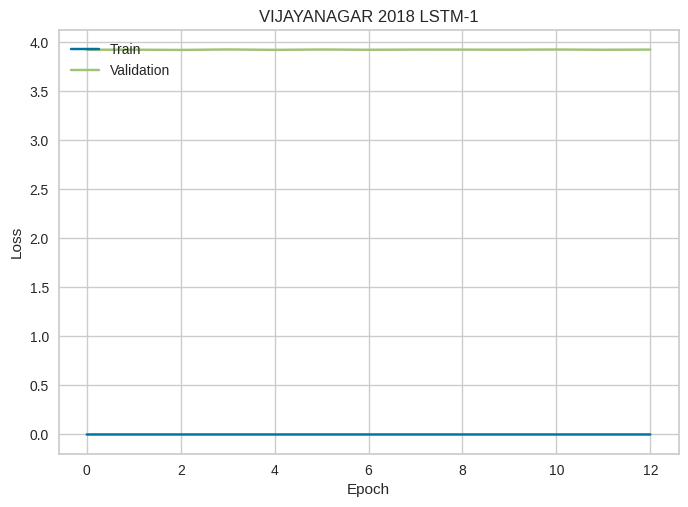

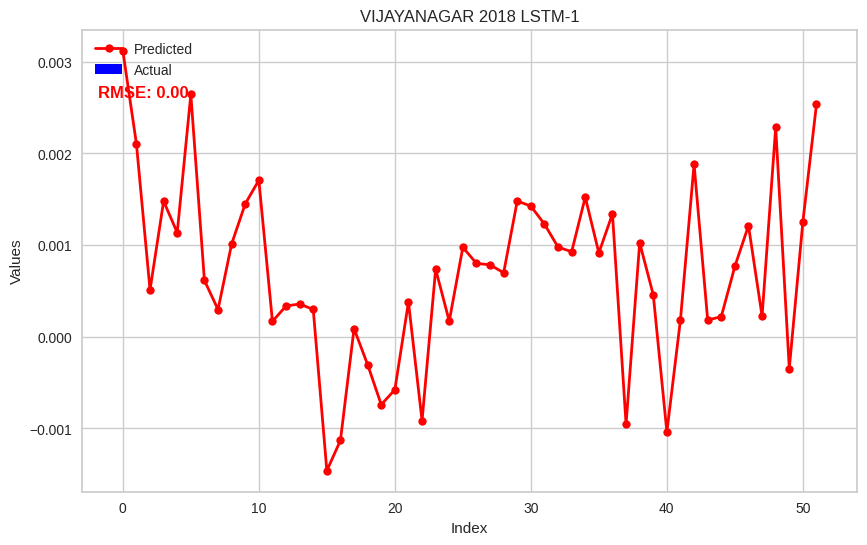

Analyzing District: VIJAYAPURA
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step


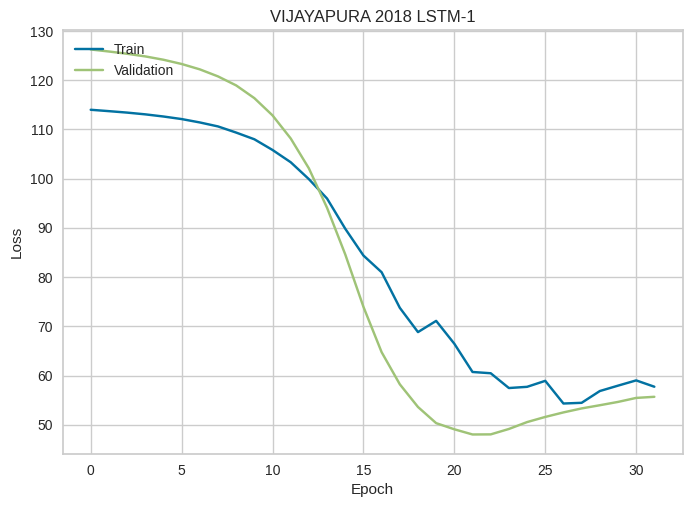

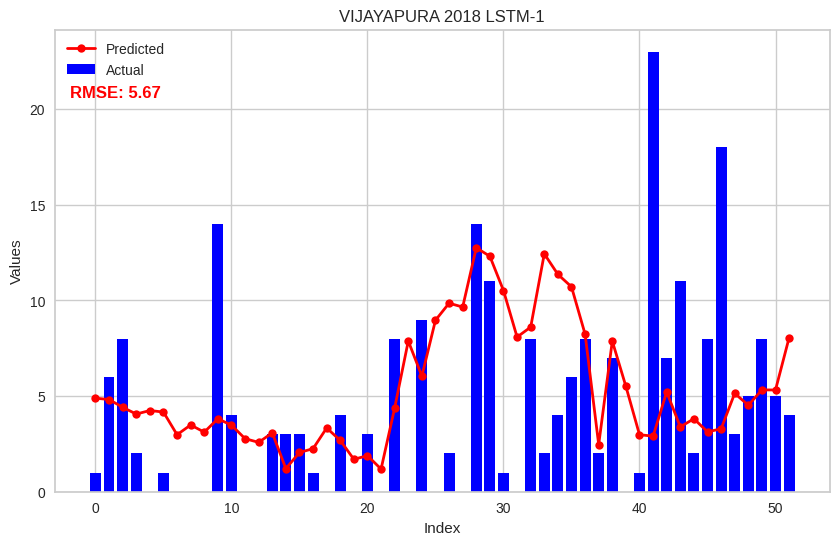

Analyzing District: YADGIR
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step


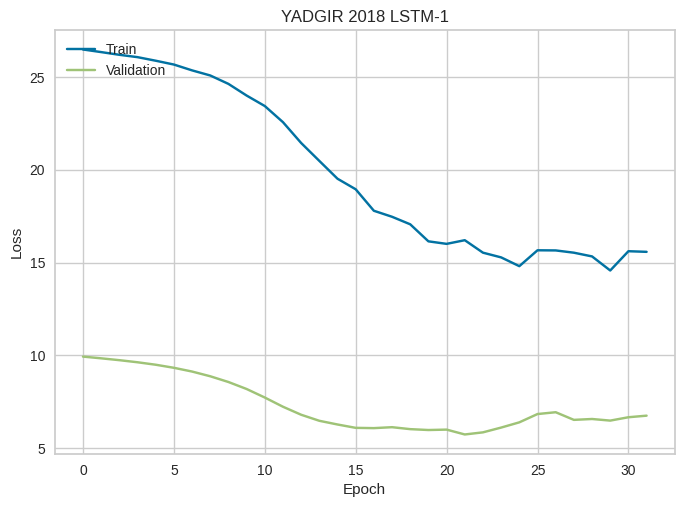

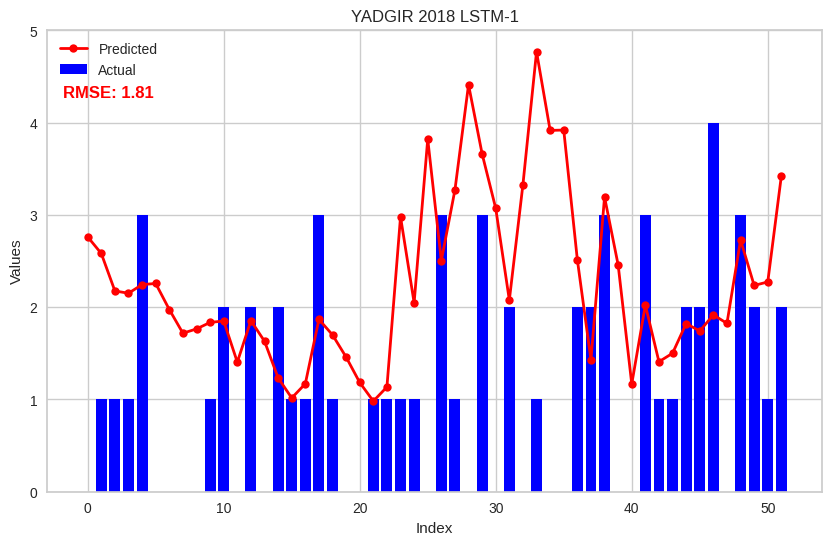

In [21]:
district_analysis = DistrictAnalysis("Karnataka_weather1980to2022.csv",2018,1)
df_2018 = district_analysis.analyze_districts()

Analyzing District: BAGALKOTE
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step


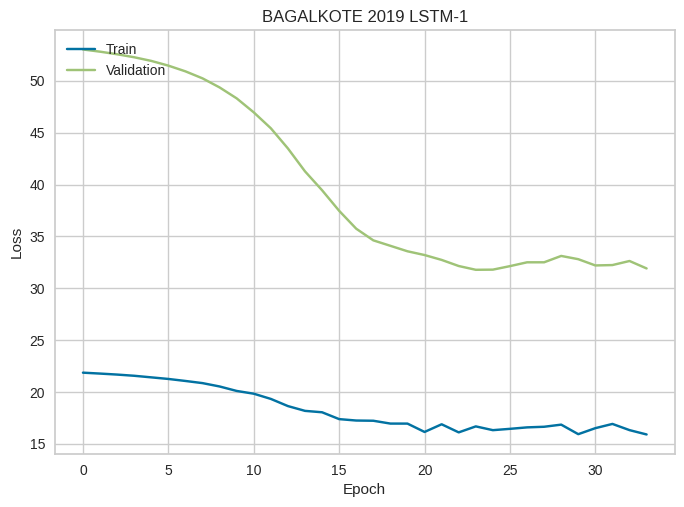

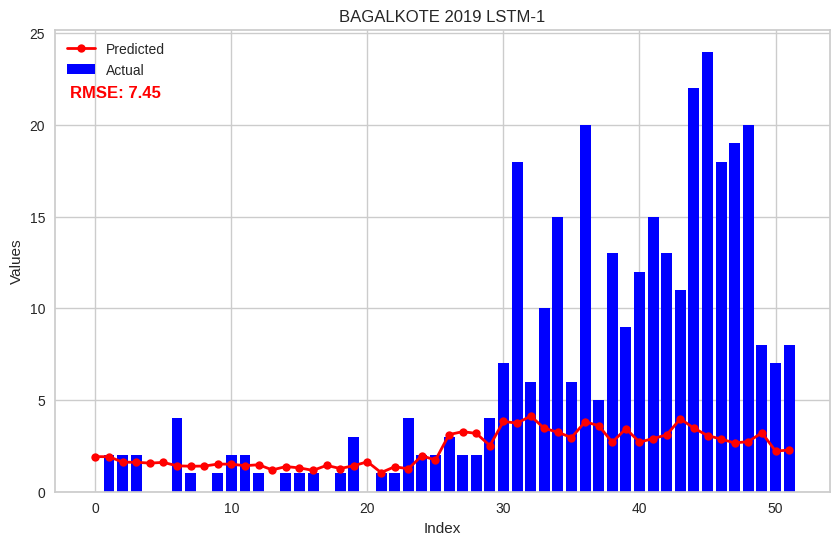

Analyzing District: BALLARI
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step


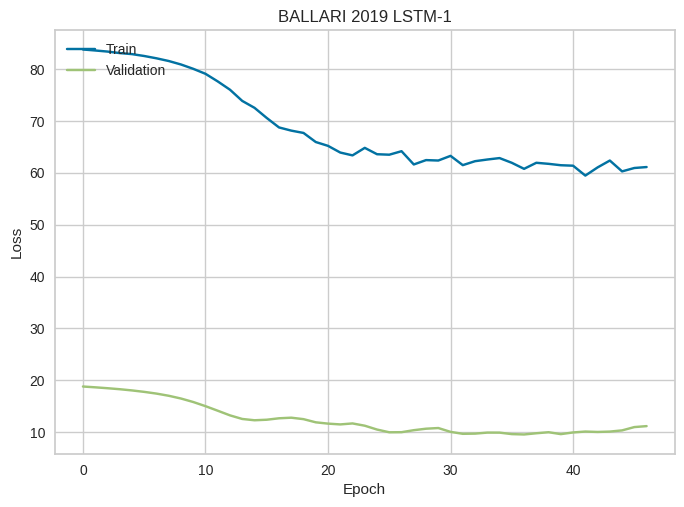

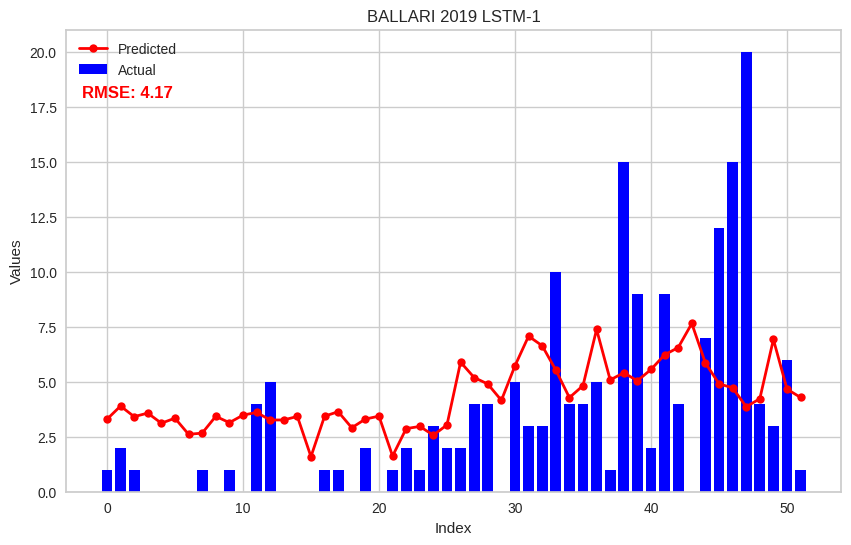

Analyzing District: BELAGAVI
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


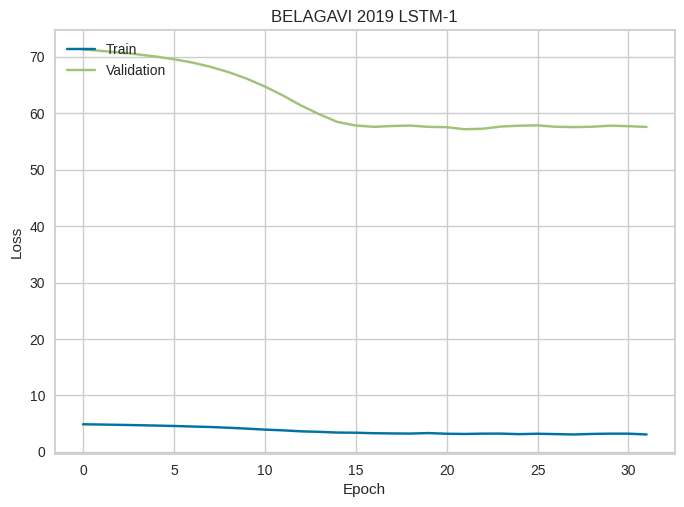

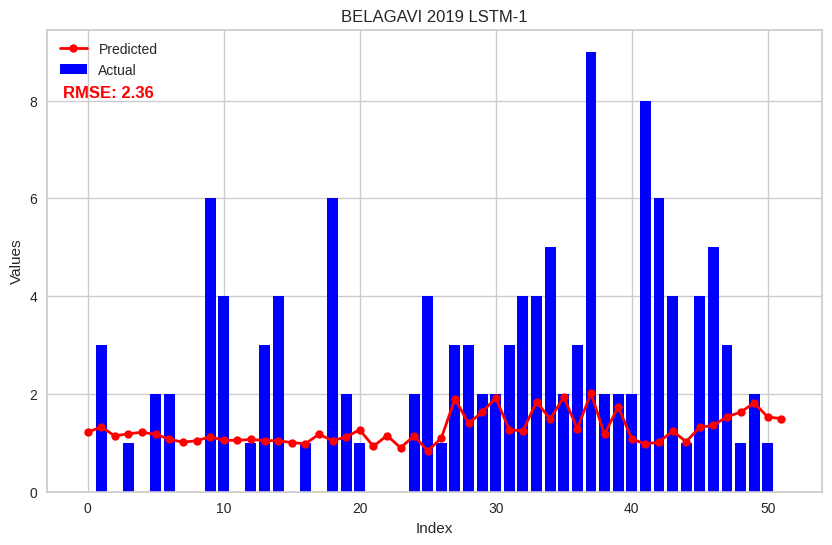

Analyzing District: BENGALURU RURAL
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


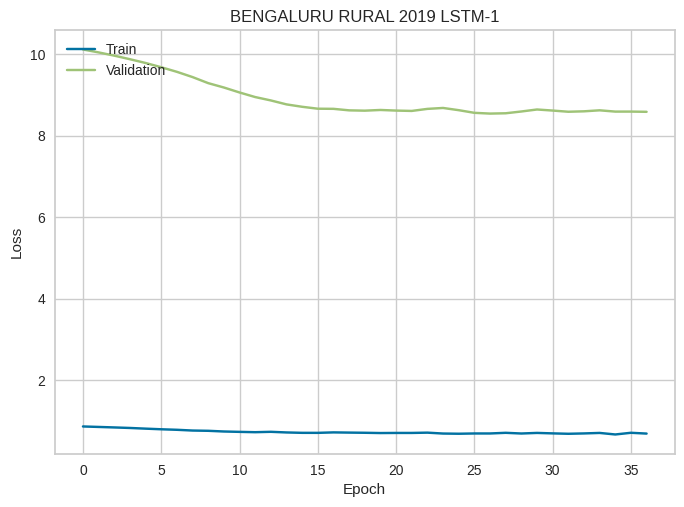

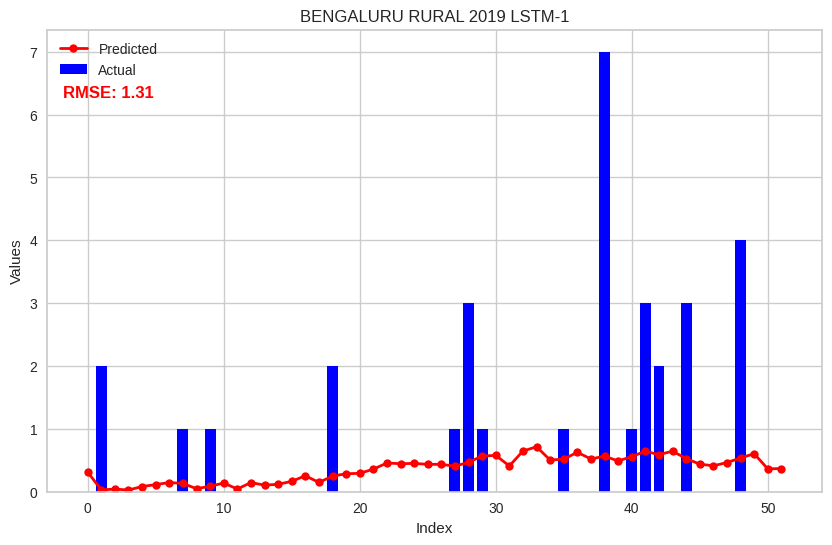

Analyzing District: BENGALURU URBAN
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step


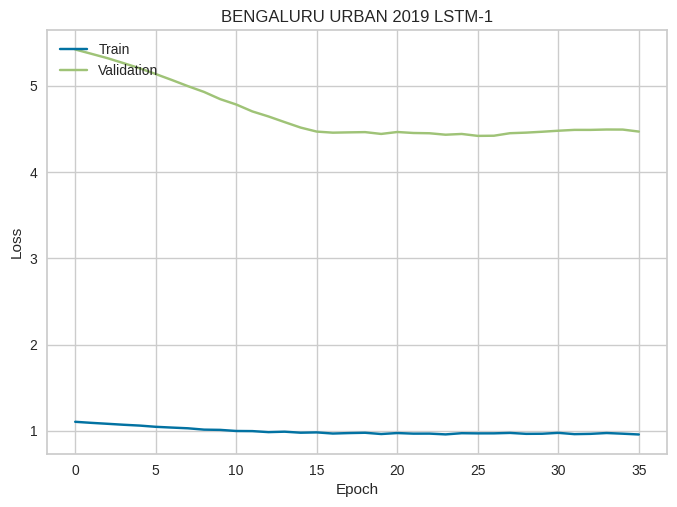

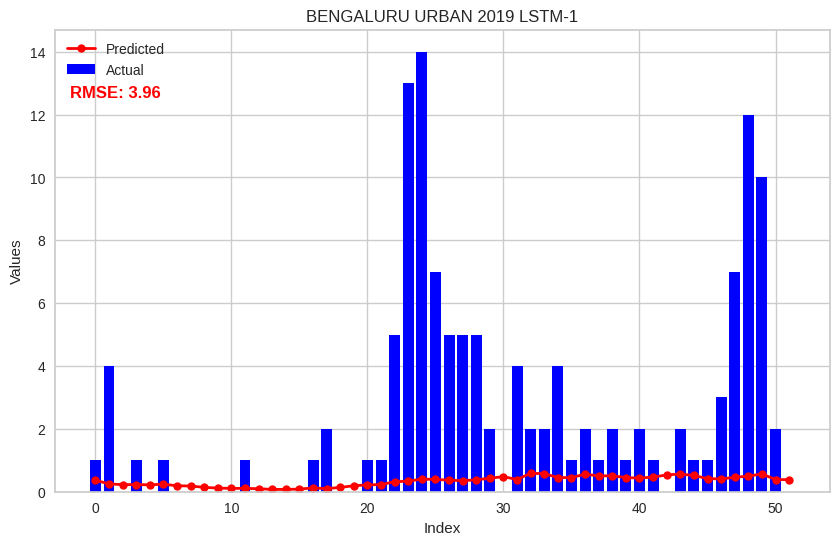

Analyzing District: BIDAR
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step


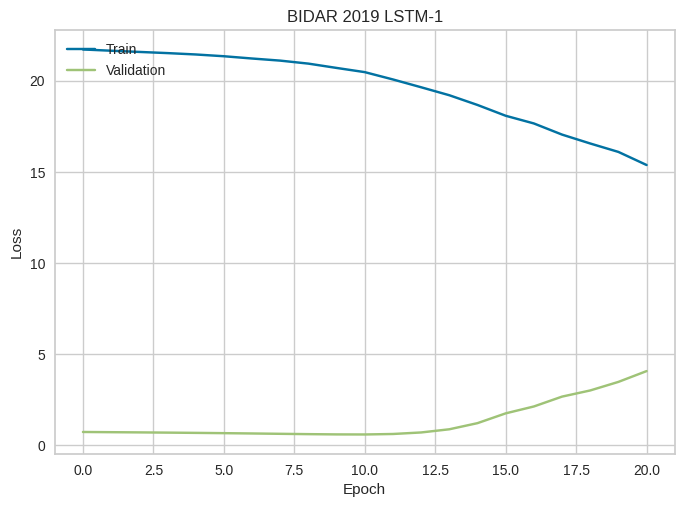

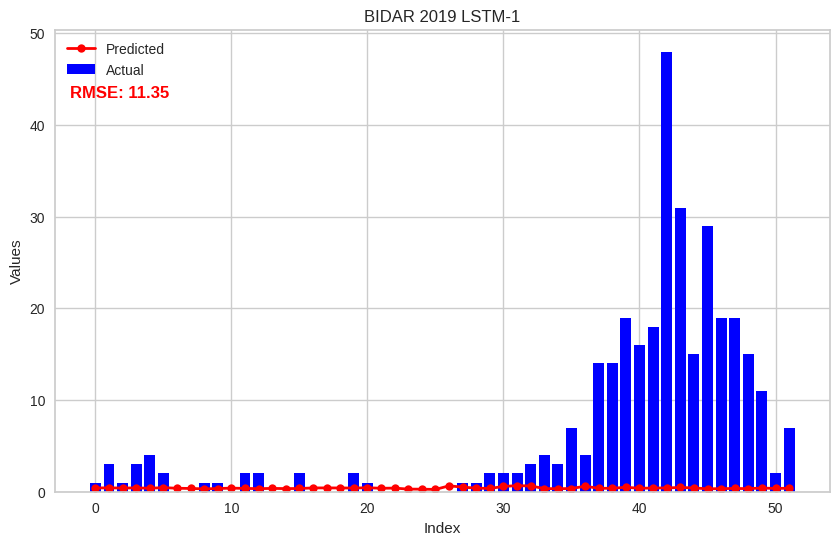

Analyzing District: CHAMARAJANAGARA
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step


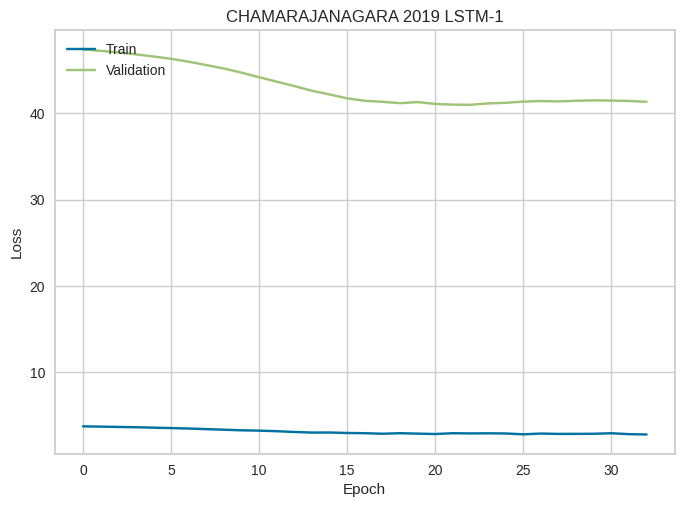

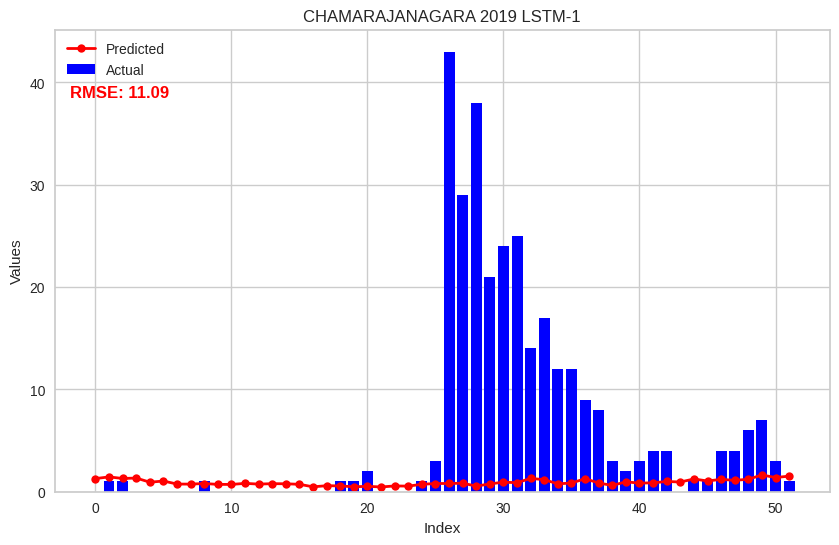

Analyzing District: CHIKKABALLAPURA
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step


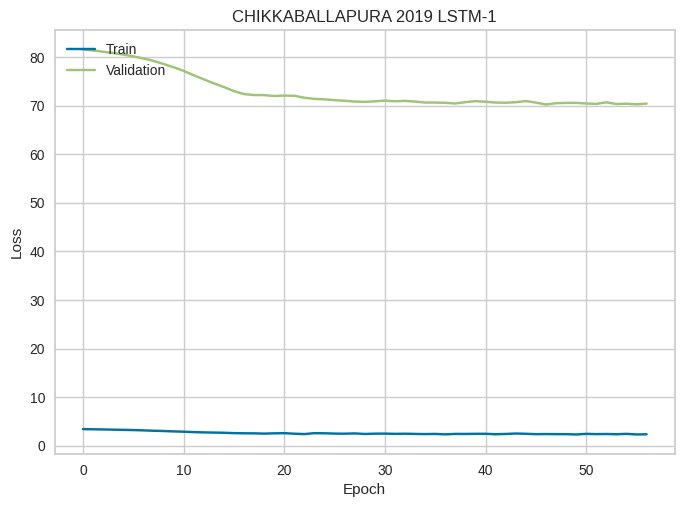

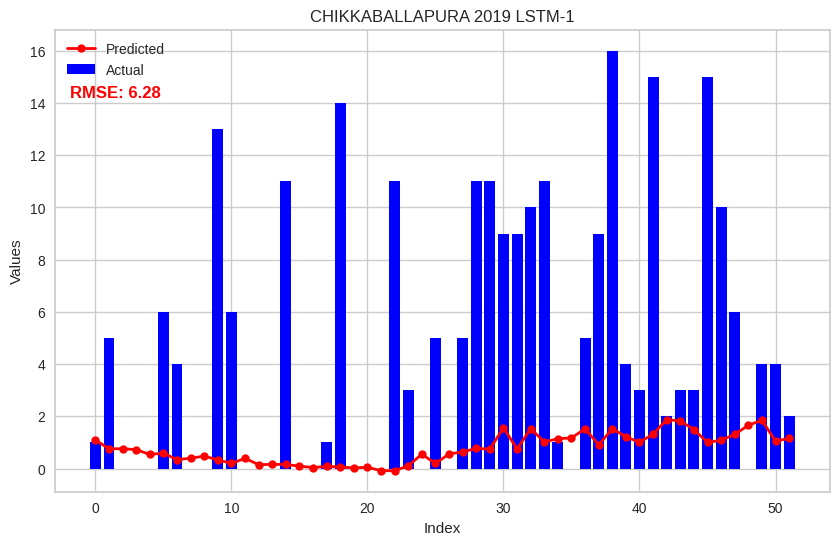

Analyzing District: CHIKKAMAGALURU
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step


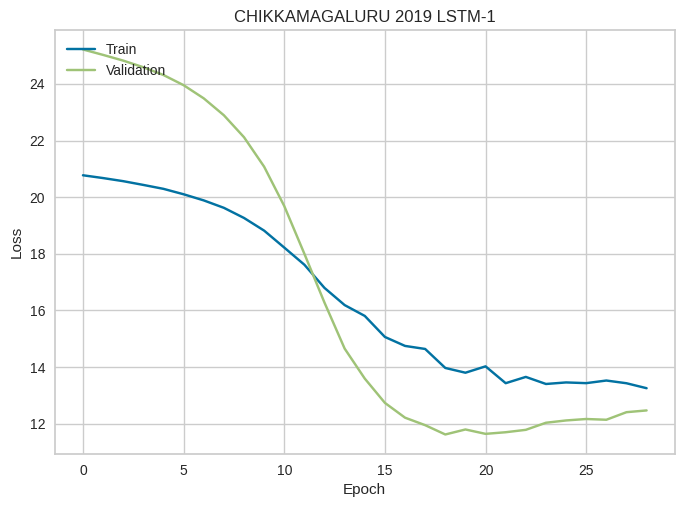

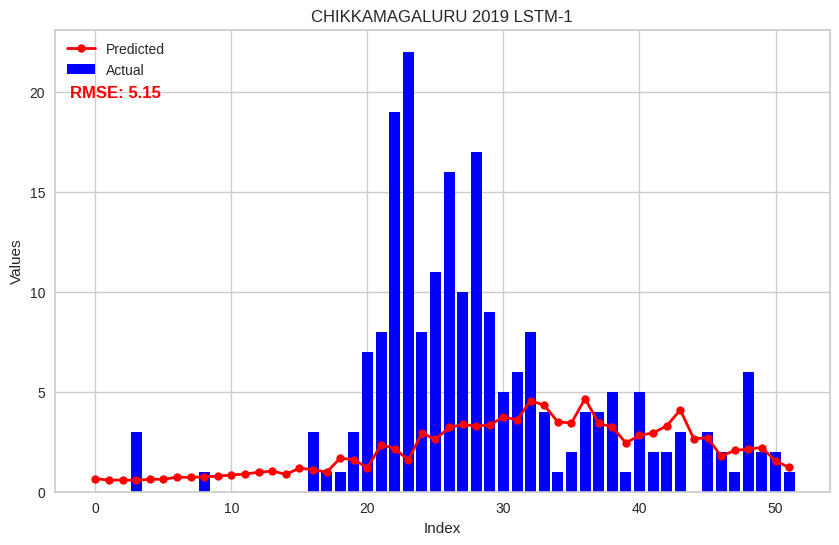

Analyzing District: CHITRADURGA
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step


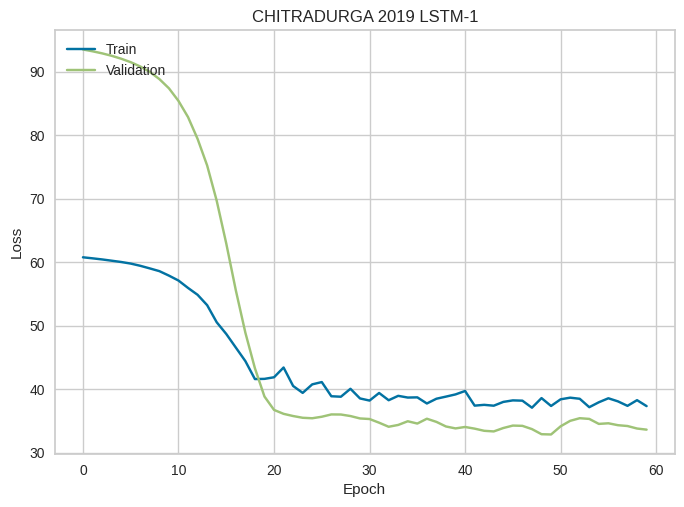

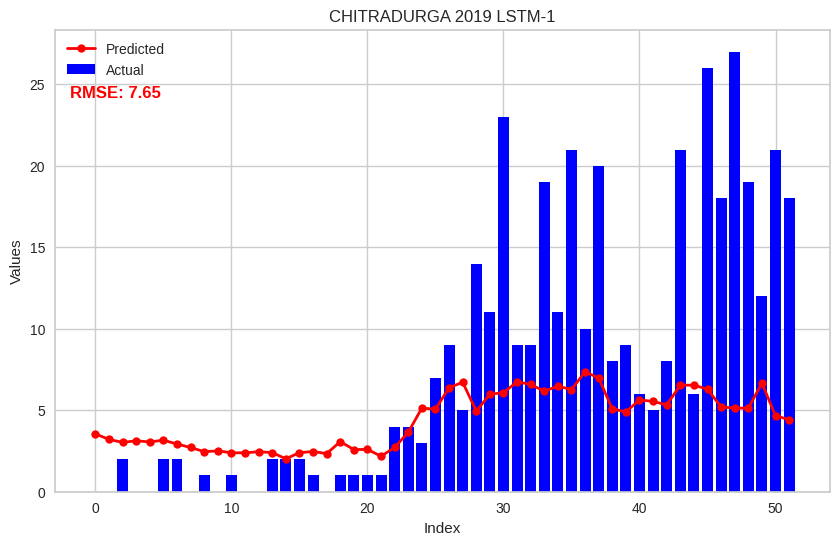

Analyzing District: DAKSHINA KANNADA
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step


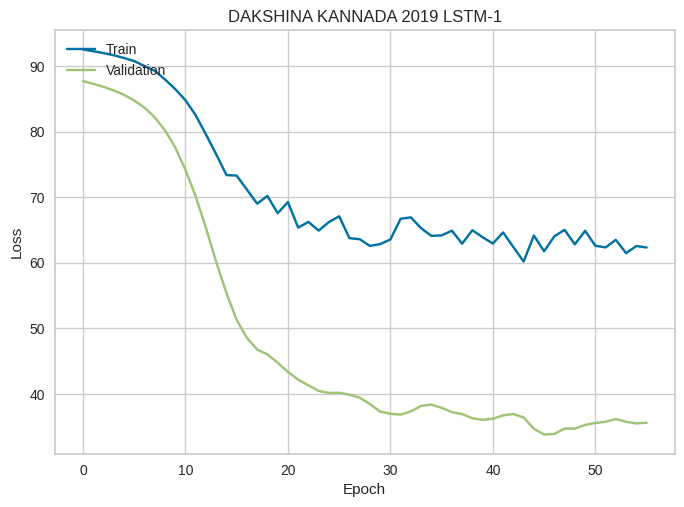

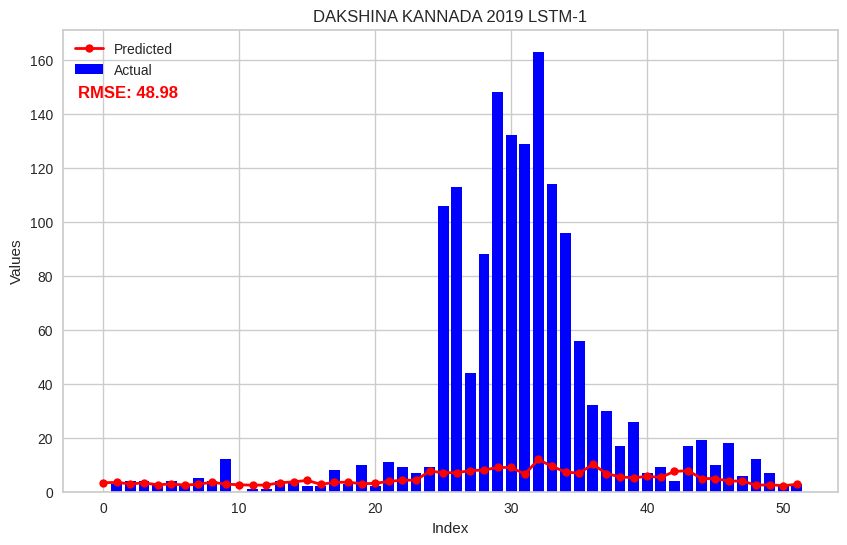

Analyzing District: DAVANGERE
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step


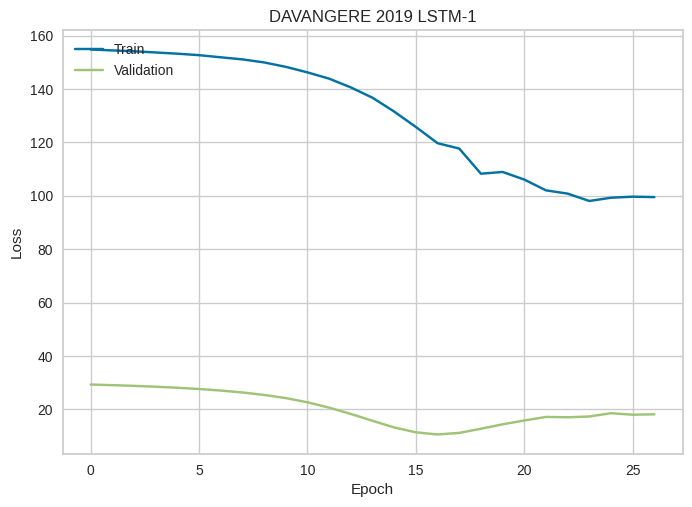

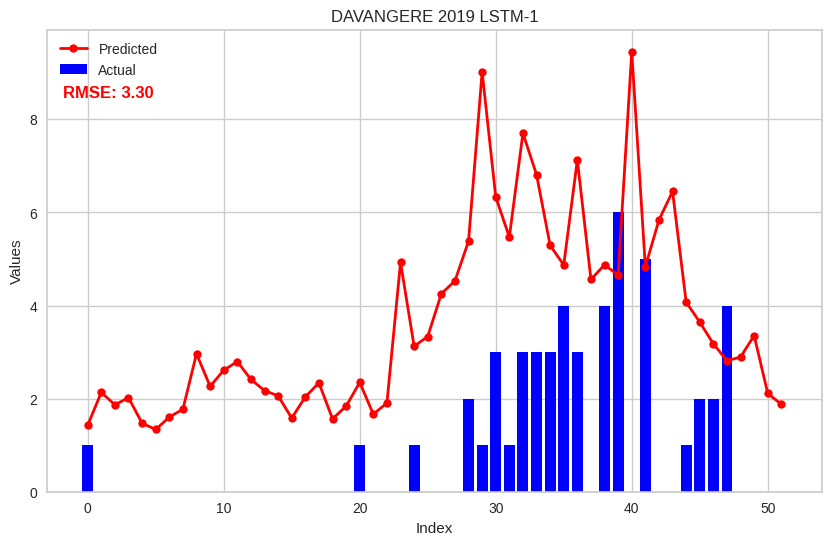

Analyzing District: DHARWAD
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step


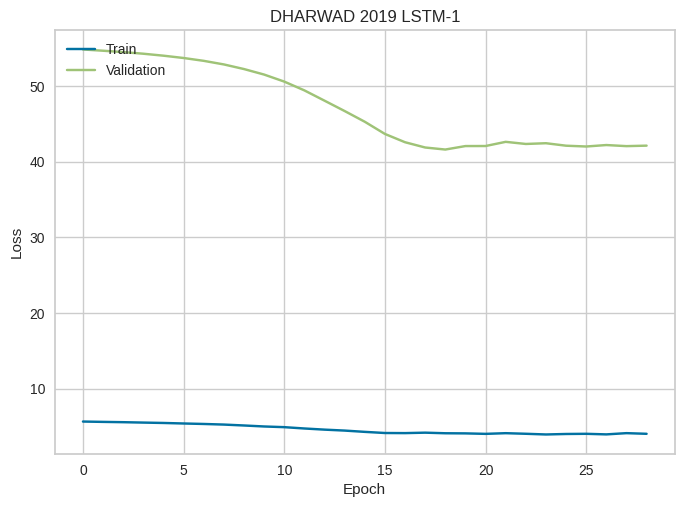

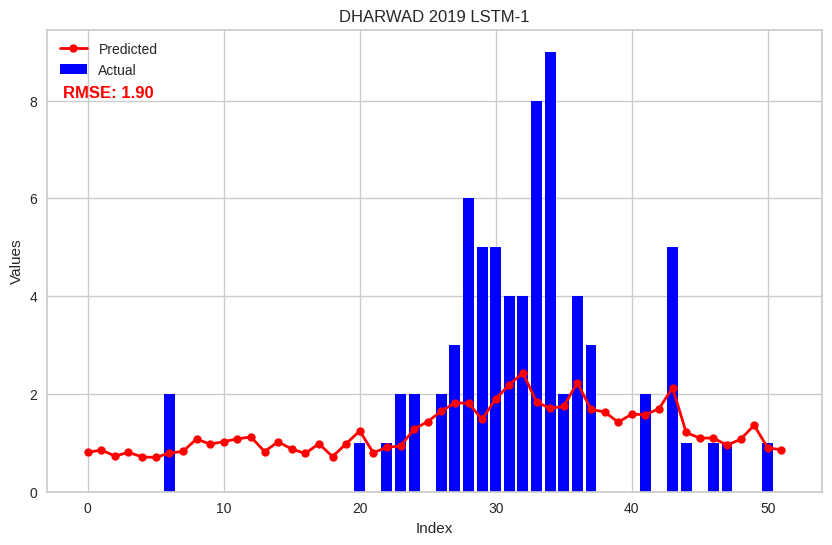

Analyzing District: GADAG
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


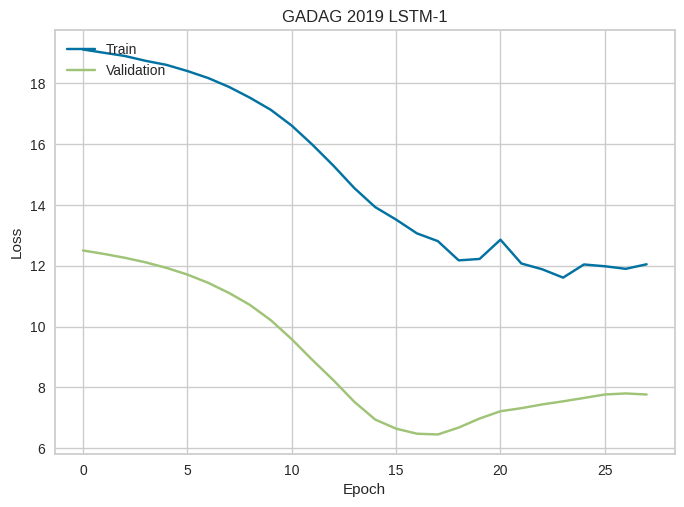

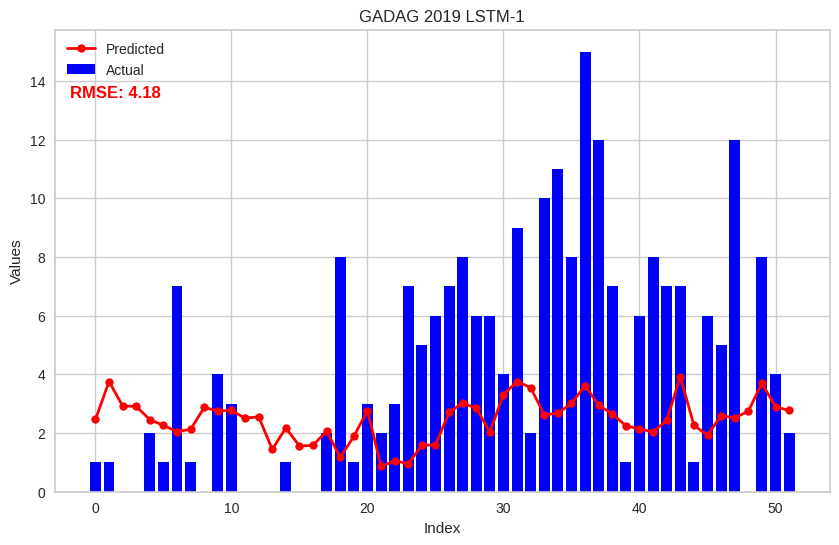

Analyzing District: HASSAN
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step


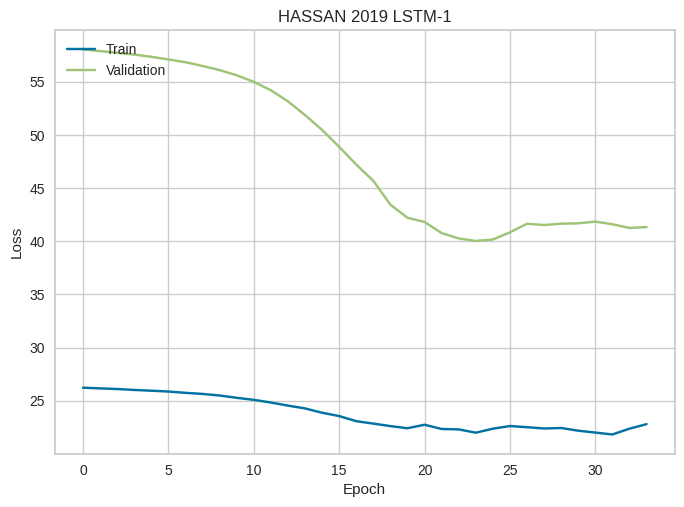

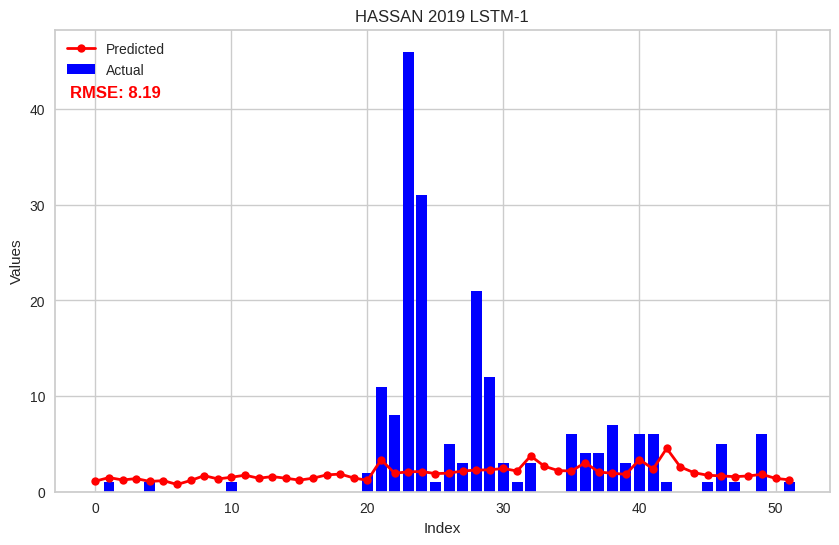

Analyzing District: HAVERI
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step


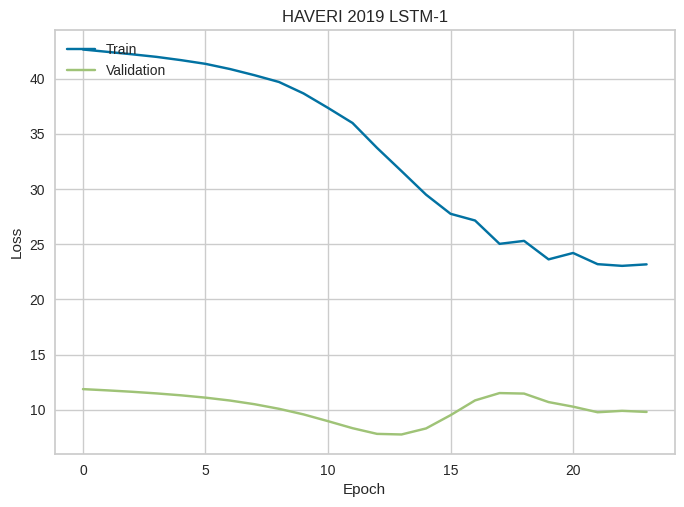

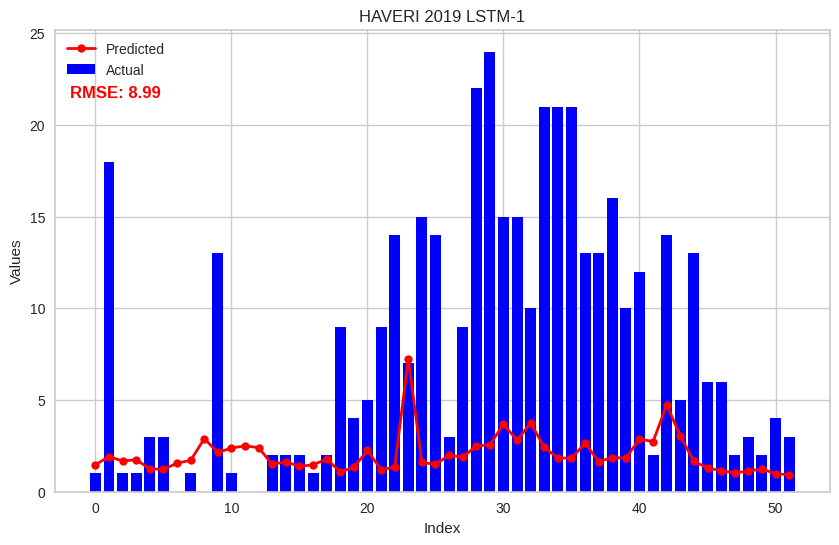

Analyzing District: KALABURAGI
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step


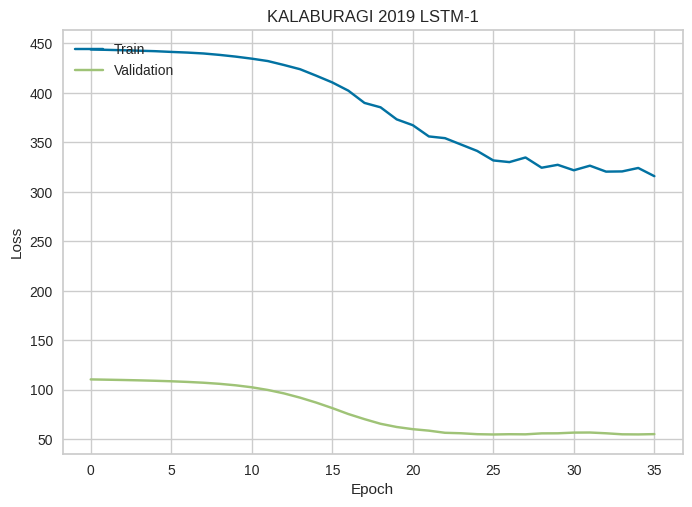

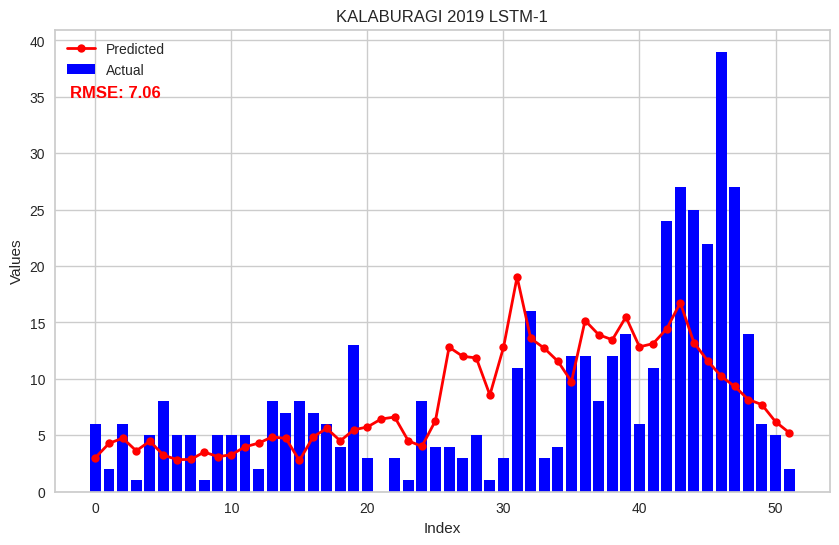

Analyzing District: KODAGU
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step


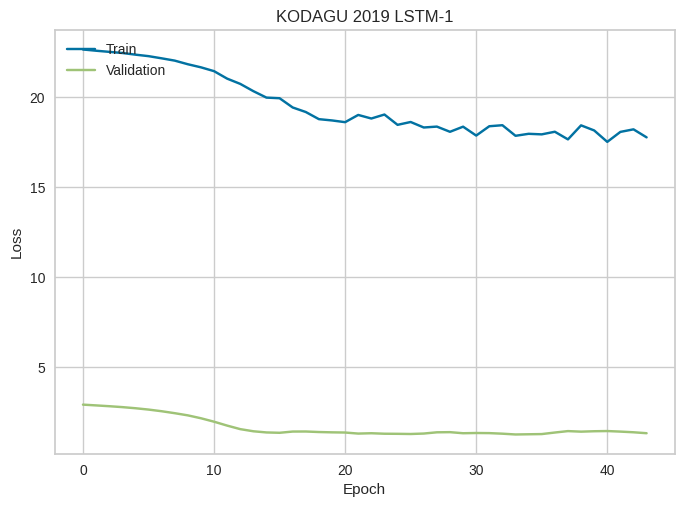

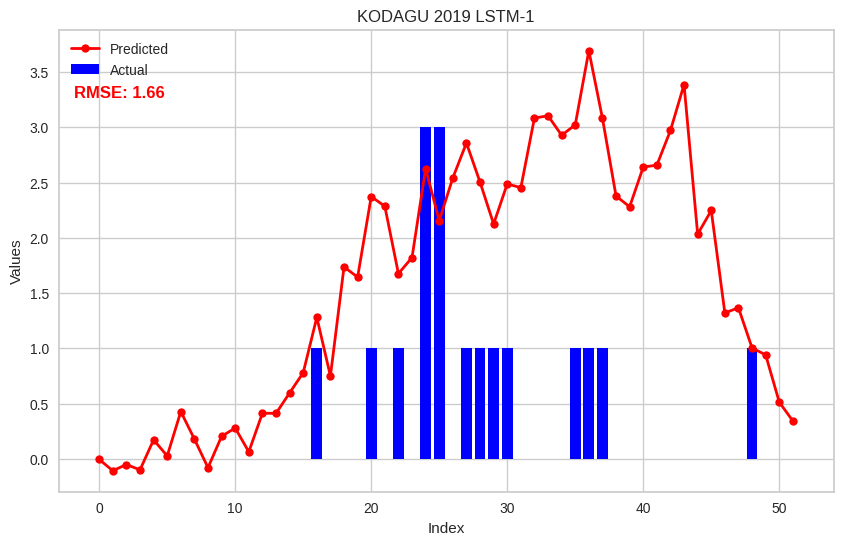

Analyzing District: KOLAR
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


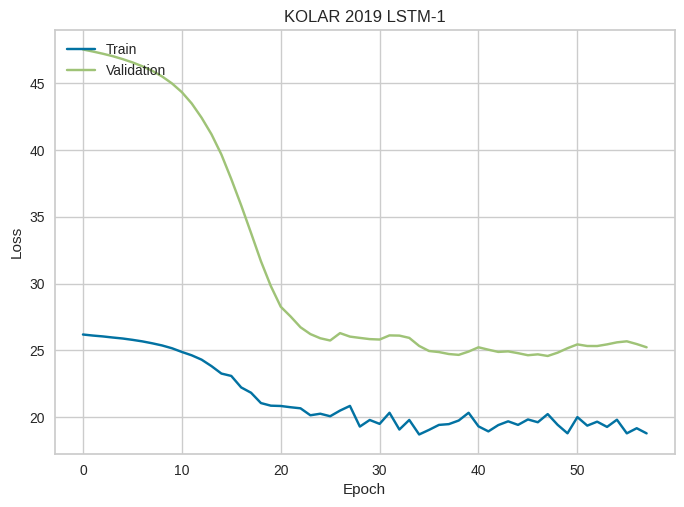

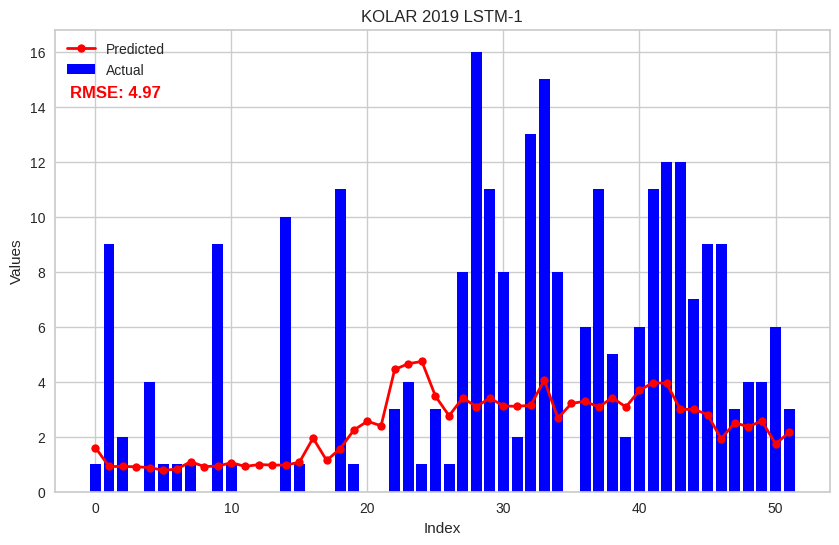

Analyzing District: KOPPAL
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


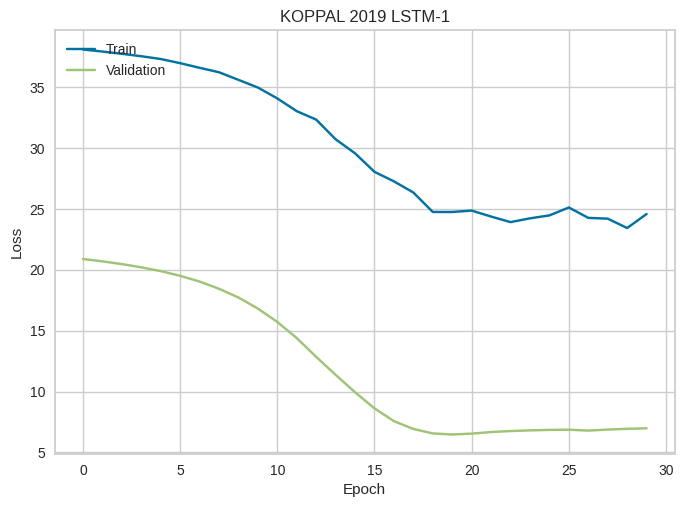

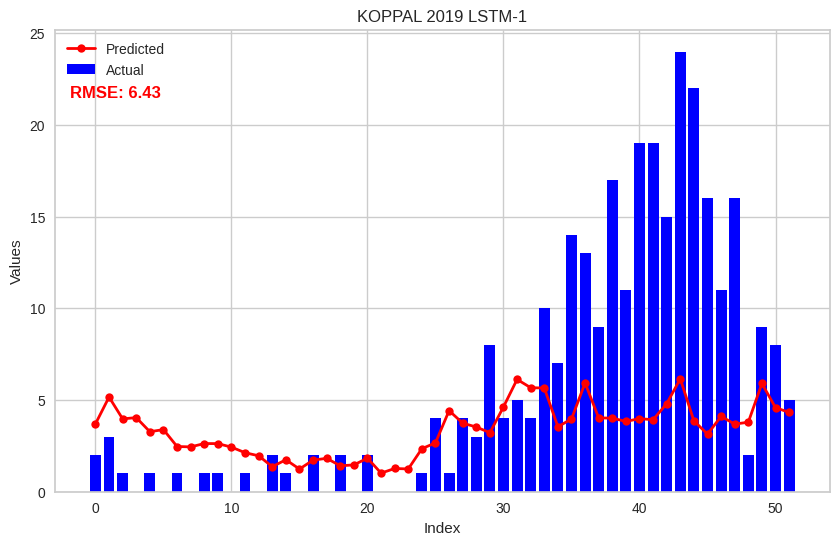

Analyzing District: MANDYA
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step


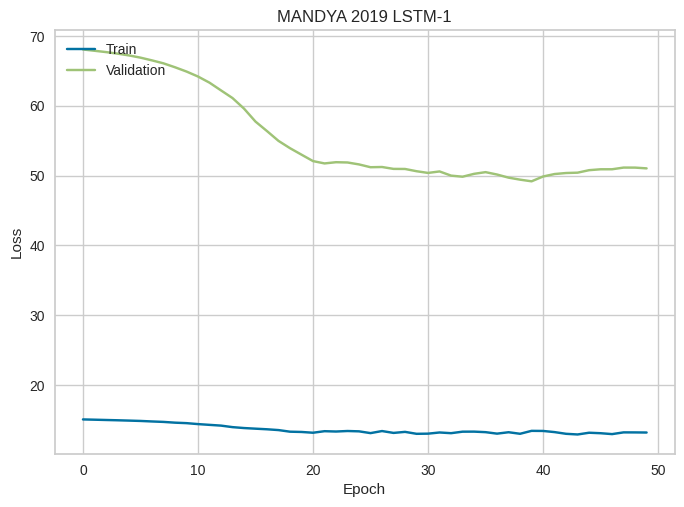

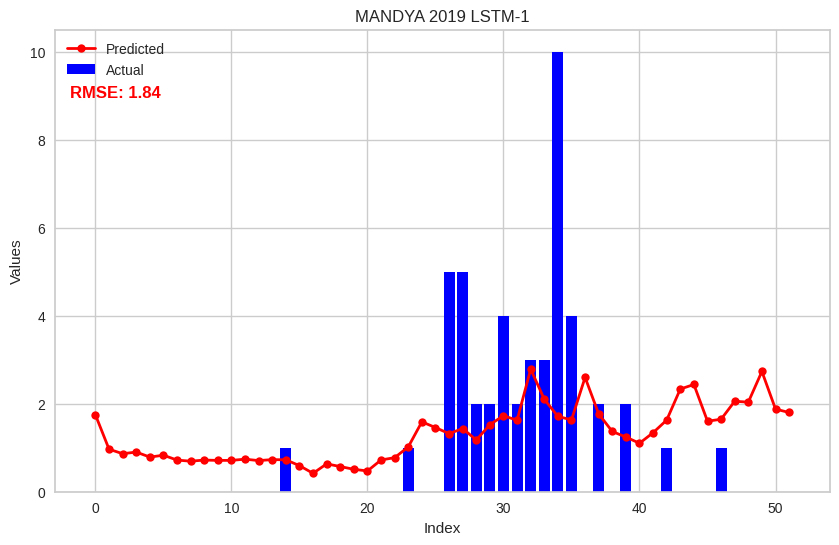

Analyzing District: MYSURU
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step


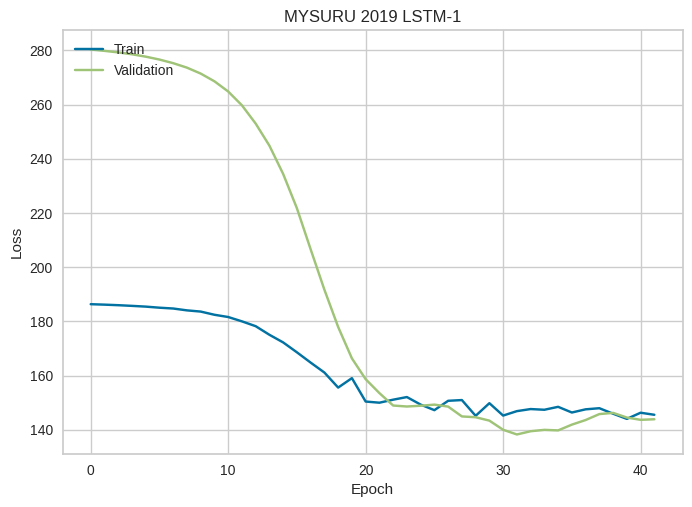

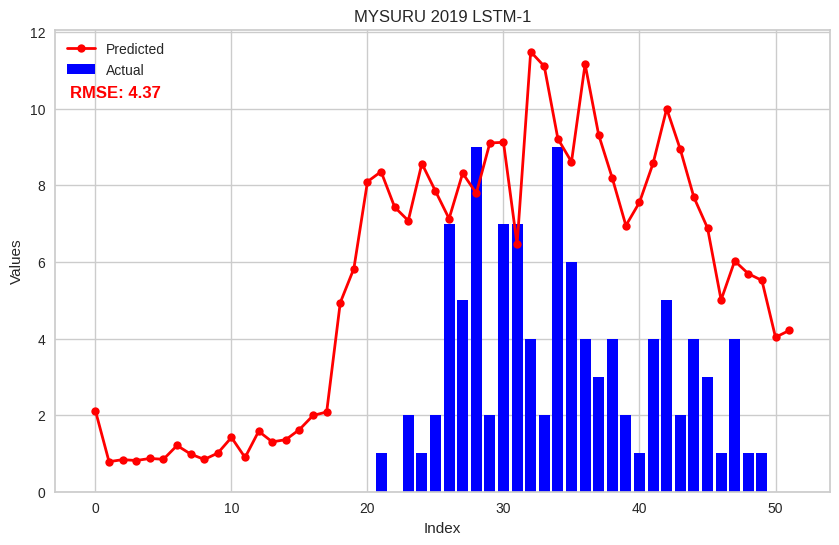

Analyzing District: RAICHUR
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step


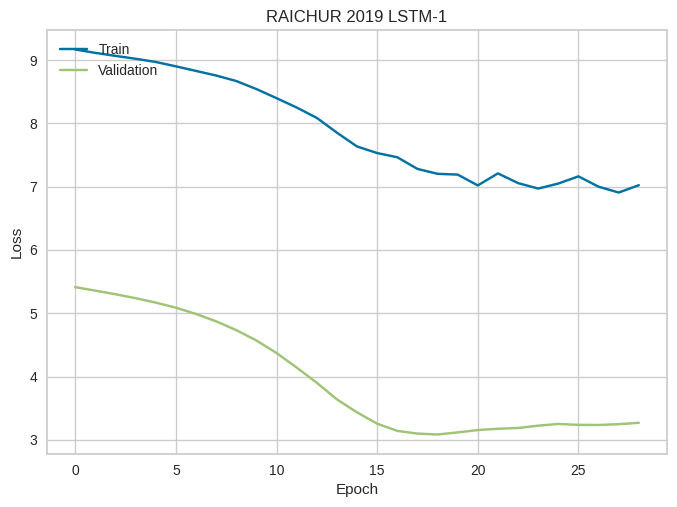

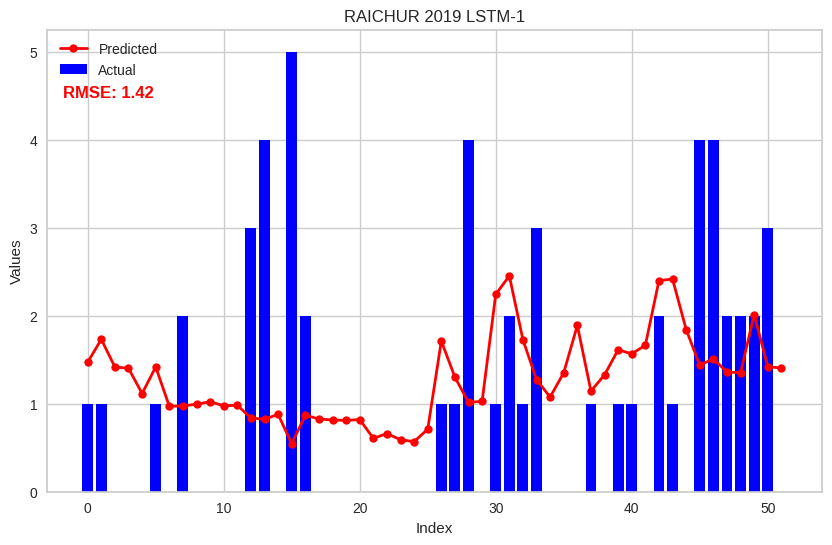

Analyzing District: RAMANAGARA
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


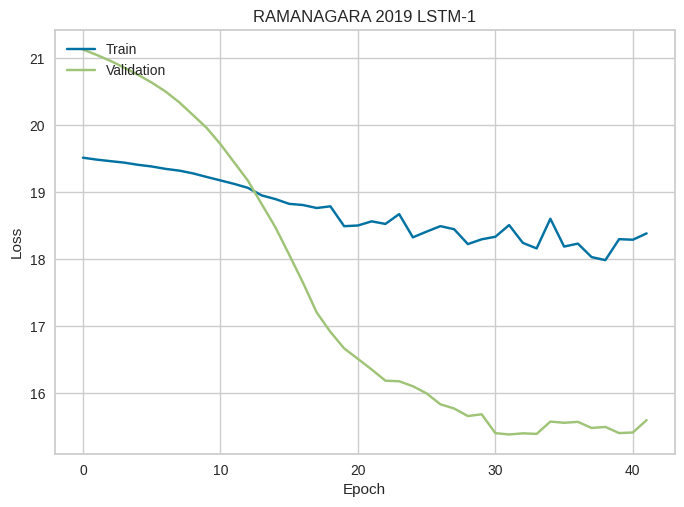

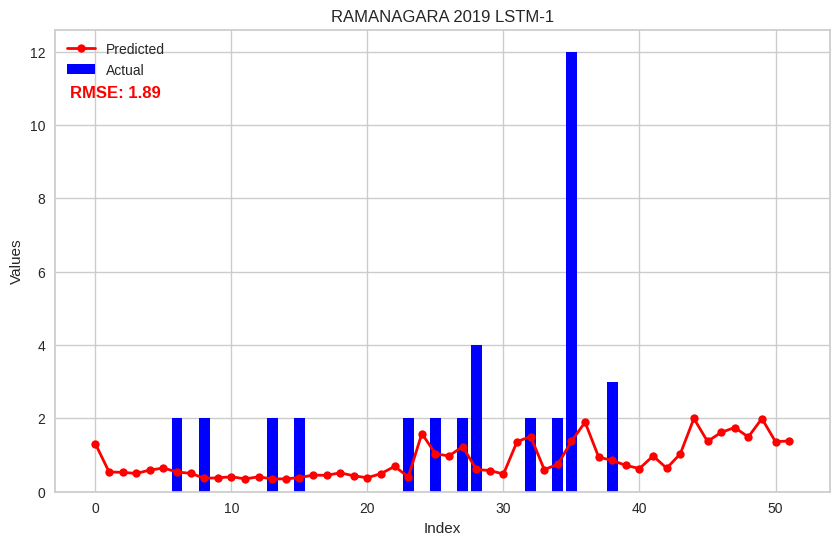

Analyzing District: SHIVAMOGGA
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step


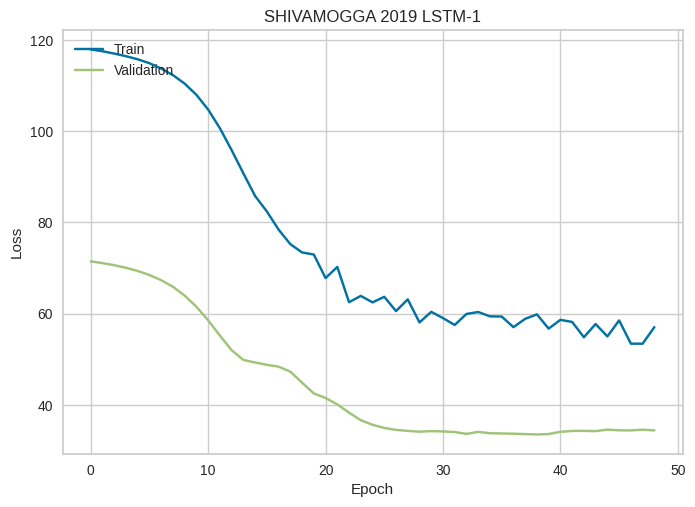

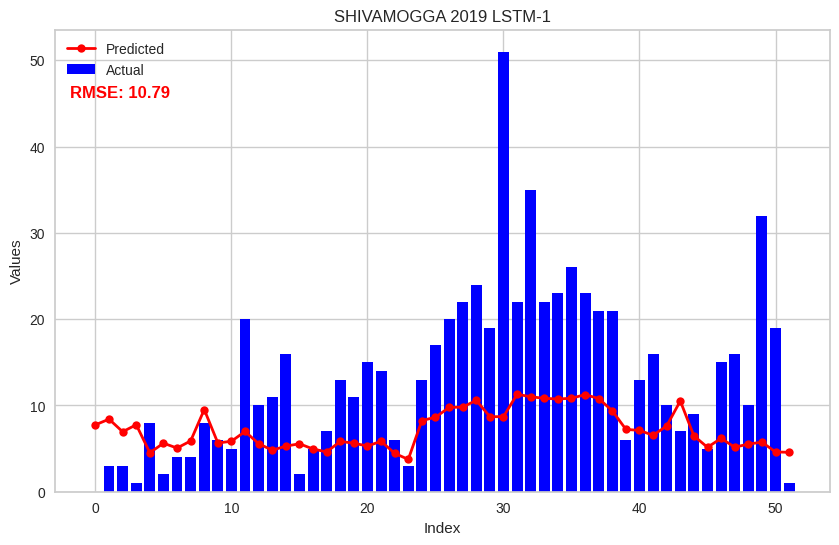

Analyzing District: TUMAKURU
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


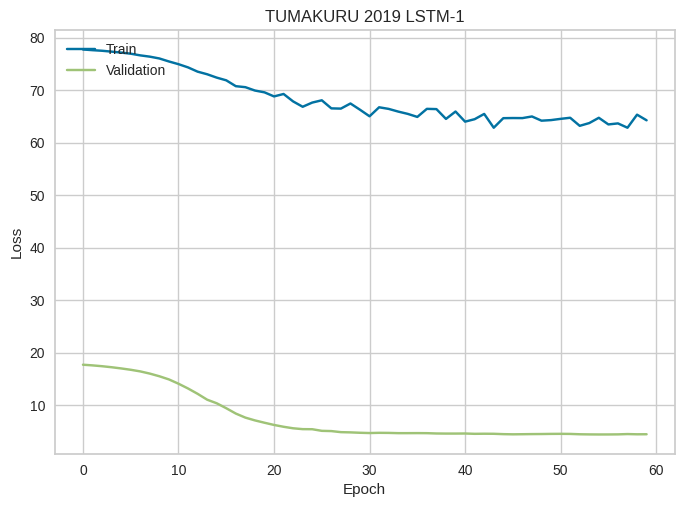

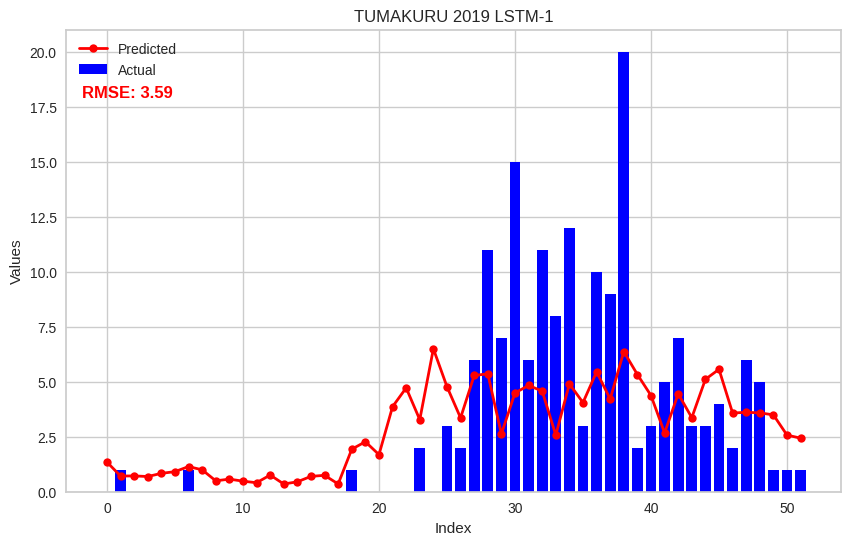

Analyzing District: UDUPI
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step


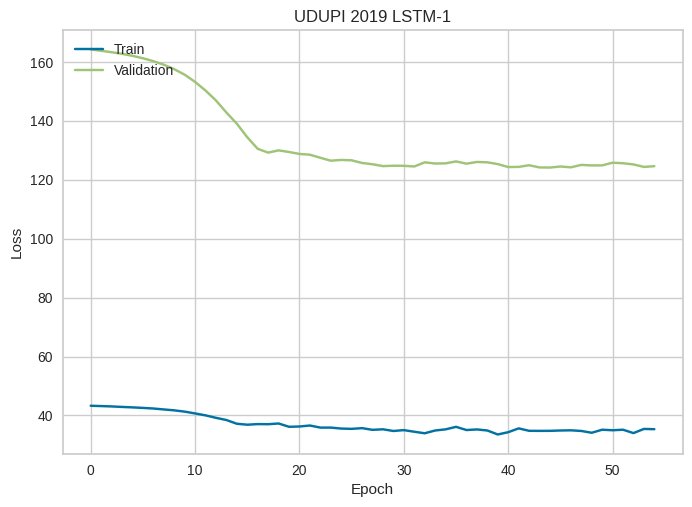

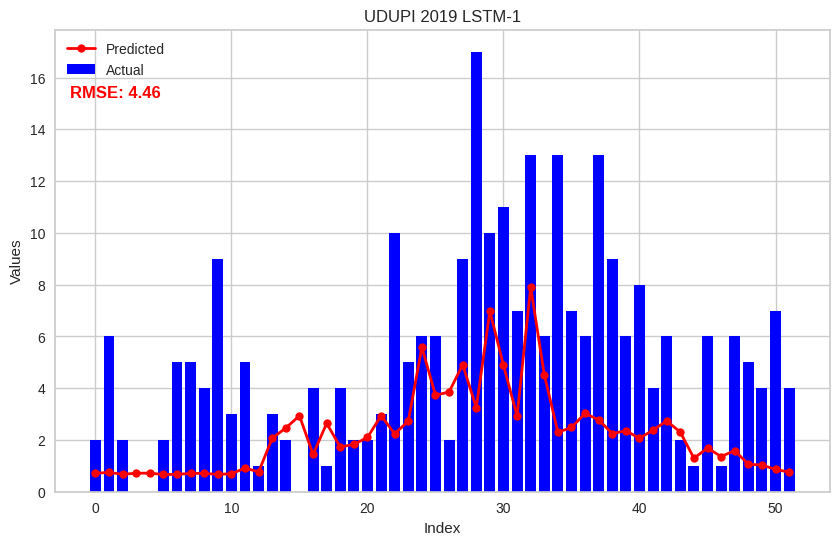

Analyzing District: UTTARA KANNADA
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step


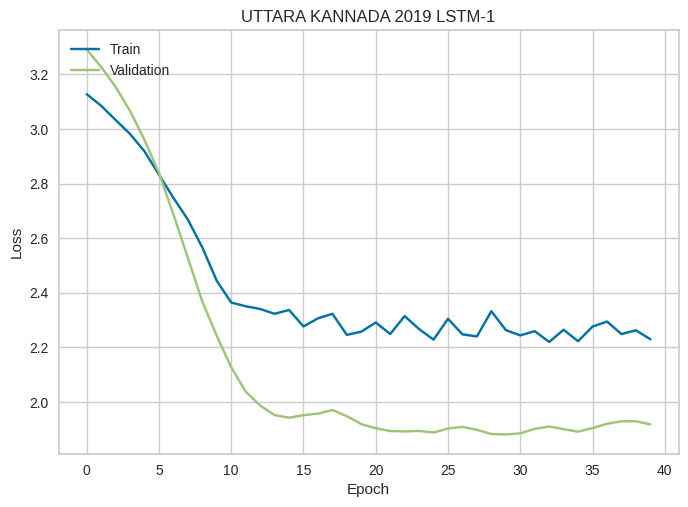

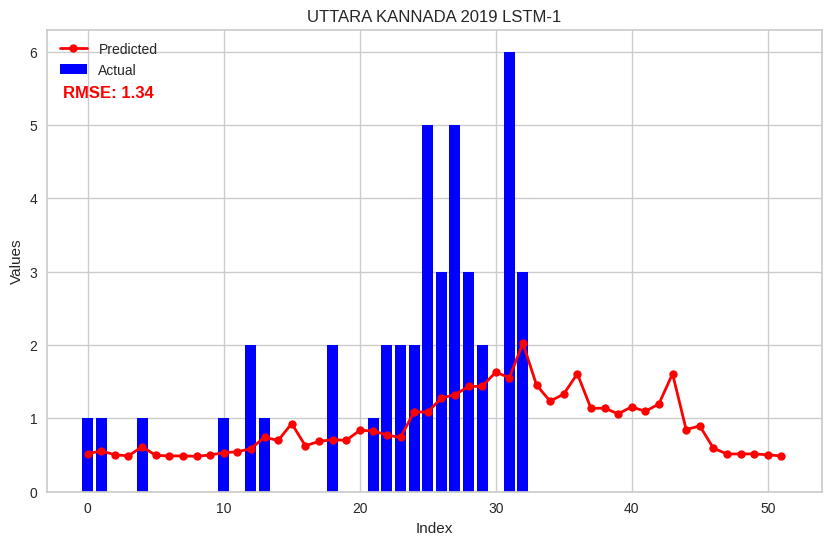

Analyzing District: VIJAYANAGAR
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step


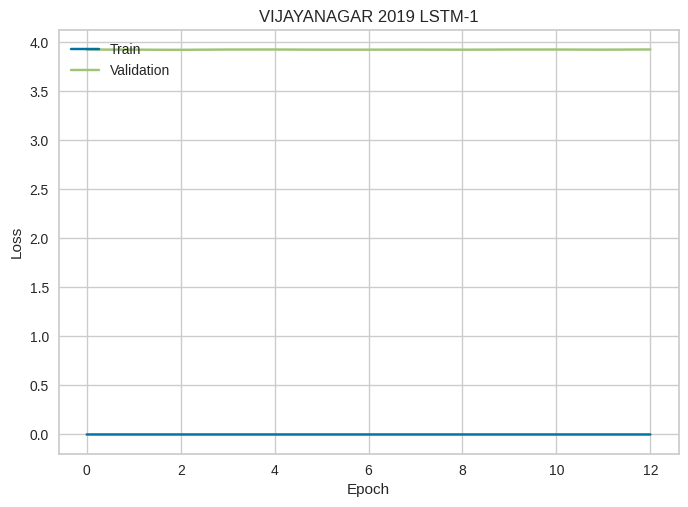

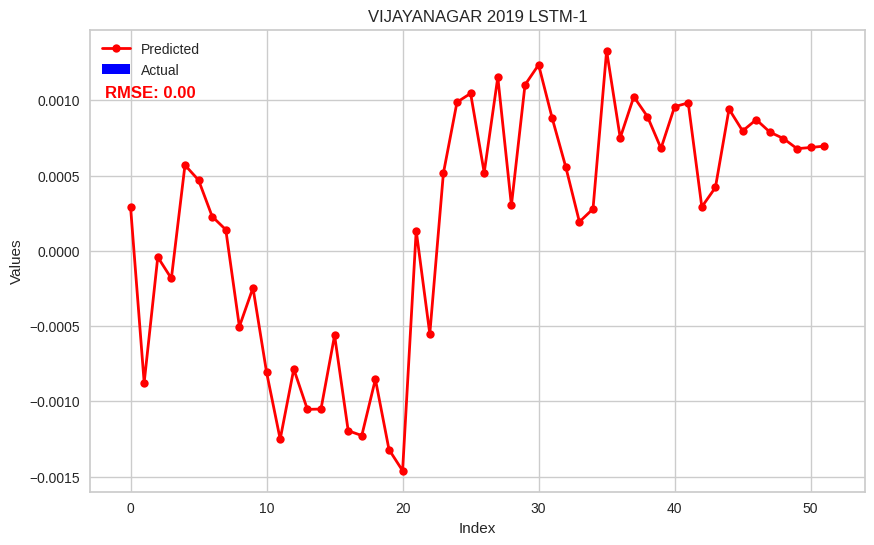

Analyzing District: VIJAYAPURA
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step


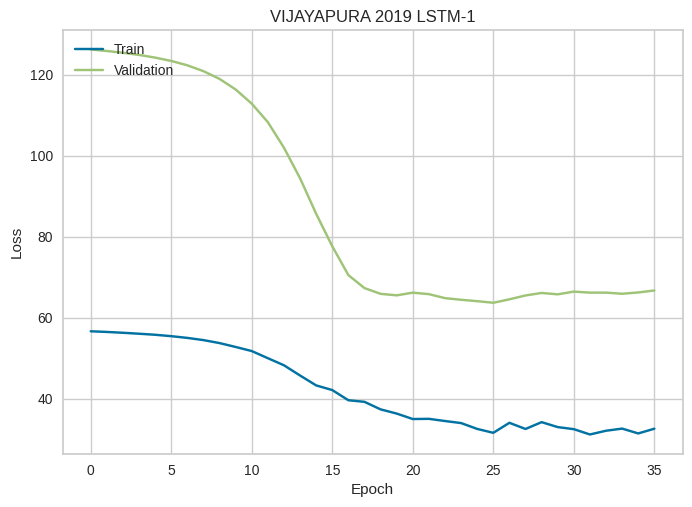

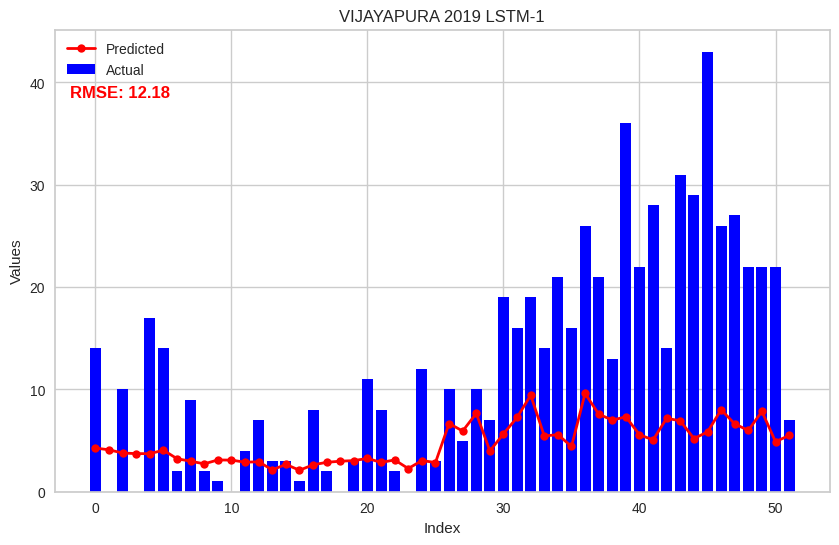

Analyzing District: YADGIR
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step


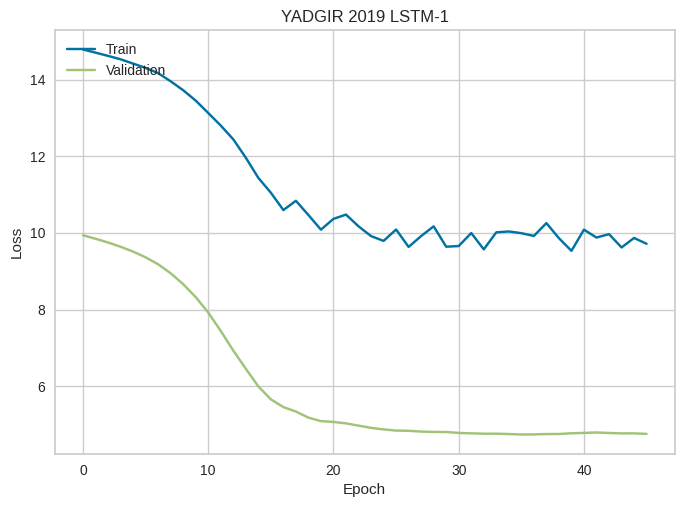

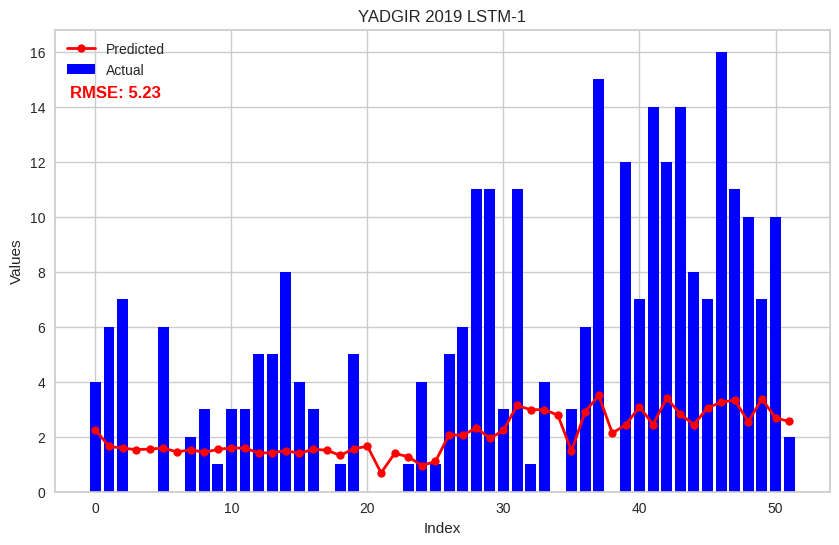

In [22]:
district_analysis = DistrictAnalysis("Karnataka_weather1980to2022.csv",2019,1)
df_2019 = district_analysis.analyze_districts()

Analyzing District: BAGALKOTE
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step


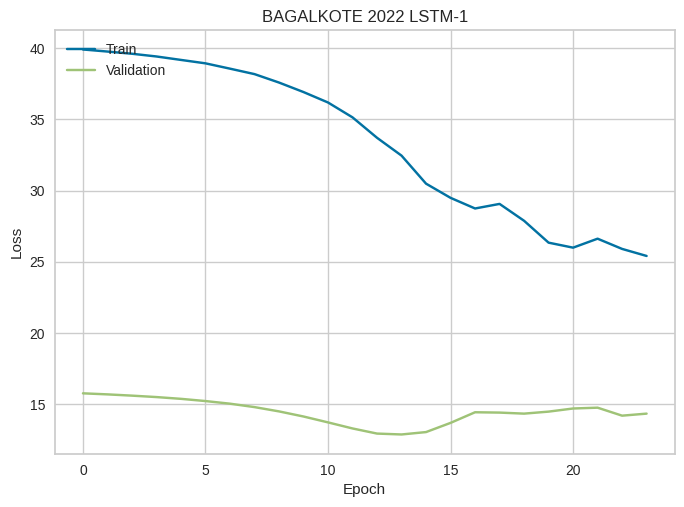

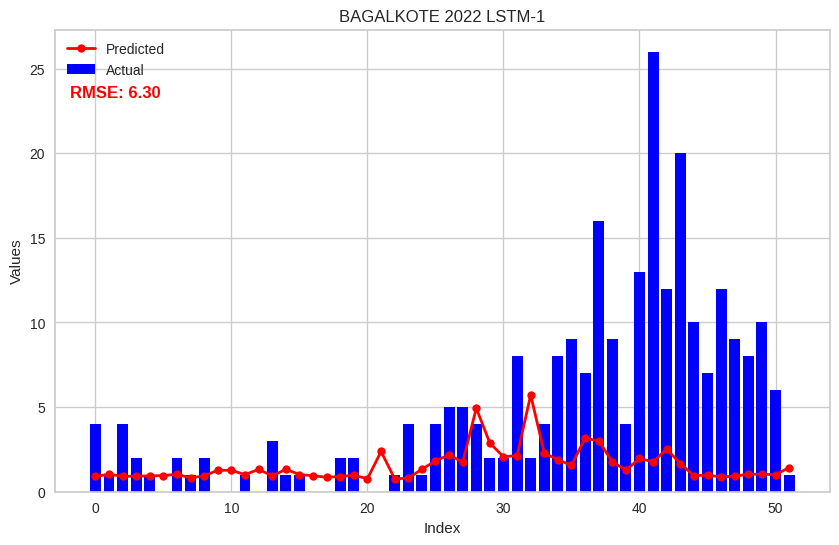

Analyzing District: BALLARI
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step


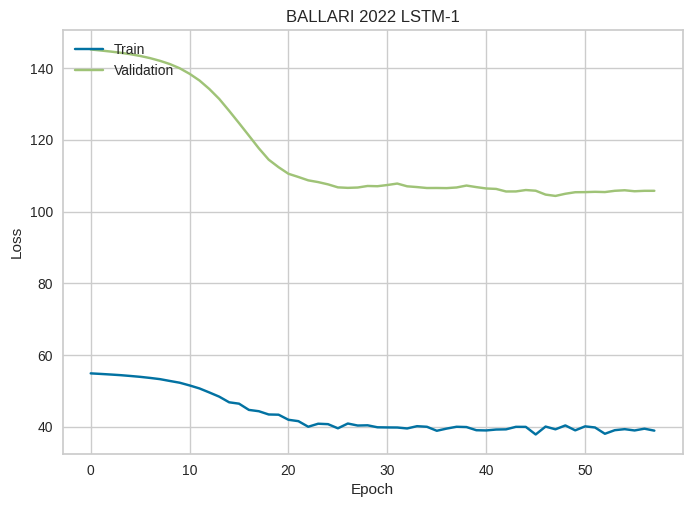

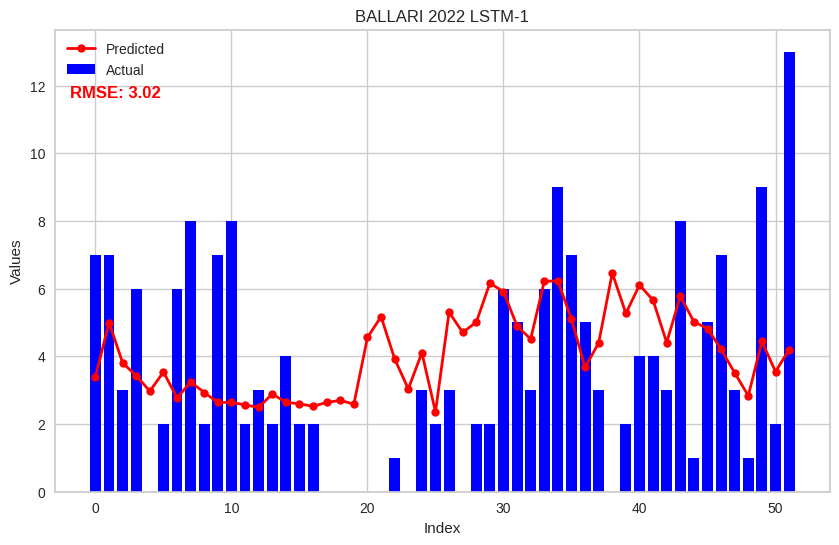

Analyzing District: BELAGAVI
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step


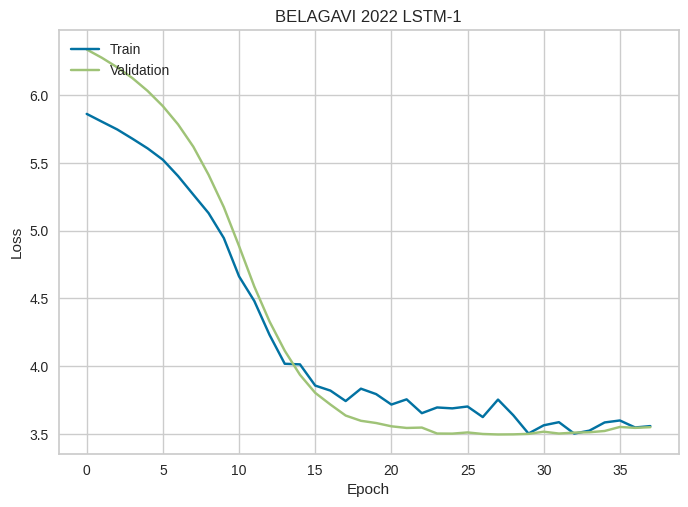

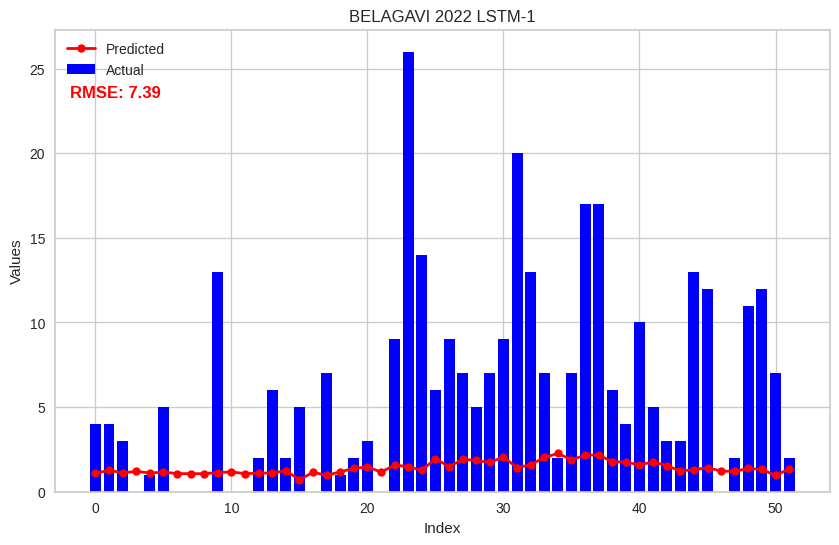

Analyzing District: BENGALURU RURAL
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


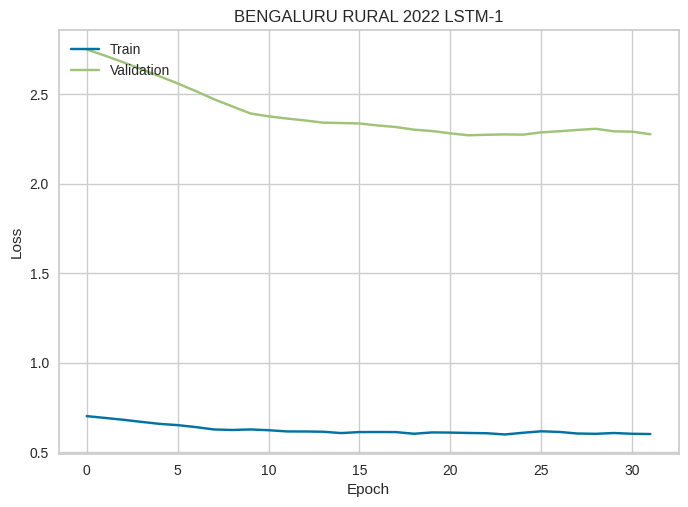

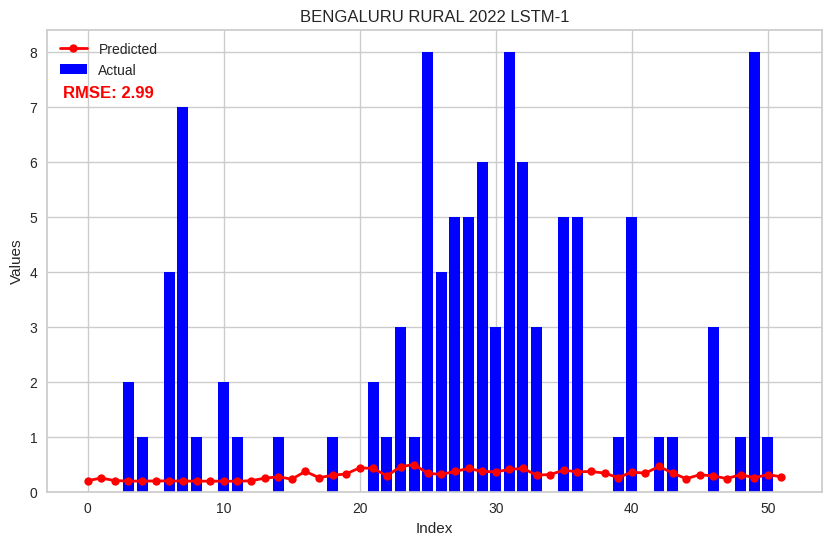

Analyzing District: BENGALURU URBAN
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


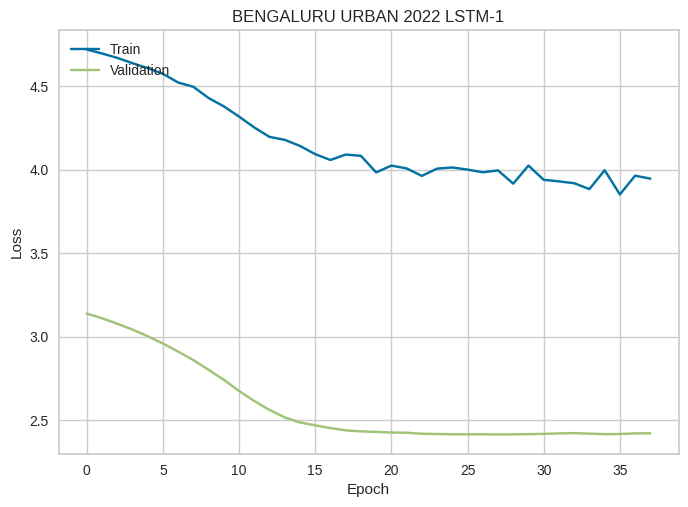

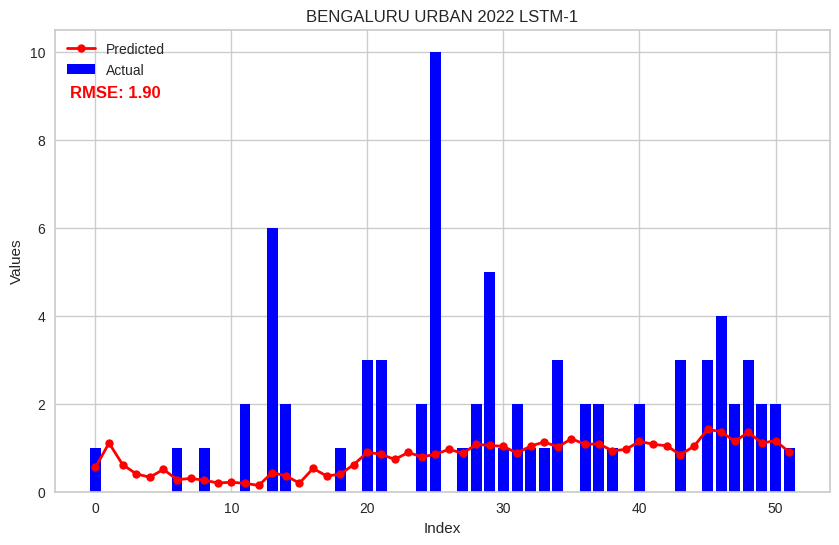

Analyzing District: BIDAR
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


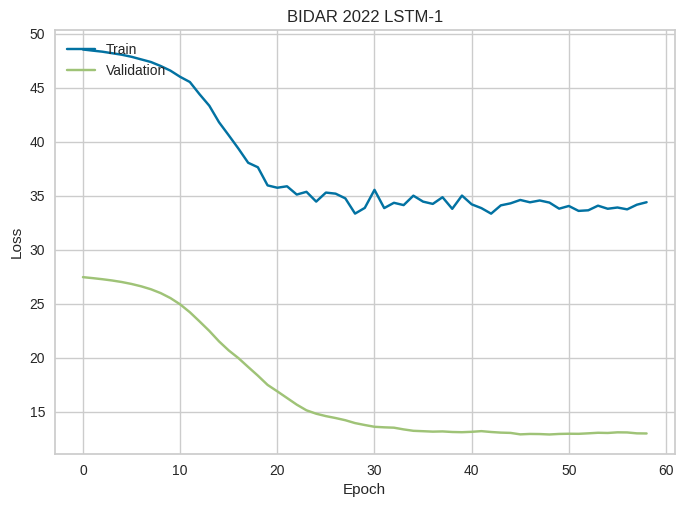

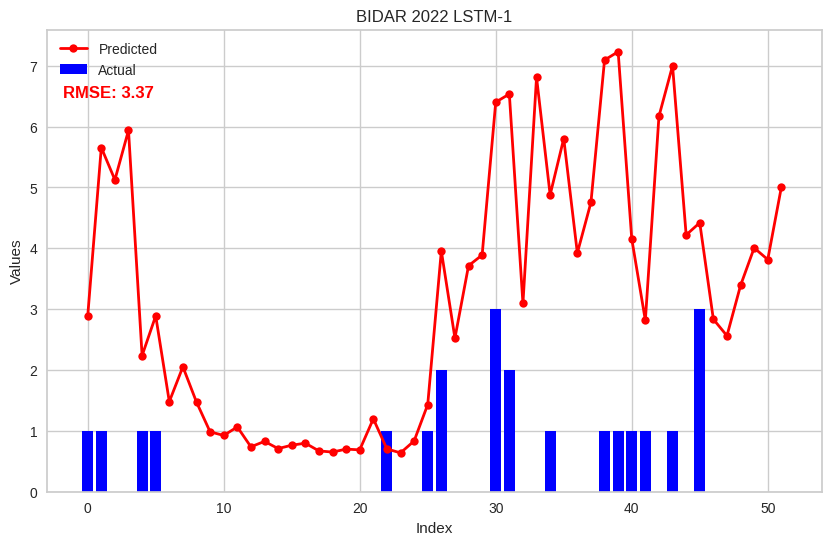

Analyzing District: CHAMARAJANAGARA
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


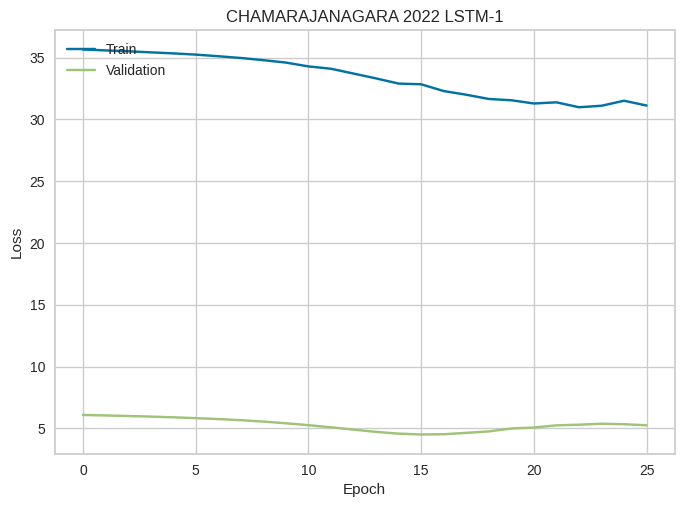

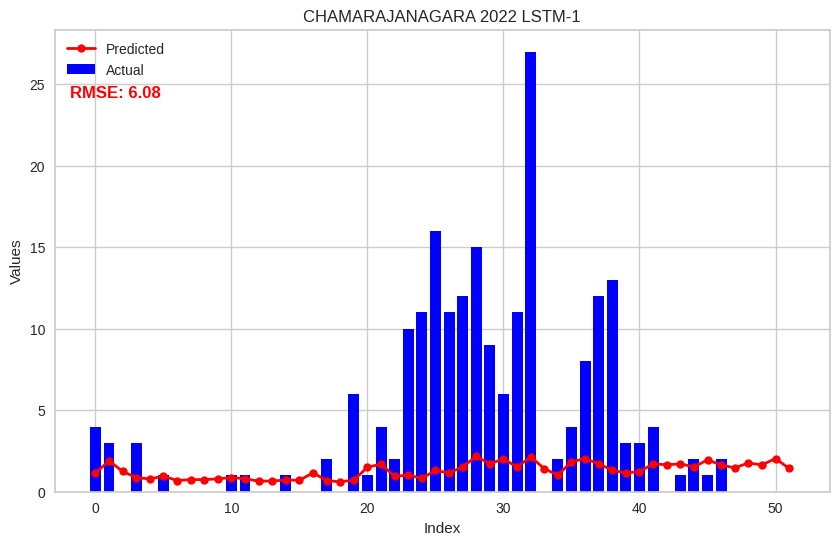

Analyzing District: CHIKKABALLAPURA
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


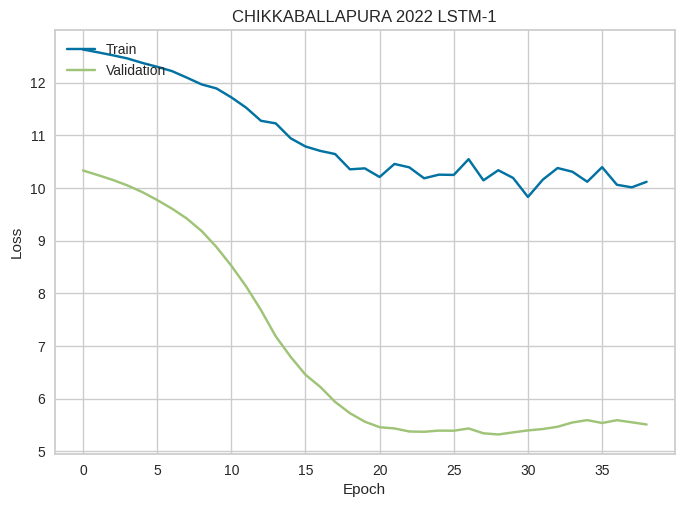

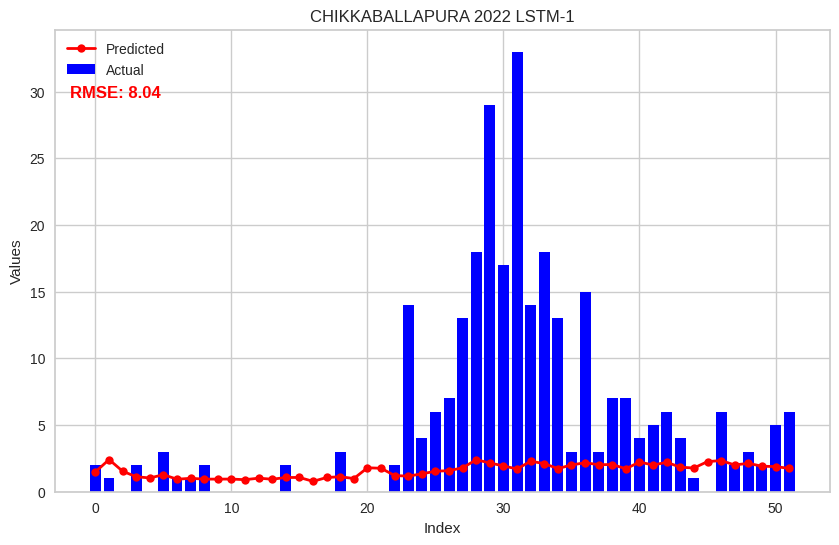

Analyzing District: CHIKKAMAGALURU
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


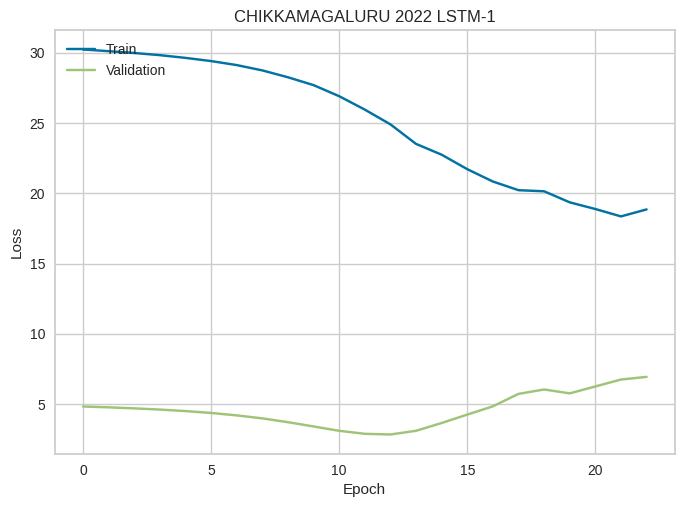

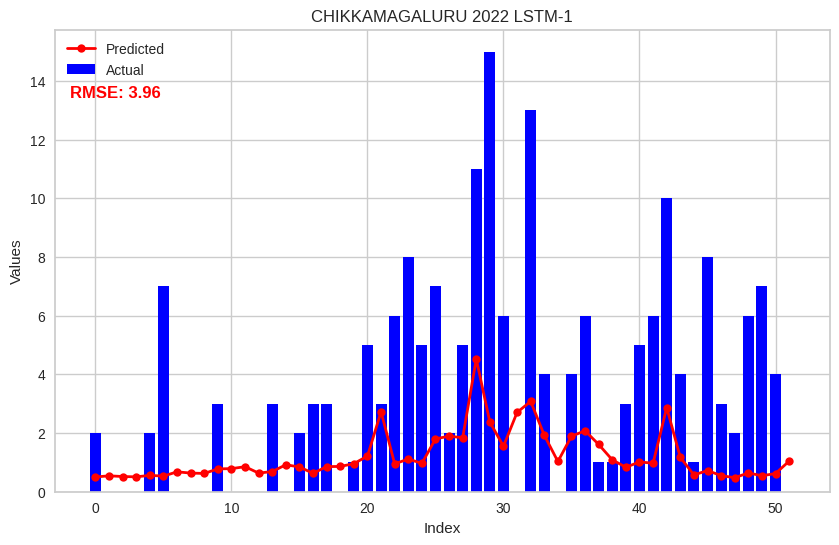

Analyzing District: CHITRADURGA
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step


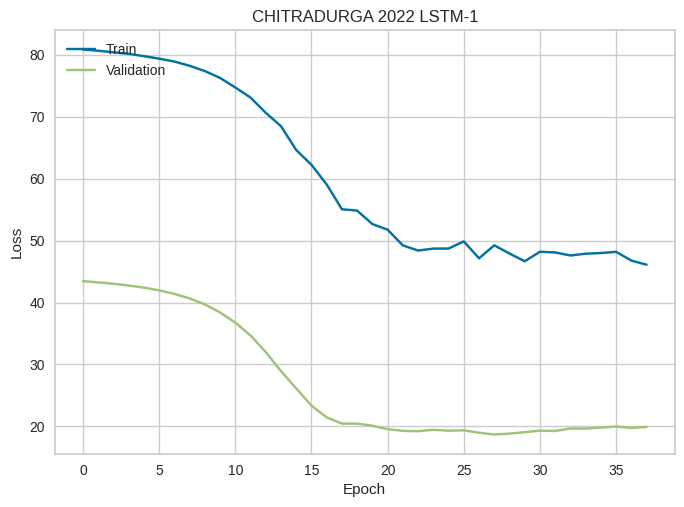

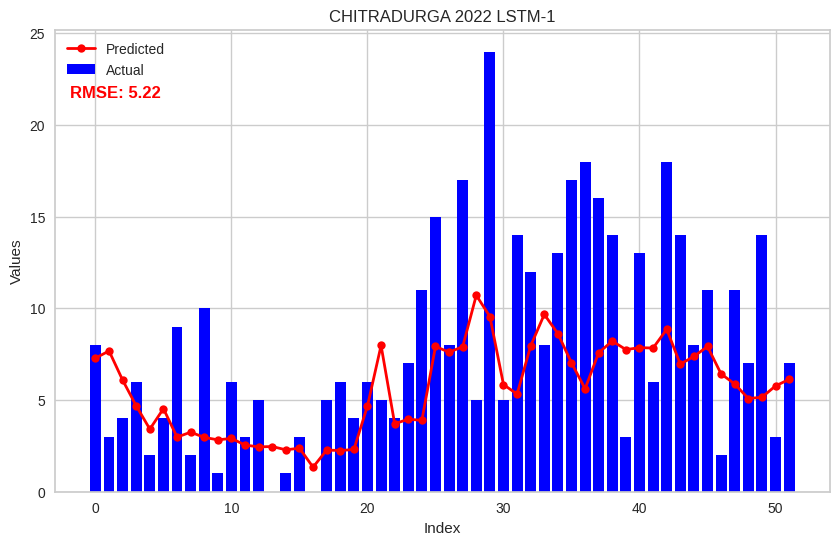

Analyzing District: DAKSHINA KANNADA
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step


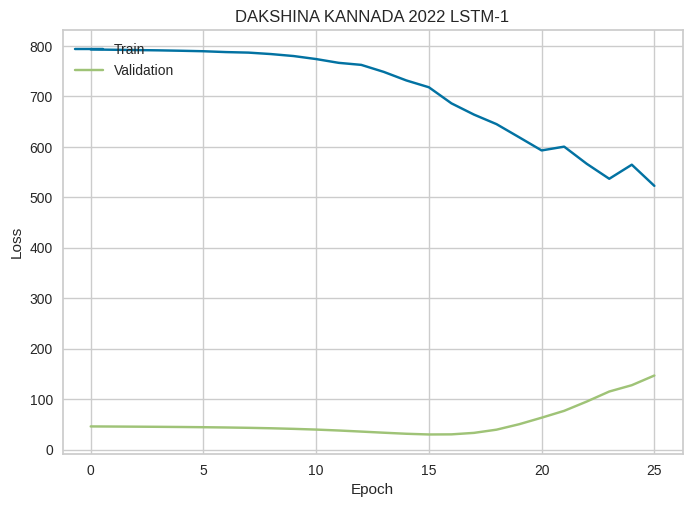

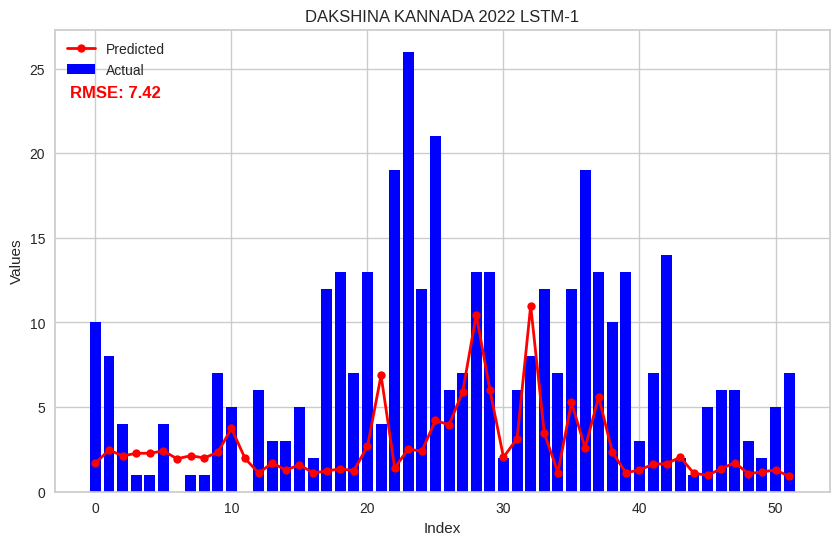

Analyzing District: DAVANGERE
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


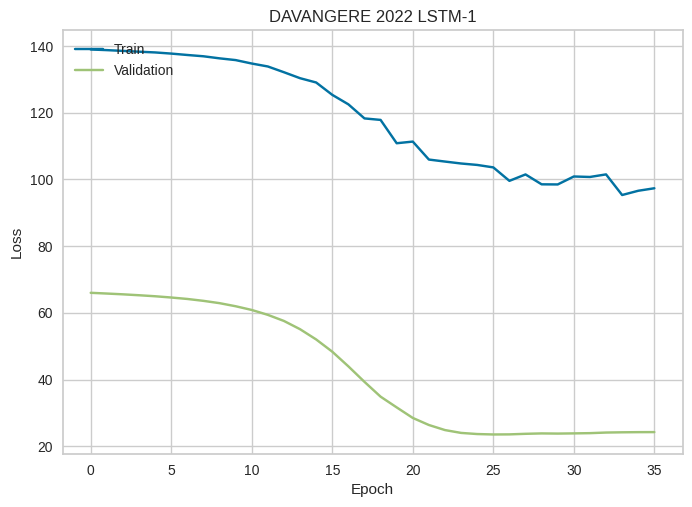

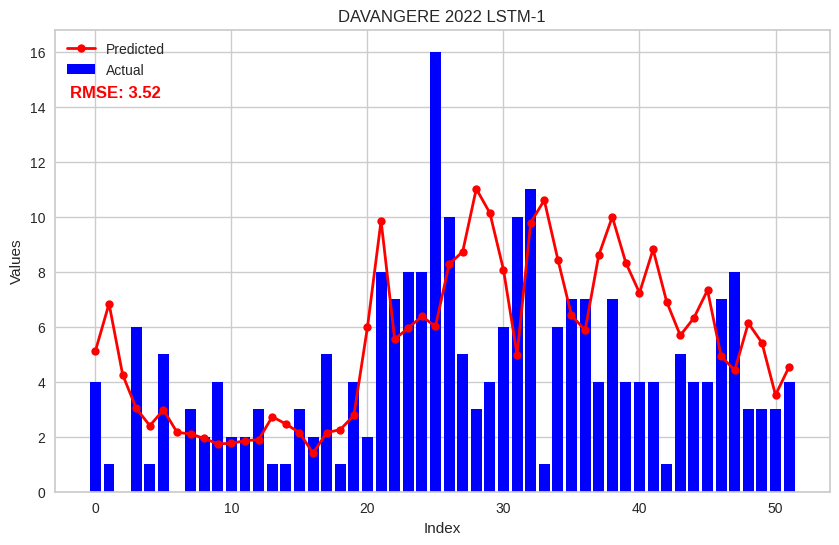

Analyzing District: DHARWAD
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


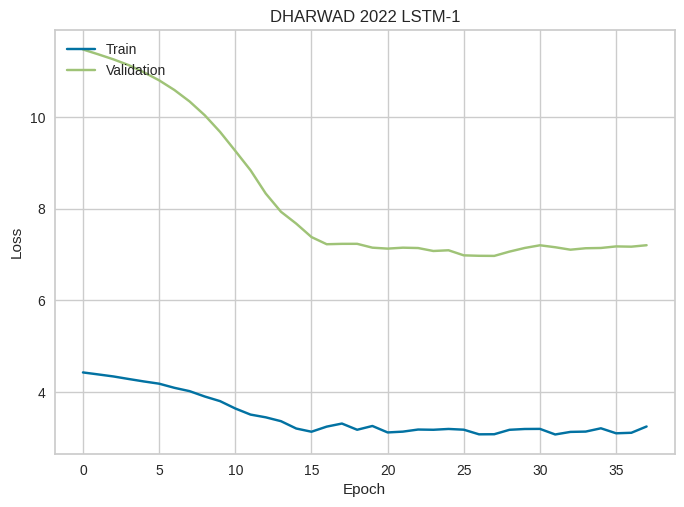

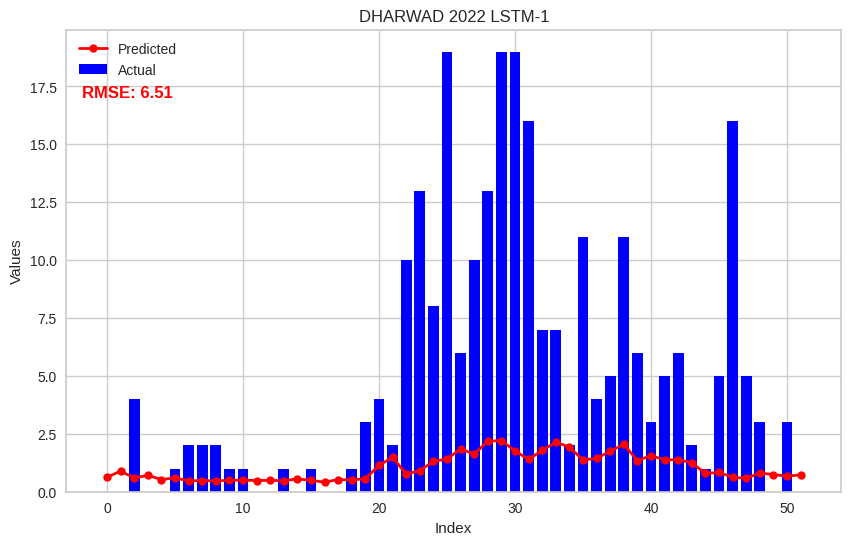

Analyzing District: GADAG
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step


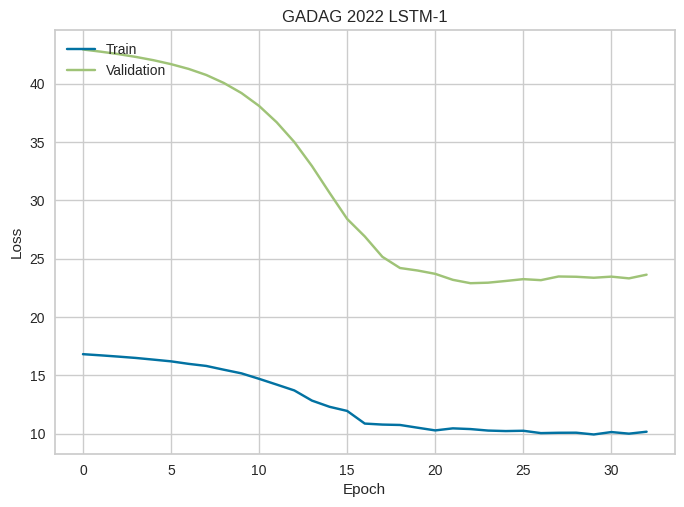

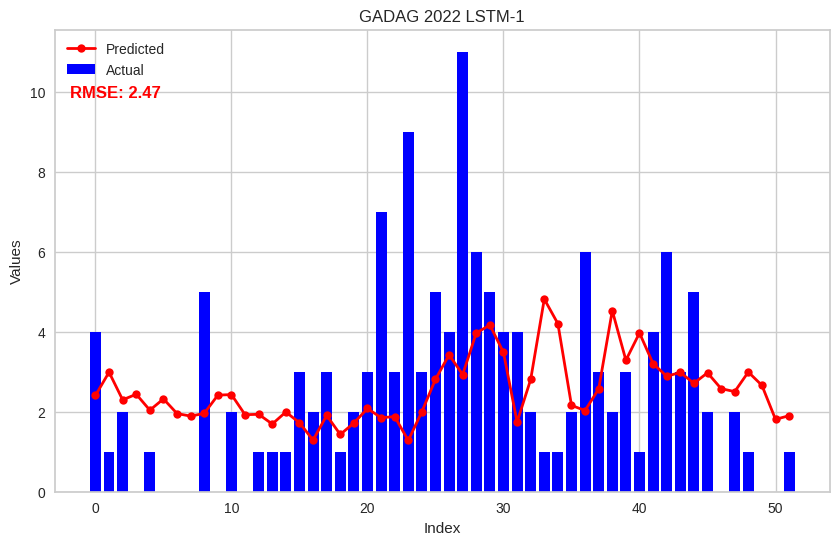

Analyzing District: HASSAN
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step


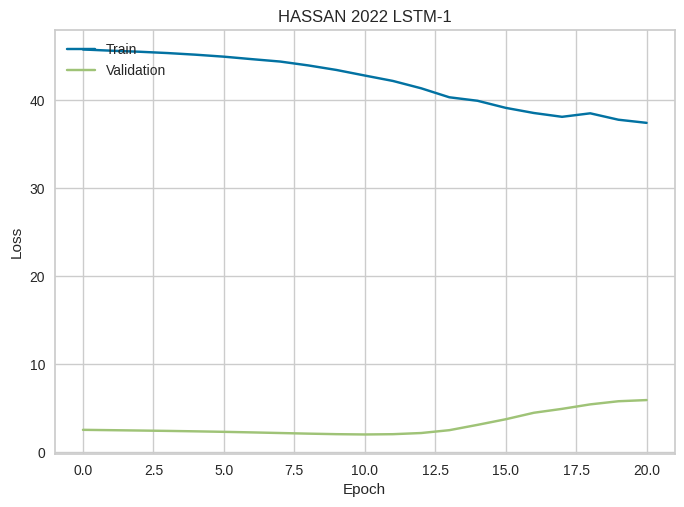

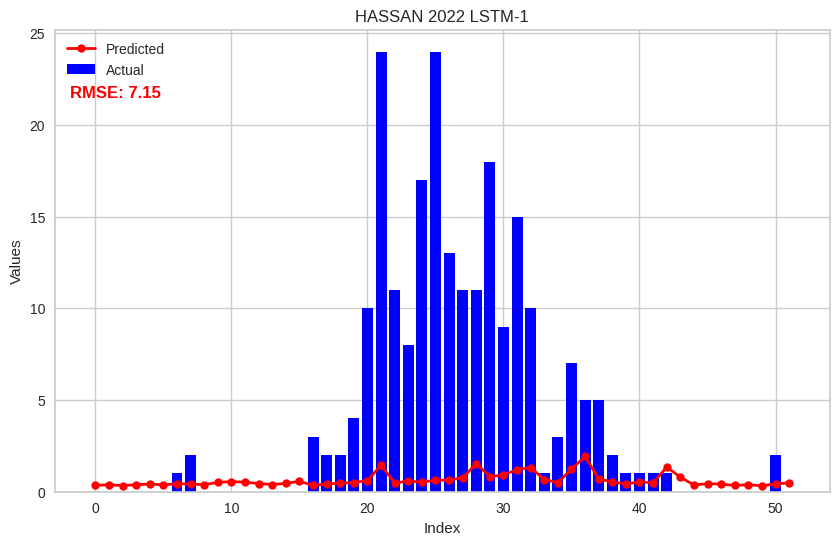

Analyzing District: HAVERI
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step


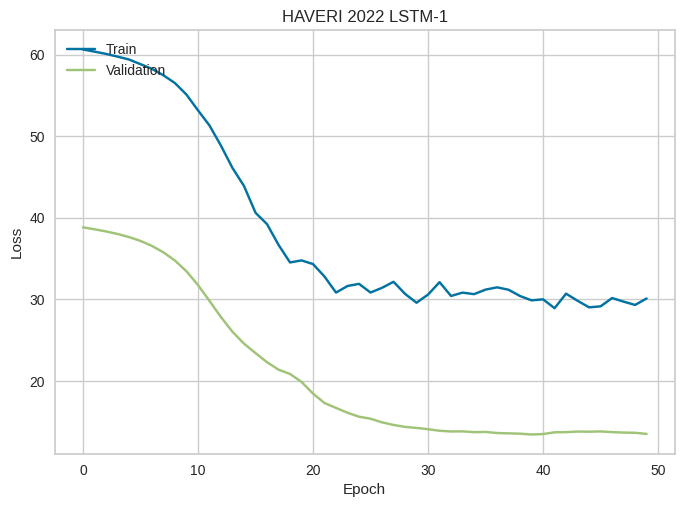

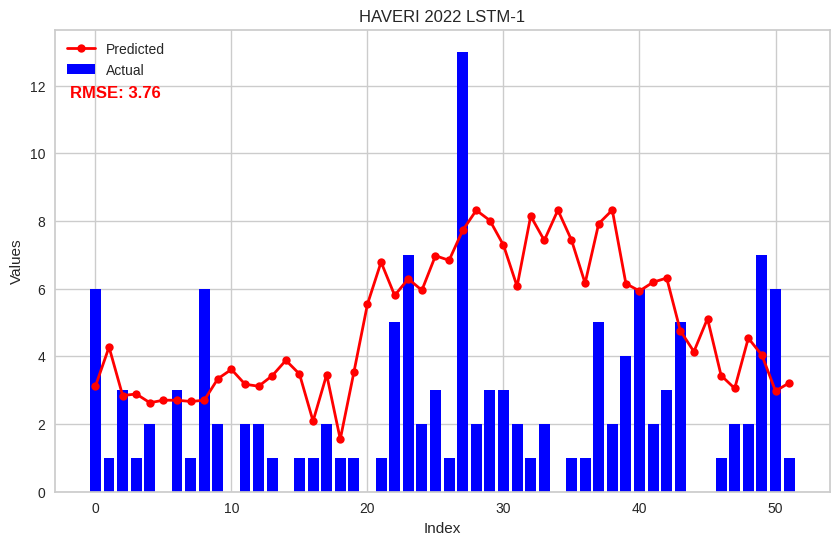

Analyzing District: KALABURAGI
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step


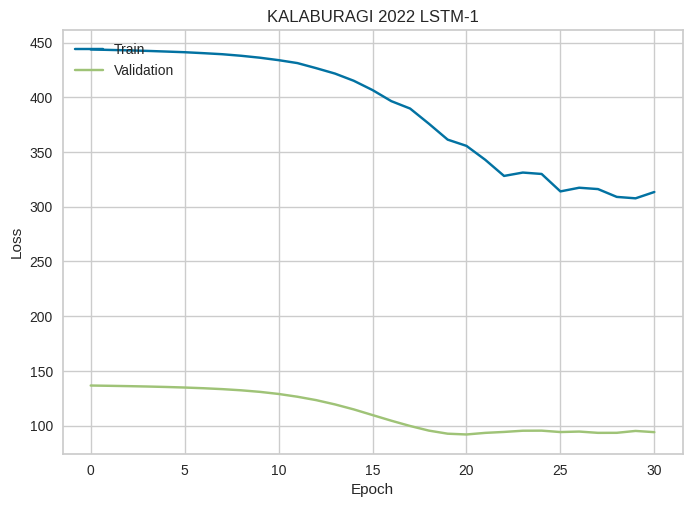

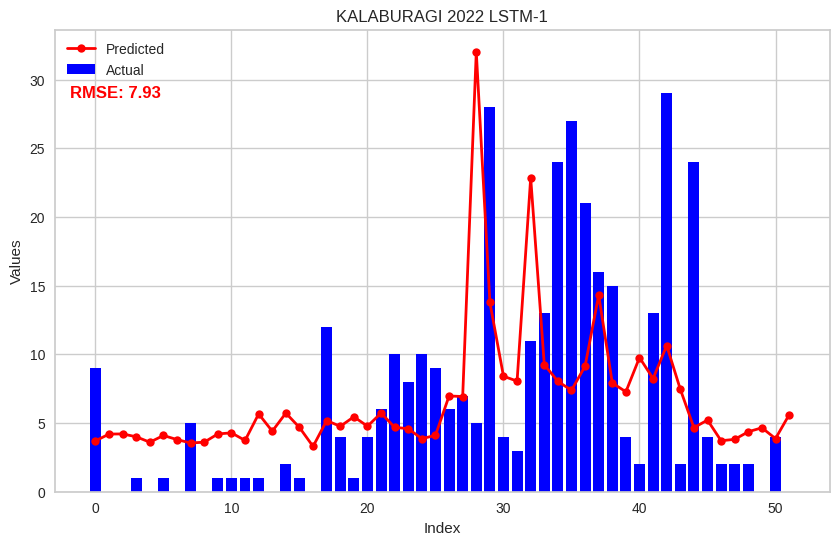

Analyzing District: KODAGU
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


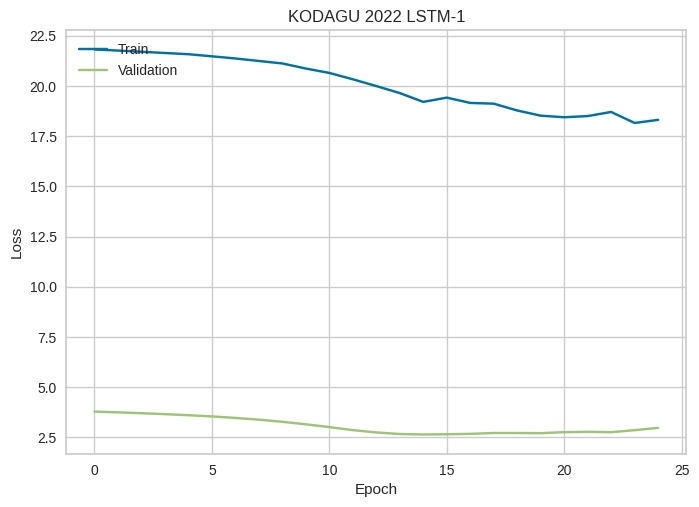

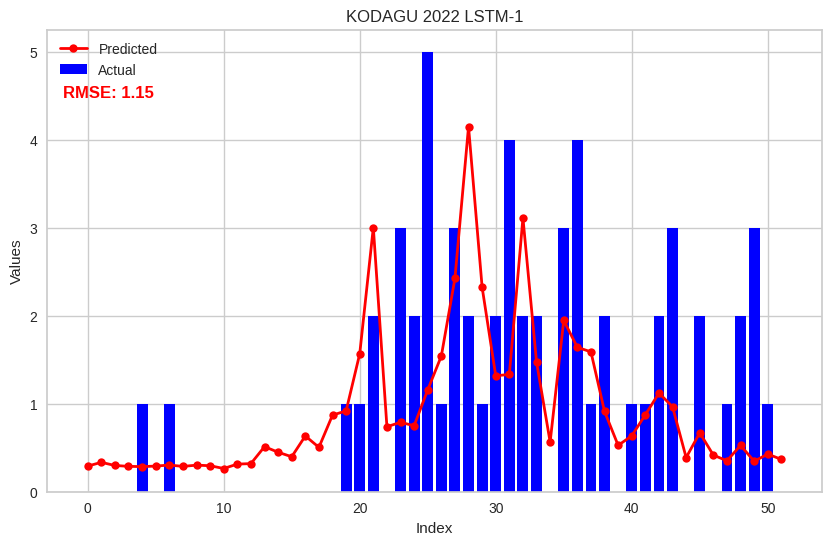

Analyzing District: KOLAR
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step


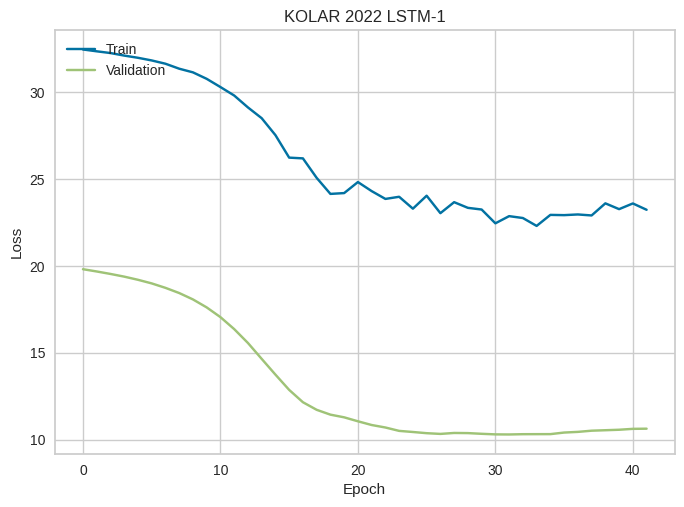

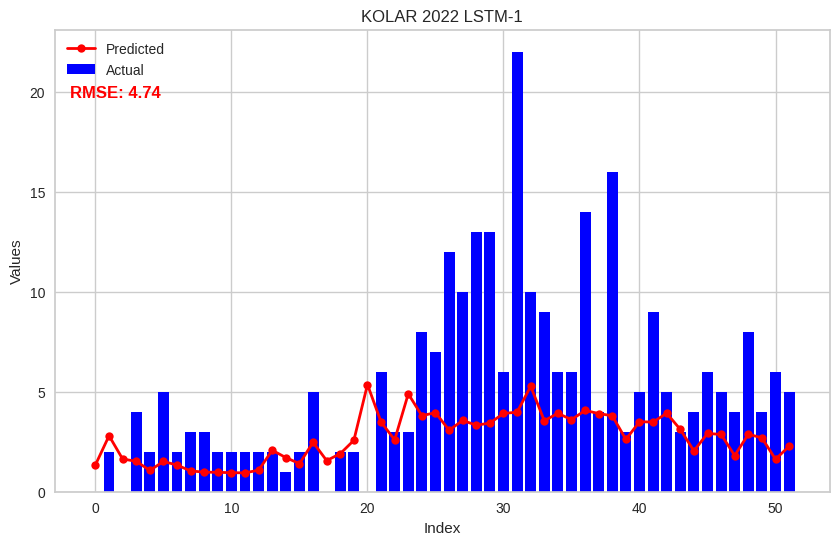

Analyzing District: KOPPAL
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step


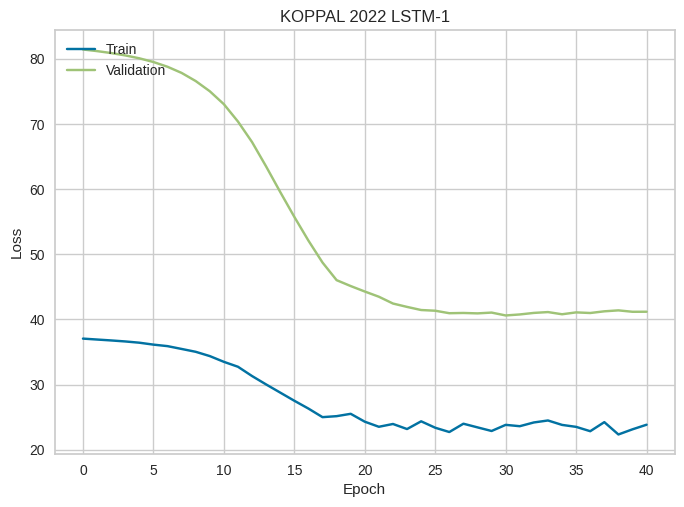

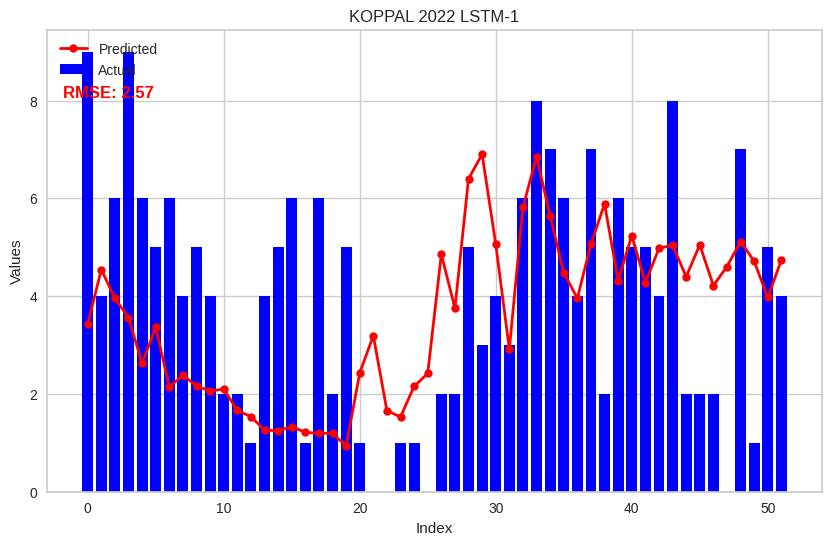

Analyzing District: MANDYA
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step


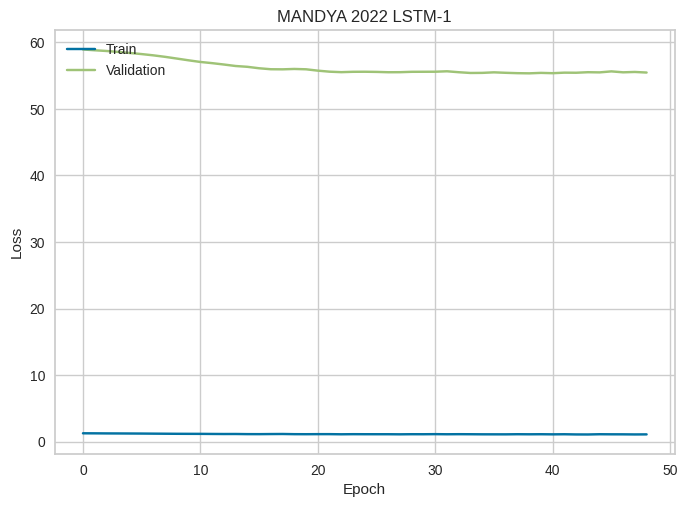

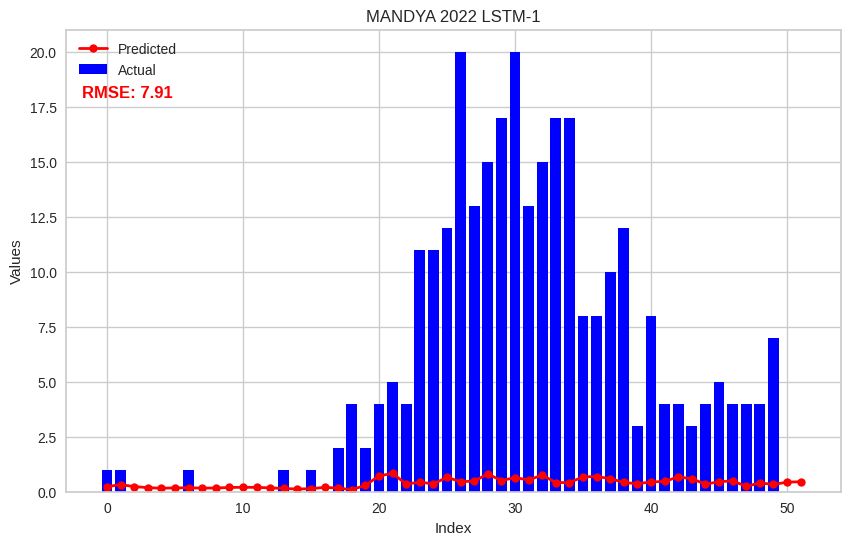

Analyzing District: MYSURU
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


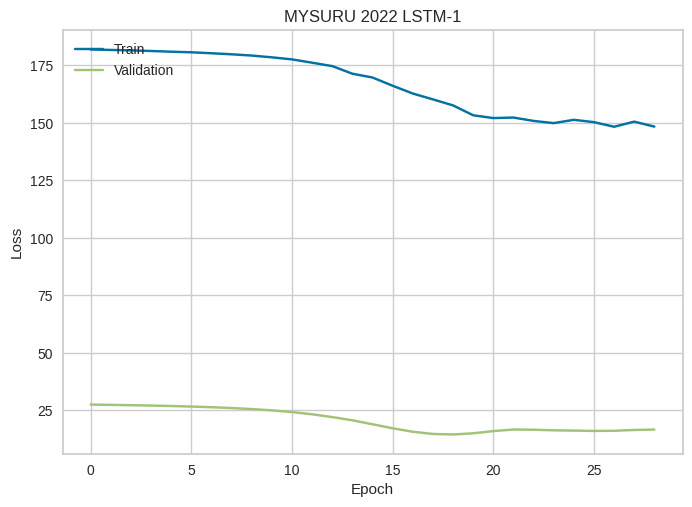

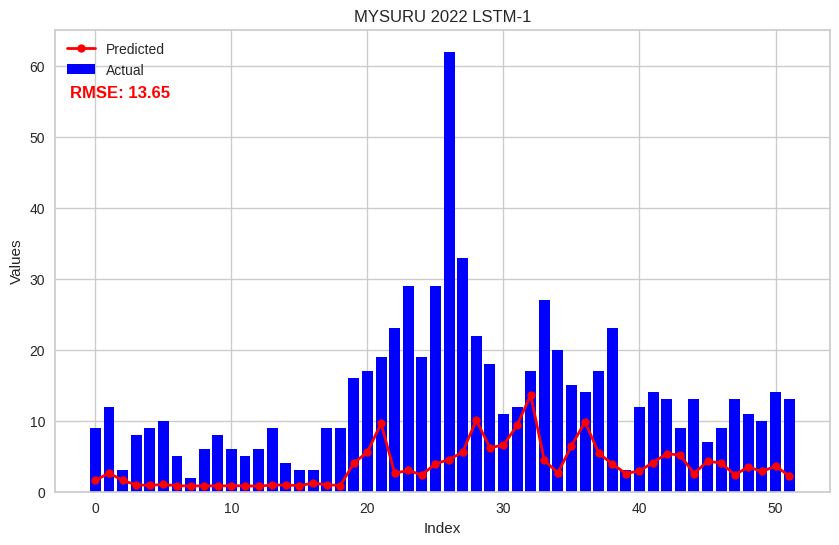

Analyzing District: RAICHUR
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step


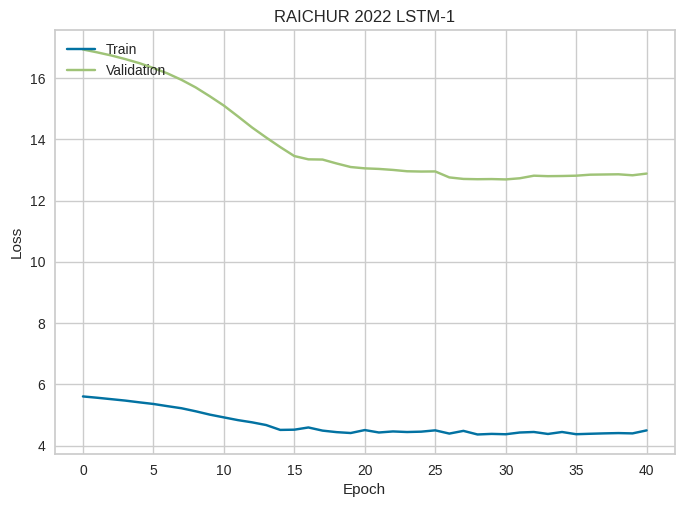

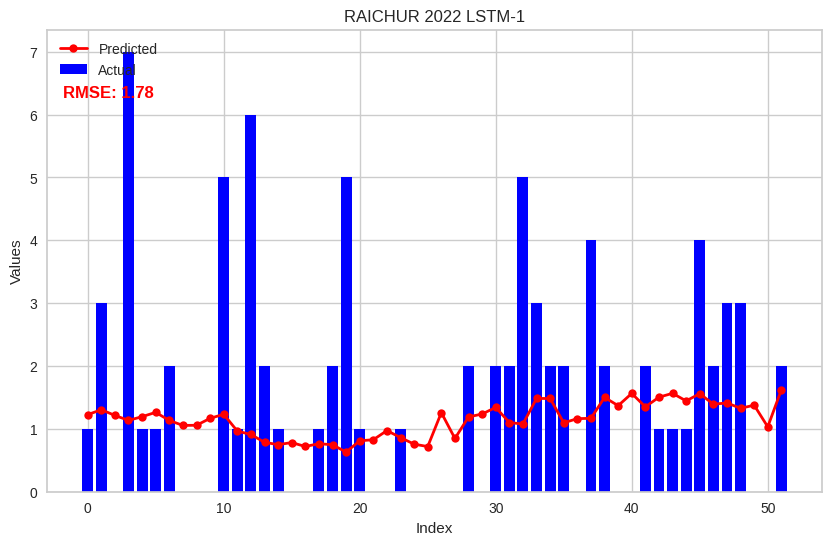

Analyzing District: RAMANAGARA
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step


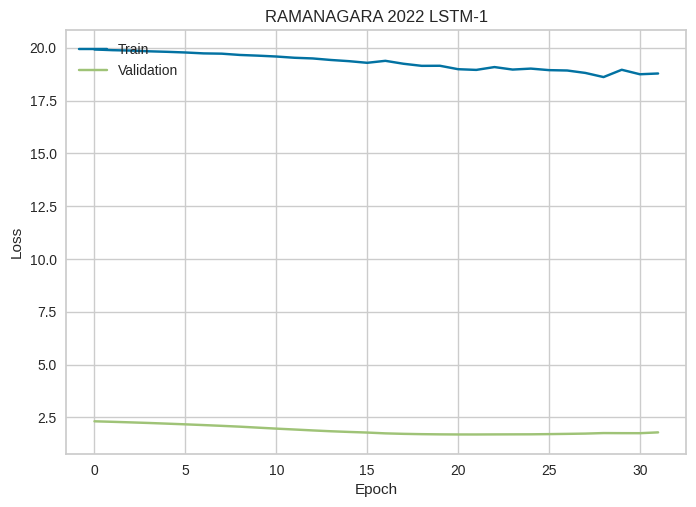

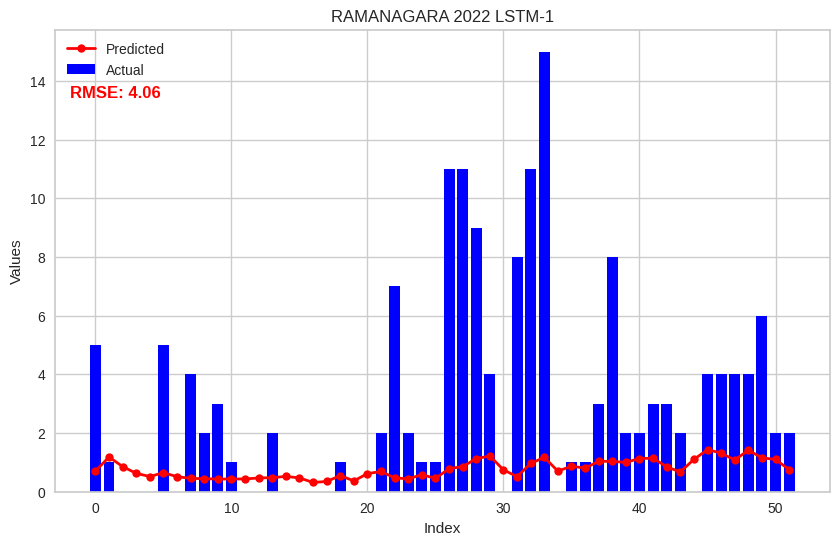

Analyzing District: SHIVAMOGGA
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step


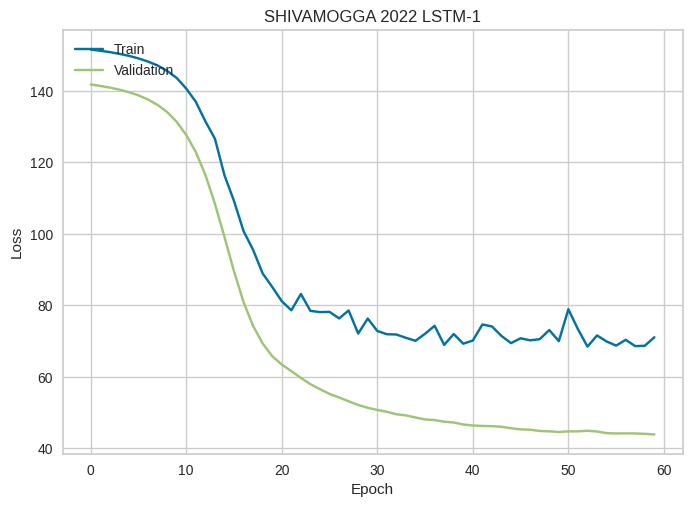

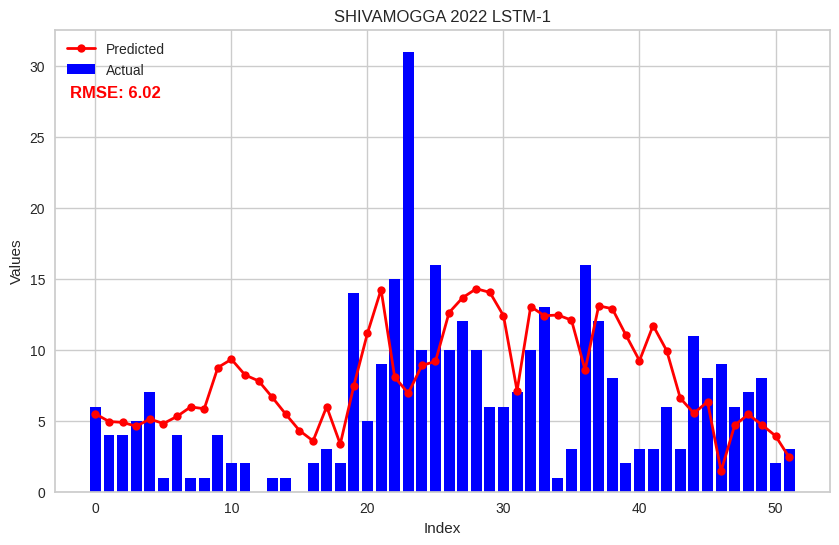

Analyzing District: TUMAKURU
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step


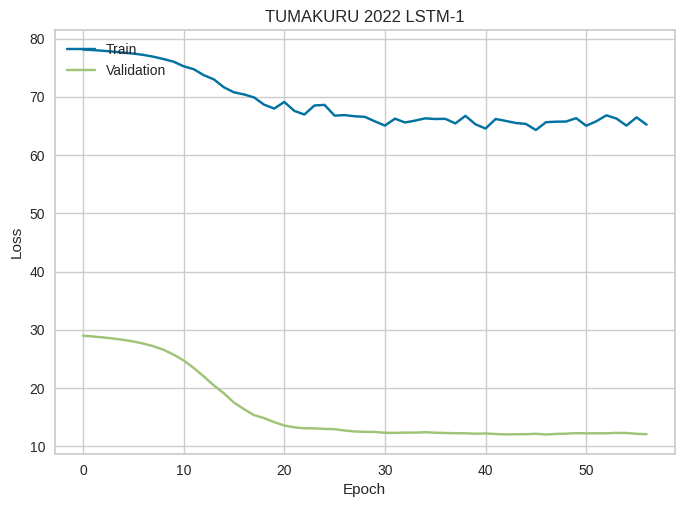

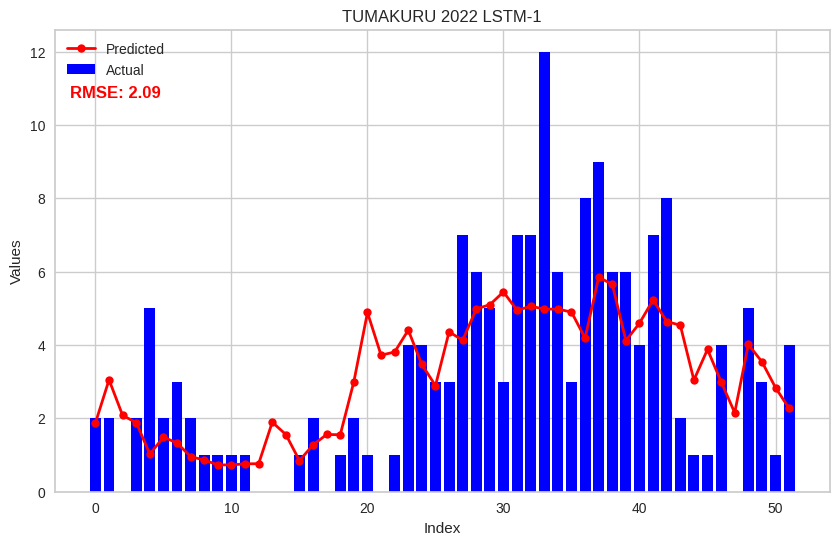

Analyzing District: UDUPI
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step


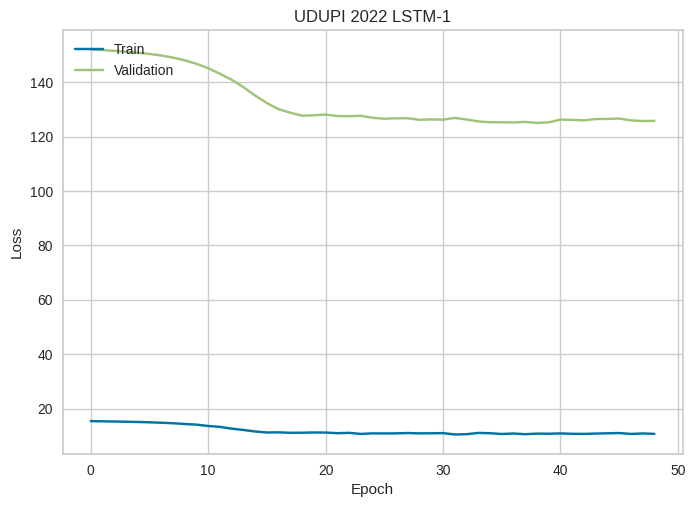

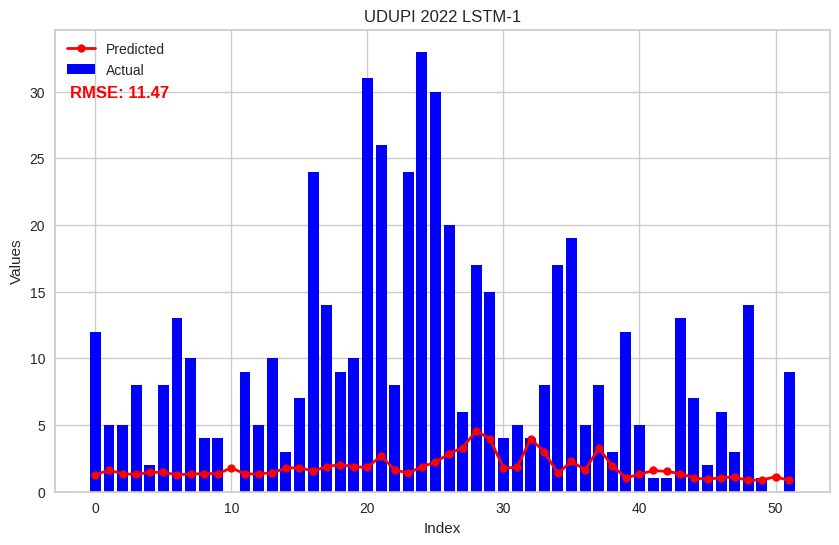

Analyzing District: UTTARA KANNADA
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


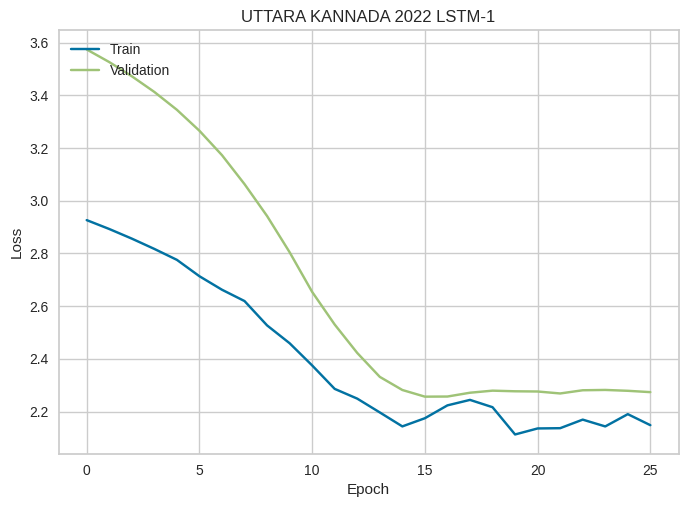

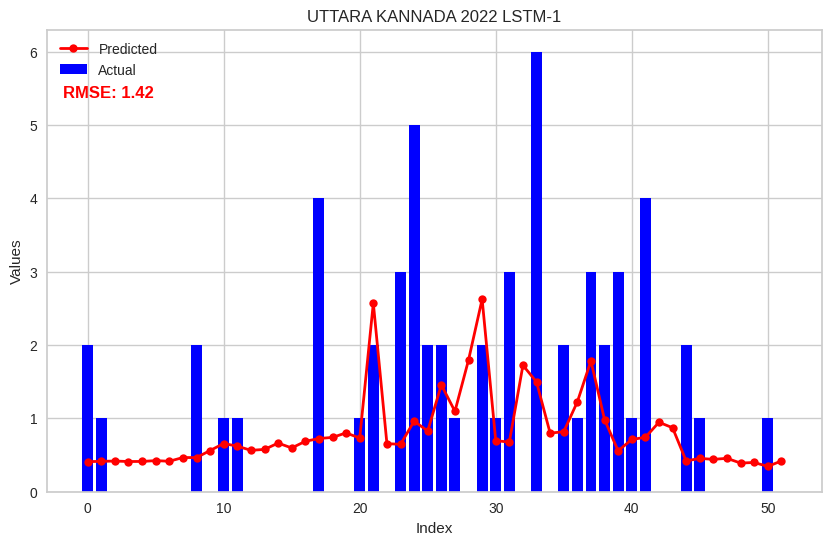

Analyzing District: VIJAYANAGAR
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step


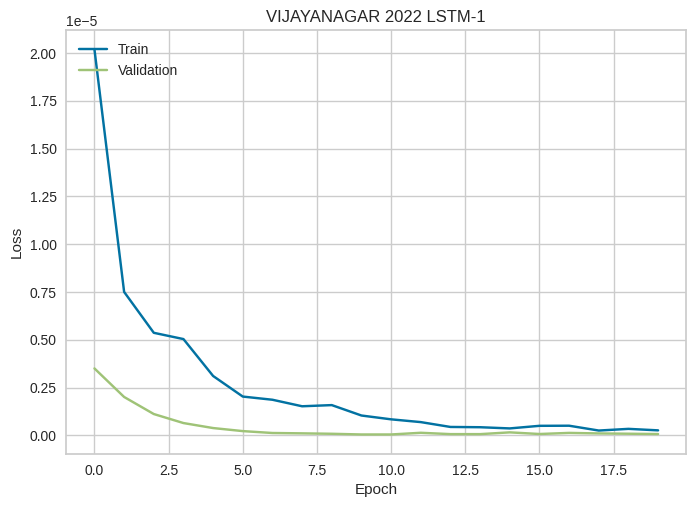

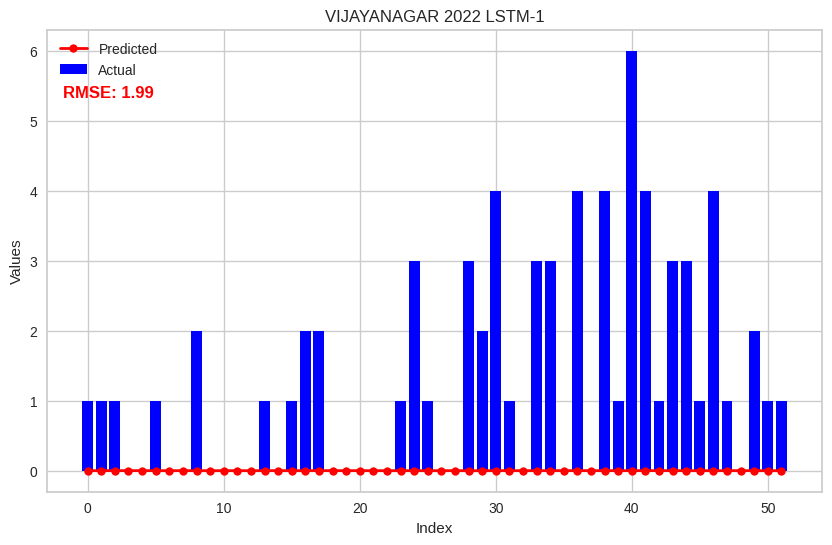

Analyzing District: VIJAYAPURA
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step


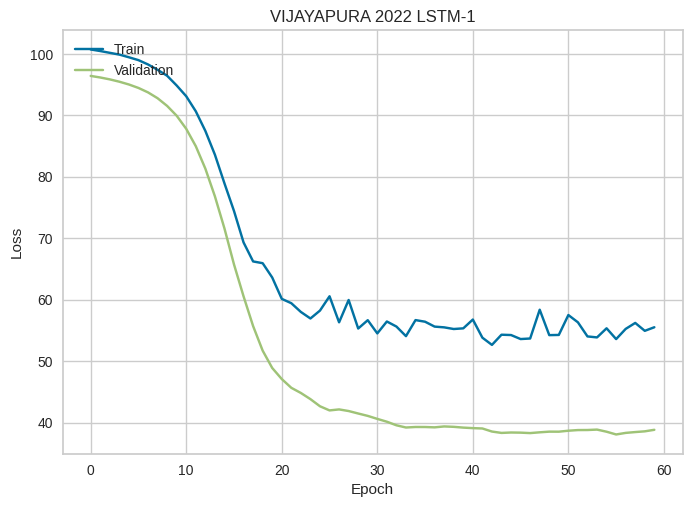

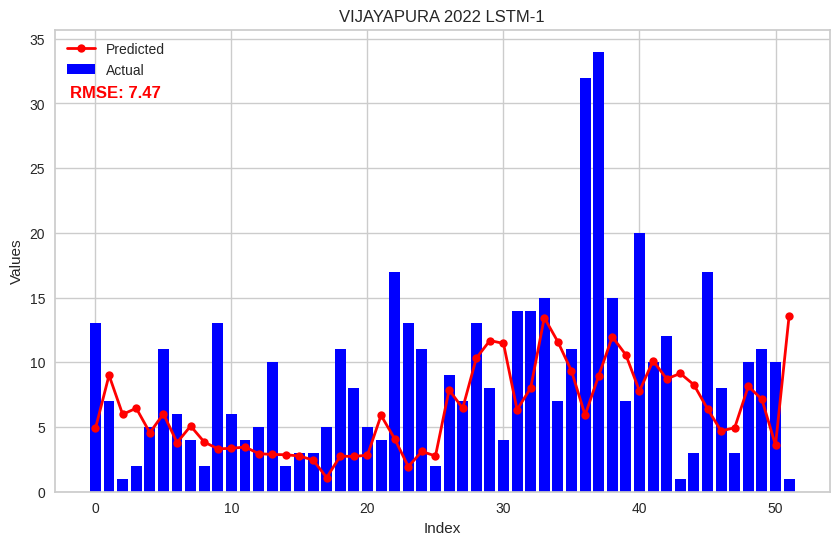

Analyzing District: YADGIR
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step


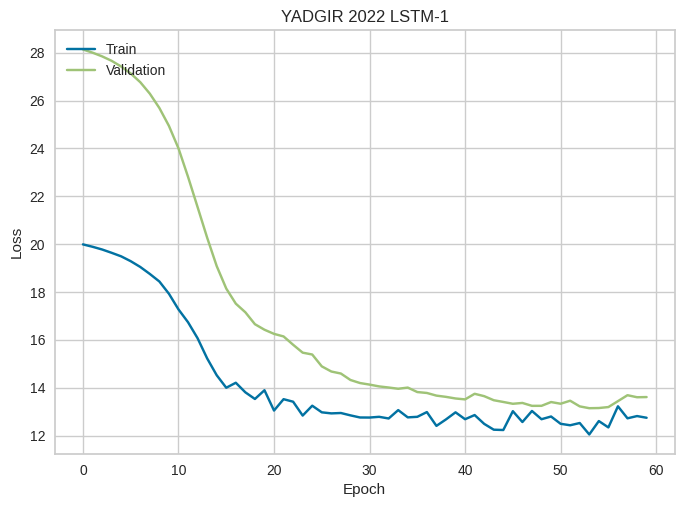

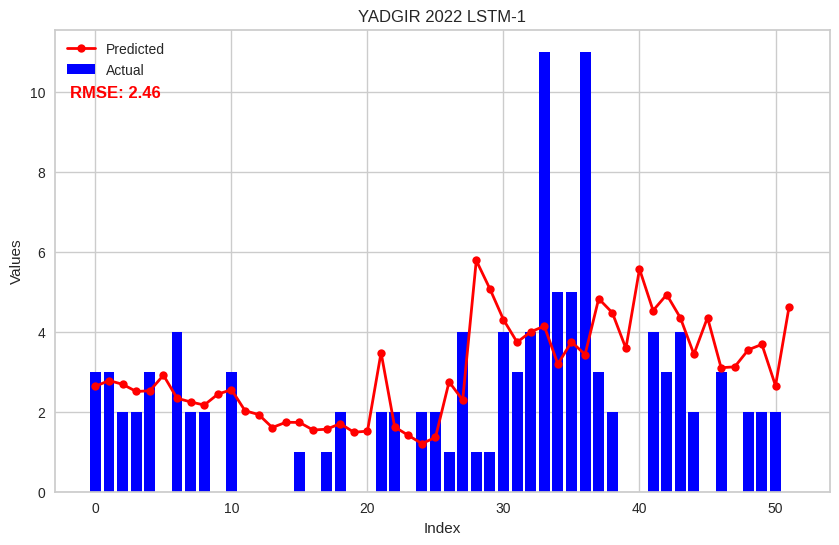

In [23]:
district_analysis = DistrictAnalysis("Karnataka_weather1980to2022.csv",2022,1)
df_2022 = district_analysis.analyze_districts()

In [24]:
from functools import reduce

# List of DataFrames to merge
dfs = [df_2017, df_2018, df_2019, df_2022]

# Function to merge two DataFrames on 'district' with suffixes
def merge_dfs(left, right):
    return pd.merge(left, right, on='district', suffixes=('', f"_{right.columns[-1][-4:]}"))

# Use reduce to iteratively merge all DataFrames
merged_df = reduce(merge_dfs, dfs)

merged_df

,district,2017_1_rmse,2017_1performance,2018_1_rmse,2018_1performance,2019_1_rmse,2019_1performance,2022_1_rmse,2022_1performance
0,BAGALKOTE,6.379326,Bad,3.271441,Bad,7.446512,Bad,6.296842,Bad
1,BALLARI,10.457665,Bad,3.341514,Bad,4.165433,Bad,3.020948,Bad
2,BELAGAVI,1.499779,Good,1.411366,Good,2.364228,Bad,7.391808,Bad
3,BENGALURU RURAL,0.542493,Good,0.545838,Good,1.306678,Good,2.990370,Bad
4,BENGALURU URBAN,1.088325,Good,1.079731,Good,3.957596,Bad,1.896423,Good
5,BIDAR,6.131005,Bad,3.779839,Bad,11.353162,Bad,3.367614,Bad
6,CHAMARAJANAGARA,2.277694,Bad,2.127236,Bad,11.088814,Bad,6.079864,Bad
7,CHIKKABALLAPURA,1.966751,Good,1.903071,Good,6.283514,Bad,8.040136,Bad
8,CHIKKAMAGALURU,6.905863,Bad,2.206769,Bad,5.145134,Bad,3.960436,Bad
9,CHITRADURGA,9.588012,Bad,4.902925,Bad,7.647581,Bad,5.224749,Bad


In [25]:
merged_df = merged_df.round(2)
merged_df

,district,2017_1_rmse,2017_1performance,2018_1_rmse,2018_1performance,2019_1_rmse,2019_1performance,2022_1_rmse,2022_1performance
0,BAGALKOTE,6.38,Bad,3.27,Bad,7.45,Bad,6.30,Bad
1,BALLARI,10.46,Bad,3.34,Bad,4.17,Bad,3.02,Bad
2,BELAGAVI,1.50,Good,1.41,Good,2.36,Bad,7.39,Bad
3,BENGALURU RURAL,0.54,Good,0.55,Good,1.31,Good,2.99,Bad
4,BENGALURU URBAN,1.09,Good,1.08,Good,3.96,Bad,1.90,Good
5,BIDAR,6.13,Bad,3.78,Bad,11.35,Bad,3.37,Bad
6,CHAMARAJANAGARA,2.28,Bad,2.13,Bad,11.09,Bad,6.08,Bad
7,CHIKKABALLAPURA,1.97,Good,1.90,Good,6.28,Bad,8.04,Bad
8,CHIKKAMAGALURU,6.91,Bad,2.21,Bad,5.15,Bad,3.96,Bad
9,CHITRADURGA,9.59,Bad,4.90,Bad,7.65,Bad,5.22,Bad


In [26]:
merged_df.to_csv('LSTM-1_performance.csv', index=False)

In [27]:
df = pd.read_csv("LSTM-1_performance.csv")
df

,district,2017_1_rmse,2017_1performance,2018_1_rmse,2018_1performance,2019_1_rmse,2019_1performance,2022_1_rmse,2022_1performance
0,BAGALKOTE,6.38,Bad,3.27,Bad,7.45,Bad,6.30,Bad
1,BALLARI,10.46,Bad,3.34,Bad,4.17,Bad,3.02,Bad
2,BELAGAVI,1.50,Good,1.41,Good,2.36,Bad,7.39,Bad
3,BENGALURU RURAL,0.54,Good,0.55,Good,1.31,Good,2.99,Bad
4,BENGALURU URBAN,1.09,Good,1.08,Good,3.96,Bad,1.90,Good
5,BIDAR,6.13,Bad,3.78,Bad,11.35,Bad,3.37,Bad
6,CHAMARAJANAGARA,2.28,Bad,2.13,Bad,11.09,Bad,6.08,Bad
7,CHIKKABALLAPURA,1.97,Good,1.90,Good,6.28,Bad,8.04,Bad
8,CHIKKAMAGALURU,6.91,Bad,2.21,Bad,5.15,Bad,3.96,Bad
9,CHITRADURGA,9.59,Bad,4.90,Bad,7.65,Bad,5.22,Bad


# Fine_Tuning

In [2]:
def build_model(hp):
    model = Sequential()
    model.add(LSTM(units=hp.Int('input_unit', min_value=20, max_value=80, step=10),
                   return_sequences=True, input_shape=(x_train_lstm.shape[1], x_train_lstm.shape[2])))
    for i in range(hp.Int('n_layers', 1, 3)):
        model.add(LSTM(units=hp.Int(f'lstm_{i}_units', min_value=10, max_value=40, step=10),
                       return_sequences=True))
    model.add(LSTM(units=hp.Int('layer_2_neurons', min_value=10, max_value=40, step=10)))
    model.add(Dropout(hp.Float('Dropout_rate', min_value=0, max_value=0.5, step=0.1)))
    model.add(Dense(1, activation="linear"))
    model.compile(loss='mean_squared_error', optimizer='adam', metrics=['mse'])
    return model


tuner = keras_tuner.RandomSearch(
    build_model,
    objective='mse',
    max_trials=5,
    executions_per_trial=5,
#       directory='my_dir',
#       project_name='lstm_hyperparameters'
)

tuner.search(
    x=x_train_lstm,
    y=y_train_lstm,
    epochs=20,
    batch_size=14,
    validation_data=(x_test_lstm, y_test_lstm)
)


best_model = tuner.get_best_models(num_models=1)[0]



2024-05-15 11:23:30.204606: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-05-15 11:23:30.205004: W tensorflow/core/common_runtime/gpu/gpu_device.cc:2251] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...


Reloading Tuner from ./untitled_project/tuner0.json


NameError: name 'x_train_lstm' is not defined

In [22]:


class DistrictAnalysis:
    def __init__(self, csv_file,year,n_steps):
        self.df_main = pd.read_csv(csv_file)
        self.year = year
        self.n_steps  = n_steps
        self.plot_folder = "/home/ravi/myfolder/project/artpark/dengue data/plots"
        os.makedirs(self.plot_folder, exist_ok=True)

    def pop_mean(self):
        self.df_main = self.df_main[~self.df_main['Record_Year'].isin([2020,2021,2023])]
        self.df_main['Case_Count'] = self.df_main['Case_Count'] / (self.df_main['Population'] / 1000000)
        return self.df_main

    def process_district_data(self, district_name):
        df_c = self.df_main.loc[self.df_main['District'] == district_name]
        df_c = df_c.dropna().reset_index(drop=True)
        return df_c

    def split_train_test_LSTM(self,df):
        train_data = df[~(df['Record_Year'].isin([self.year]))]
        train_data = train_data[train_data['Record_Week'] < 46]

        test_data = df[df['Record_Year'] == self.year]
        test_data = test_data[test_data['Record_Week'] < 46]

        if n > 0:
            last_row = train_data.iloc[-self.n_steps:]
            train_data = train_data.iloc[:-self.n_steps]
            test_data = pd.concat([last_row, test_data], ignore_index=True)

        # Extracting features (X) and target variable (Y) for train and test sets
        x_train = train_data[["2m_Temperature", "2m_Dewpoint_Temperature", "Total_Precipitation"]]
        y_train = train_data["Case_Count"]

        x_test = test_data[["2m_Temperature", "2m_Dewpoint_Temperature", "Total_Precipitation"]]
        y_test = test_data["Case_Count"]


        scaler = StandardScaler()
        x_train_scaled = scaler.fit_transform(x_train)
        x_test_scaled = scaler.transform(x_test)

        return x_train_scaled, x_test_scaled, y_train, y_test
    
    def create_lstm_sequences(self,x_train, y_train):
        if isinstance(y_train, pd.Series):
            y_train = y_train.to_numpy()

        if len(y_train.shape) == 1:  
            y_train = y_train.reshape(-1, 1)  

        num_samples = x_train.shape[0]    
        x_train_lstm = []
        y_train_lstm = []

        

        for i in range(num_samples - self.n_steps ):  
            x_train_sequence = x_train[i:i + self.n_steps]  
            y_train_label = y_train[i]  
            x_train_lstm.append(x_train_sequence)


        y_train_lstm = y_train[self.n_steps:]
        x_train_lstm = np.array(x_train_lstm)
        y_train_lstm = np.array(y_train_lstm)
        return x_train_lstm, y_train_lstm

    def build_and_predict_model(self, x_train, y_train, x_test, y_test, district_name):
        def build_model(hp):
            model = Sequential()
            model.add(LSTM(units=hp.Int('input_unit', min_value=1, max_value=20, step=5),
                           return_sequences=True, input_shape=(x_train_lstm.shape[1], x_train_lstm.shape[2])))
            for i in range(hp.Int('n_layers', 1, 2)):
                model.add(LSTM(units=hp.Int(f'lstm_{i}_units', min_value=1, max_value=20, step=5),
                               return_sequences=True))
            model.add(LSTM(units=hp.Int('layer_2_neurons', min_value=1, max_value=20, step=5)))
            model.add(Dropout(hp.Float('Dropout_rate', min_value=0, max_value=0.5, step=0.1)))
            model.add(Dense(1, activation="linear"))
            model.compile(loss='mean_squared_error', optimizer='adam', metrics=['mse'])
            return model
        
        tuner = RandomSearch(
            build_model,
            objective='mse',
            max_trials=5,
            executions_per_trial=5,
        )
        
        try:
            tuner.search(
                x_train_lstm,
                y_train_lstm,
                epochs=20,
                batch_size=14,
                validation_data=(x_test_lstm, y_test_lstm),
            )
        
            best_model = tuner.get_best_models(num_models=1)[0]
    
        # Save the best model
            district_model_folder = os.path.join(self.plot_folder, district_name, 'LSTM')
            os.makedirs(district_model_folder, exist_ok=True)
            best_model.save(os.path.join(district_model_folder, f'{self.year}-{self.n_steps}best_model.h5'))
            print("Best Model saved successfully!")
    
            print("Best Model Summary:")
            best_model.summary()
    
            # Fit the best model
            early_stopping = EarlyStopping(monitor='val_loss', patience=15, verbose=0, mode='min', restore_best_weights=True)
            history = best_model.fit(x_train, y_train, epochs=100, batch_size=32, verbose=0, validation_split=0.2, callbacks=[early_stopping])
    
            saved_model_path = os.path.join(district_model_folder, f'{self.year}-{self.n_steps}best_model.h5')
            saved_model = keras.models.load_model(saved_model_path, custom_objects={'mse': mse_loss})
            y_pred = saved_model.predict(x_test).reshape(-1)
            mse = mean_squared_error(y_test, y_pred)
            rmse = mse ** 0.5
        return y_pred, rmse, best_model, history
    
    
    
    def calculate_error_metrics(self, y_test, y_pred):
        mse = mean_squared_error(y_test, y_pred)
        mae = mean_absolute_error(y_test, y_pred)
        r2 = r2_score(y_test, y_pred)
        explained_variance = explained_variance_score(y_test, y_pred)
        median_ae = median_absolute_error(y_test, y_pred)
        max_err = max_error(y_test, y_pred)
    
        error_metrics = pd.DataFrame({
          'Error Metric': ['Mean Squared Error (MSE)', 'Mean Absolute Error (MAE)',
                            'R-squared (R2)', 'Explained Variance Score',
                            'Median Absolute Error', 'Maximum Error'],
          'Value': [mse, mae, r2, explained_variance, median_ae, max_err]
        })
        return error_metrics
    
    def plot_prediction(self,rmse, district_name, y_pred, y_test):
        y_pred =y_pred.reshape(-1)
        y_test =y_test.reshape(-1)
        mse = mean_squared_error(y_test, y_pred)

        plt.figure(figsize=(10, 6))
        plt.bar(range(len(y_test)), y_test, color='blue', label='Actual')
        plt.plot(range(len(y_pred)), y_pred, color='red', marker='o', linestyle='-',
                 linewidth=2, markersize=6, label='Predicted')
        plt.xlabel('Index')
        plt.ylabel('Values')
        plt.title(f'Actual vs Predicted Values for {district_name}')
        plt.legend(loc='upper left')
        plt.grid(True)
        plt.text(0.02, 0.88, f'RMSE: {rmse:.2f}', transform=plt.gca().transAxes, color='red',
                 weight='bold', verticalalignment='top', fontsize=12)

        # Save the plot
        district_plot_folder = os.path.join(self.plot_folder, district_name, 'LSTM')
        os.makedirs(district_plot_folder, exist_ok=True)  # Create the folder if it doesn't exist
        plt.savefig(os.path.join(district_plot_folder, f'{self.year}-{self.n_steps}prediction_plot.png'))

        plt.show()

    def plot_loss(self, history, district_name):
        plt.plot(history.history['loss'])
        plt.plot(history.history['val_loss'])
        plt.title(f'Tuned Model loss - District: {district_name}')
        plt.ylabel('Loss')
        plt.xlabel('Epoch')
        plt.legend(['Train', 'Validation'], loc='upper left')
        district_plot_folder = os.path.join(self.plot_folder, district_name, 'LSTM')
        os.makedirs(district_plot_folder, exist_ok=True)  # Create the folder if it doesn't exist
        plt.savefig(os.path.join(district_plot_folder, f'{self.year}-{self.n_steps}loss_plot.png'))
        
        
        plt.show()
        
        
    
        


    def analyze_districts(self):
        unique_districts = self.df_main['District'].unique()
        all_district_data = []
        for district_name in unique_districts:
            print(f"Analyzing District: {district_name}")
            district_data = self.process_district_data(district_name)
            
            x_train_l, x_test_l, y_train_l, y_test_l = self.split_train_test_LSTM(district_data)
            
            x_train_lstm, y_train_lstm = self.create_lstm_sequences(x_train_l, y_train_l)
            x_test_lstm, y_test_lstm = self.create_lstm_sequences(x_test_l, y_test_l)
            
            y_pred_lstm, rmse_lstm, model_lstm, history_lstm = self.build_and_predict_model(x_train_lstm, x_test_lstm, y_train_lstm, y_test_lstm,district_name)
            performance = "Good" if rmse_lstm < 2 else "Bad"
    
            district_data = {
                "district": district_name,
                "year_rsme": rmse_lstm,
                "year_performance": performance
            }
    
            all_district_data.append(district_data)
            final_df = pd.DataFrame(all_district_data)
            
            self.plot_prediction(district_name,rmse_lstm, y_pred_lstm, y_test_lstm)
            self.plot_loss(history_lstm,district_name)
            
            print("=" * 100)

    





SyntaxError: expected 'except' or 'finally' block (3146951656.py, line 124)

In [49]:


class DistrictAnalysis:
    def __init__(self, csv_file,year,n_steps):
        self.df_main = pd.read_csv(csv_file)
        self.year = year
        self.n_steps  = n_steps
        self.plot_folder = "/home/ravi/myfolder/project/artpark/dengue data/plots"
        os.makedirs(self.plot_folder, exist_ok=True)

    def pop_mean(self):
        self.df_main = self.df_main[~self.df_main['Record_Year'].isin([2020,2021,2023])]
        self.df_main['Case_Count'] = self.df_main['Case_Count'] / (self.df_main['Population'] / 1000000)
        return self.df_main

    def process_district_data(self, district_name):
        df_c = self.df_main.loc[self.df_main['District'] == district_name]
        df_c = df_c.dropna().reset_index(drop=True)
        return df_c

    def split_train_test_LSTM(self,df):
        train_data = df[~(df['Record_Year'].isin([self.year]))]
        train_data = train_data[train_data['Record_Week'] < 46]

        test_data = df[df['Record_Year'] == self.year]
        test_data = test_data[test_data['Record_Week'] < 46]

        if self.n_steps > 0:
            last_row = train_data.iloc[-self.n_steps:]
            train_data = train_data.iloc[:-self.n_steps]
            test_data = pd.concat([last_row, test_data], ignore_index=True)

        # Extracting features (X) and target variable (Y) for train and test sets
        x_train = train_data[["2m_Temperature", "2m_Dewpoint_Temperature", "Total_Precipitation"]]
        y_train = train_data["Case_Count"]

        x_test = test_data[["2m_Temperature", "2m_Dewpoint_Temperature", "Total_Precipitation"]]
        y_test = test_data["Case_Count"]


        scaler = StandardScaler()
        x_train_scaled = scaler.fit_transform(x_train)
        x_test_scaled = scaler.transform(x_test)

        return x_train_scaled, x_test_scaled, y_train, y_test
    
    def create_lstm_sequences(self,x_train, y_train):
        if isinstance(y_train, pd.Series):
            y_train = y_train.to_numpy()

        if len(y_train.shape) == 1:  
            y_train = y_train.reshape(-1, 1)  

        num_samples = x_train.shape[0]    
        x_train_lstm = []
        y_train_lstm = []

        

        for i in range(num_samples - self.n_steps ):  
            x_train_sequence = x_train[i:i + self.n_steps]  
            y_train_label = y_train[i]  
            x_train_lstm.append(x_train_sequence)


        y_train_lstm = y_train[self.n_steps:]
        x_train_lstm = np.array(x_train_lstm)
        y_train_lstm = np.array(y_train_lstm)
        return x_train_lstm, y_train_lstm

    def build_and_predict_model(self, x_train, y_train, x_test, y_test, district_name):
        def build_model(hp):
            model = Sequential()
            model.add(LSTM(units=hp.Int('input_unit', min_value=1, max_value=20, step=5),
                           return_sequences=True, input_shape=(x_train.shape[1], x_train.shape[2])))
            for i in range(hp.Int('n_layers', 1, 2)):
                model.add(LSTM(units=hp.Int(f'lstm_{i}_units', min_value=1, max_value=20, step=5),
                               return_sequences=True))
            
            model.add(Dropout(hp.Float('Dropout_rate', min_value=0, max_value=0.5, step=0.1)))
            model.add(Dense(1, activation="linear"))
            model.compile(loss='mean_squared_error', optimizer='adam', metrics=['mse'])
            return model
    
        tuner = keras_tuner.RandomSearch(
            build_model,
            objective='mse',
            max_trials=5,
            executions_per_trial=5,
        )
        #tuner.search(x_train, y_train, epochs=10, validation_split=0.2)
        
        tuner.search(
                x_train,
                y_train,
                epochs=20,
                batch_size=14,
                validation_data=(x_test, y_test),
            )
    
        best_model = tuner.get_best_models(num_models=1)[0]
    
            # Save the best model
        district_model_folder = os.path.join(self.plot_folder, district_name, 'LSTM')
        os.makedirs(district_model_folder, exist_ok=True)
        best_model.save(os.path.join(district_model_folder, f'{self.year}-{self.n_steps}best_model.h5'))
        
        print("Best Model saved successfully!")
    
        print("Best Model Summary:")
        best_model.summary()
    
            # Fit the best model
        early_stopping = EarlyStopping(monitor='val_loss', patience=15, verbose=0, mode='min', restore_best_weights=True)
        history = best_model.fit(x_train, y_train, epochs=100, batch_size=32, verbose=0, validation_split=0.2,
                                     callbacks=[early_stopping])
    
        saved_model_path = os.path.join(district_model_folder, f'{self.year}-{self.n_steps}best_model.h5')
        saved_model = keras.models.load_model(saved_model_path)
        y_pred = saved_model.predict(x_test).reshape(-1)
        mse = mean_squared_error(y_test, y_pred)
        rmse = mse ** 0.5
    
        return y_pred, rmse, best_model, history
        # except ImportError as e:
        #     print("An ImportError occurred:", e)

    
    
    
    def calculate_error_metrics(self, y_test, y_pred):
        mse = mean_squared_error(y_test, y_pred)
        mae = mean_absolute_error(y_test, y_pred)
        r2 = r2_score(y_test, y_pred)
        explained_variance = explained_variance_score(y_test, y_pred)
        median_ae = median_absolute_error(y_test, y_pred)
        max_err = max_error(y_test, y_pred)
    
        error_metrics = pd.DataFrame({
          'Error Metric': ['Mean Squared Error (MSE)', 'Mean Absolute Error (MAE)',
                            'R-squared (R2)', 'Explained Variance Score',
                            'Median Absolute Error', 'Maximum Error'],
          'Value': [mse, mae, r2, explained_variance, median_ae, max_err]
        })
        return error_metrics
    
    def plot_prediction(self,rmse, district_name, y_pred, y_test):
        y_pred =y_pred.reshape(-1)
        y_test =y_test.reshape(-1)
        mse = mean_squared_error(y_test, y_pred)

        plt.figure(figsize=(10, 6))
        plt.bar(range(len(y_test)), y_test, color='blue', label='Actual')
        plt.plot(range(len(y_pred)), y_pred, color='red', marker='o', linestyle='-',
                 linewidth=2, markersize=6, label='Predicted')
        plt.xlabel('Index')
        plt.ylabel('Values')
        plt.title(f'Actual vs Predicted Values for {district_name}')
        plt.legend(loc='upper left')
        plt.grid(True)
        plt.text(0.02, 0.88, f'RMSE: {rmse:.2f}', transform=plt.gca().transAxes, color='red',
                 weight='bold', verticalalignment='top', fontsize=12)

        # Save the plot
        district_plot_folder = os.path.join(self.plot_folder, district_name, 'LSTM')
        os.makedirs(district_plot_folder, exist_ok=True)  # Create the folder if it doesn't exist
        plt.savefig(os.path.join(district_plot_folder, f'{self.year}-{self.n_steps}prediction_plot.png'))

        plt.show()

    def plot_loss(self, history, district_name):
        plt.plot(history.history['loss'])
        plt.plot(history.history['val_loss'])
        plt.title(f'Tuned Model loss - District: {district_name}')
        plt.ylabel('Loss')
        plt.xlabel('Epoch')
        plt.legend(['Train', 'Validation'], loc='upper left')
        district_plot_folder = os.path.join(self.plot_folder, district_name, 'LSTM')
        os.makedirs(district_plot_folder, exist_ok=True)  # Create the folder if it doesn't exist
        plt.savefig(os.path.join(district_plot_folder, f'{self.year}-{self.n_steps}loss_plot.png'))
        
        
        plt.show()
        
        
    
        


    def analyze_districts(self):
        unique_districts = self.df_main['District'].unique()
        all_district_data = []
        for district_name in unique_districts:
            print(f"Analyzing District: {district_name}")
            district_data = self.process_district_data(district_name)
            
            x_train_l, x_test_l, y_train_l, y_test_l = self.split_train_test_LSTM(district_data)
            
            x_train_lstm, y_train_lstm = self.create_lstm_sequences(x_train_l, y_train_l)
            x_test_lstm, y_test_lstm = self.create_lstm_sequences(x_test_l, y_test_l)
            
            y_pred_lstm, rmse_lstm, model_lstm, history_lstm = self.build_and_predict_model(x_train_lstm, x_test_lstm, y_train_lstm, y_test_lstm,district_name)
            performance = "Good" if rmse_lstm < 2 else "Bad"
    
            district_data = {
                "district": district_name,
                "year_rsme": rmse_lstm,
                "year_performance": performance
            }
    
            all_district_data.append(district_data)
            final_df = pd.DataFrame(all_district_data)
            
            self.plot_prediction(district_name,rmse_lstm, y_pred_lstm, y_test_lstm)
            self.plot_loss(history_lstm,district_name)
            
            print("=" * 100)
        return final_df

    





In [50]:
district_analysis = DistrictAnalysis("karnataka_dengue_district_level_2017_2023_v1.csv",2017,1)
district_analysis.analyze_districts()

Analyzing District: BAGALKOTE
Reloading Tuner from ./untitled_project/tuner0.json


ValueError: A total of 3 objects could not be loaded. Example error message for object <LSTMCell name=lstm_cell, built=True>:

Layer 'lstm_cell' expected 3 variables, but received 0 variables during loading. Expected: ['kernel', 'recurrent_kernel', 'bias']

List of objects that could not be loaded:
[<LSTMCell name=lstm_cell, built=True>, <LSTMCell name=lstm_cell, built=True>, <Dense name=dense, built=True>]